# Bosonic Bath

## Total Hamiltonian: $H = H_S + H_B + H_{SB}$

We define the total Hamiltonian of the system as the sum of three components:

\begin{equation}
H = H_S + H_B + H_{SB}
\end{equation}

---

### 1. System Hamiltonian ($H_S$)

This term describes the internal dynamics of the quantum system of interest (e.g., qubits). For a two-qubit example:

\begin{equation}
H_S = X_1 + X_2
\end{equation}

Here, $X_1$ and $X_2$ are Pauli-$X$ operators acting on qubit 1 and qubit 2, respectively. This drives coherent oscillations (bit flips) between the $\lvert 0 \rangle$ and $\lvert 1 \rangle$ states.

---

### 2. Bath Hamiltonian ($H_B$)

This term models the environment (or reservoir) as a collection of bosonic modes. If each qubit is coupled to its own local bath with $M$ modes, then:

\begin{equation}
H_B = \sum_{i=1}^{N} \sum_{k=1}^{M} \omega_{ik} a_{ik}^\dagger a_{ik}
\end{equation}

Each $a_{ik}^\dagger$, $a_{ik}$ is a creation/annihilation operator for the $k$-th mode of the bath attached to qubit $i$, with frequency $\omega$. This represents the energy of each harmonic oscillator mode in the environment.

---

### 3. System-Bath Interaction ($H_{SB}$)

This term introduces coupling between each qubit and its corresponding bath modes:

\begin{equation}
H_{SB} = \sum_{i=1}^{N} \sum_{k=1}^{M} \frac{g}{\sqrt{M}} Z_i \left( a_{ik} + a_{ik}^\dagger \right)
\end{equation}

Here:
- $Z_i$ is the Pauli-$Z$ operator acting on qubit $i$.
- $a_{ik}$ corresponds to the $k$-th mode of the bath coupled to qubit $i$.
- $g$ is the system-bath coupling strength.
- $N$ is the number of qubits.
- $M$ is the number of modes per bath.

This interaction induces **pure dephasing**, meaning the bath affects the relative phase of the qubit states but not their populations in the computational basis.

---

Putting all these pieces together allows us to simulate the open quantum system dynamics under both unitary and dissipative evolution.

---

The observable that was used is:

\begin{equation}
O = \sum_i \epsilon_i Z_i
\end{equation}

In [1]:
#Ignore this, this is just some parameters for the plot

# Define the layout of the user interface for the plot
import matplotlib.pyplot as plt
layout = 'hotizontal'  # or 'horizontal'
plt.rcParams.update({
    'font.size': 14,           # General font size
    'axes.titlesize': 16,      # Size of axes titles
    'axes.labelsize': 16,      # Size of axes labels
    'legend.fontsize': 14,     # Size of legend text
    'xtick.labelsize': 16,     # Size of x-tick labels
    'ytick.labelsize': 16      # Size of y-tick labels
})
y= 0.98 # y-coordinate for the legend position


## 1 QUBIT

### X_1

\begin{equation}
H_S = \alpha_1X_1
\end{equation}

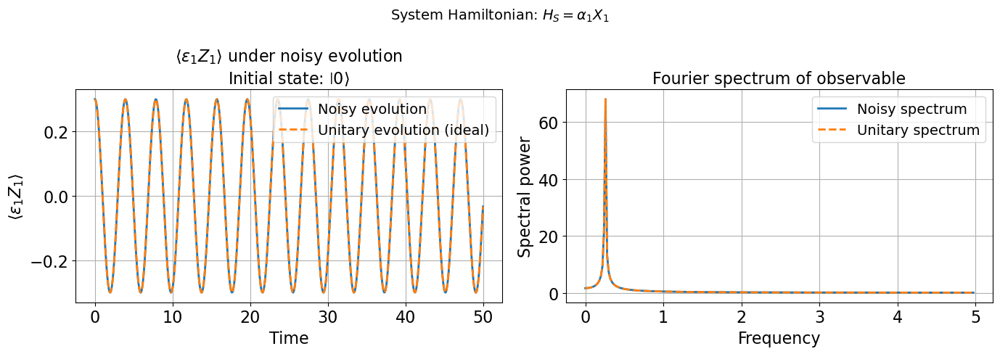

The dominant frequency from the Fourier transform is: 0.2595 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.2595 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%


In [7]:
import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters

g = 0.01
num_modes_per_bath = 5
num_qubits = 1  # Number of qubits
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 50, 500)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\1QUBITS" #To save the images

# Function to build local operators embedded in full Hilbert space
def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)

# Bath creation/annihilation operators
# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁ and ε₂
epsilon1=0.3
alpha1 = 0.8
# System Hamiltonian: H_S = X₁ + X₂
Hs = alpha1* X1_full 

# Bath Hamiltonian
# Assign different omega_i to each bath mode
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb  
# Initial state of the full system: (|00⟩ + |11⟩)/√2 ⊗ |0⟩_bath
zero0 = tensor(basis(2, 0), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])

# Evolution with noise (open system)
result_noisy = mesolve(H_total, zero0, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, zero0, tlist)

# Reduced observable: ε₁ Z₁
Z1 = sigmaz()
observable_op = epsilon1 *Z1

# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # Partial trace to single qubits
        rho_noisy_0 = noisy_state.ptrace(0)
        # Normalize reduced single-qubit density matrices
        rho_noisy_0 = rho_noisy_0 / rho_noisy_0.tr()
        val_noisy = expect(observable_op, rho_noisy_0)
        observable_noisy.append(val_noisy)
        #For the ideal case
        rho_unitary = unitary_state.ptrace(0)
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_unitary.append(val_unitary)        

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 X_1$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 \rangle$ under noisy evolution' '\n'
    r'Initial state: $ \left |0\right \rangle $'

)
axs[0].legend( loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')

axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend()
axs[1].grid(True)

name=  "H_1_kappa_" + str(kappa) +".pdf"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()


# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

Now I am testing a different $H_{sb}$, with a differente observable
\begin{equation}
H_{SB} = \sum_{i=1}^{N} \sum_{k=1}^{M} \frac{g}{\sqrt{M}} X_i \left( a_{ik} + a_{ik}^\dagger \right)
\end{equation}

\begin{equation}
O = \sum_i \epsilon_i X_i
\end{equation}

### Z_1

\begin{equation}
H_s = Z_1
\end{equation}

In [4]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters

g = 0.01
num_modes_per_bath = 2
num_qubits = 1  # Number of qubits
N = 2  # Fock space truncation
kappa = 0.0001
tlist = np.linspace(0, 50, 500)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\1QUBITS" #To save the images

# Function to build local operators embedded in full Hilbert space
def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
Z1_full = build_op(sigmaz(), 0)

# Bath creation/annihilation operators
# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁ and ε₂
epsilon1=0.3
alpha1 = 0.8
# System Hamiltonian: H_S = Z₁ 
Hs = alpha1* Z1_full 

# Bath Hamiltonian
# Assign different omega_i to each bath mode
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    X = build_op(sigmax(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * X * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system:
zero = tensor(basis(2, 0), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
one  = tensor(basis(2, 1), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
psi = (zero+one).unit()

# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Reduced observable: ε₁ Z₁
X1 = sigmax()
observable_op = epsilon1 * X1

# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # Partial trace to single qubits
        rho_noisy_0 = noisy_state.ptrace(0)
        # Normalize reduced single-qubit density matrices
        rho_noisy_0 = rho_noisy_0 / rho_noisy_0.tr()
        val_noisy = expect(observable_op, rho_noisy_0)
        observable_noisy.append(val_noisy)
        #For the ideal case
        rho_unitary = unitary_state.ptrace(0)
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_unitary.append(val_unitary)        

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 Z_1$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 X_1 \rangle$ under noisy evolution' '\n'
    r'Initial state: $ \dfrac{1}{\sqrt{2}} (\left |0\right \rangle +\left |1\right \rangle)$'

)
axs[0].legend( loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')

axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend()
axs[1].grid(True)

name=  "ket_0_Z_1"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()



# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

NameError: name 'layout' is not defined

## 2 QUBITS

### X_1 + X_2

\begin{equation}
H_S = \alpha_1X_1 + \alpha_2X_2
\end{equation}


In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
from scipy.signal import find_peaks



# Parameters

g = 0.01
num_modes_per_bath = 2
N = 3  # Fock space truncation
kappa = 0.1
tlist = np.linspace(0,50, 100)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\2QUBITS" #To save the images
num_qubits = 2  # Number of qubits

# Function to build local operators embedded in full Hilbert space
def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)

# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁ and ε₂
epsilon1=0.1
epsilon2=1.2
alpha1 = 0.8
alpha2 = 0.7
# System Hamiltonian: H_S = X₁ + X₂
Hs = alpha1* X1_full + alpha2*X2_full

# Bath Hamiltonian
# Assign different omega_i to each bath mode
omega_list = np.random.uniform(0.1, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(2):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system: (|00⟩ + |11⟩)/√2 ⊗ |0⟩_bath
zero0 = tensor(basis(2, 0), basis(2, 0), *[basis(N, 0) for _ in range(2 * num_modes_per_bath)])


psi= zero0

    
# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)

# Reduced observable: ε₁ Z₁ + ε₂ Z₂ on the 2-qubit system
Z1 = tensor(sigmaz(), qeye(2))
Z2 = tensor(qeye(2), sigmaz())
observable_op = epsilon1 * Z1 + epsilon2 * Z2

# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # Partial trace to single qubits
    rho_noisy = noisy_state.ptrace([0, 1])
    rho_noisy = rho_noisy / rho_noisy.tr()  # Normalize the reduced density matrix
    # Compute expectation value of the observable
    val_noisy = expect(observable_op, rho_noisy)
    observable_noisy.append(val_noisy)

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 X_1 +\alpha_2 X_2$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 \rangle(t)$ under noisy evolution' '\n'
    r'Initial state: $|00\rangle$'

)
axs[0].legend( loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].legend()
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
axs[1].grid(True)
name = "X1_X2"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()


# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

: 

### X_1X_2+Y_1Y_2

\begin{equation}
H_S = \alpha_1 X_1X_2+ \alpha_2 Y_1Y_2
\end{equation}

In [1]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
g = 0.05
num_modes_per_bath = 2
N = 2  # Fock space truncation
kappa = 0.1
tlist = np.linspace(0, 50, 100)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\2QUBITS" #To save the images
num_qubits = 2  # Number of qubits

# Function to build local operators embedded in full Hilbert space
def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Y1_full = build_op(sigmay(), 0)
Y2_full = build_op(sigmay(), 1)

# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁ and ε₂
epsilon1=0.3
epsilon2=1.2
alpha1 = 0.8
beta1 = 0.7
# System Hamiltonian: H_S = α₁ X₁ X₂ + α₂ Y₁ Y₂

Hs = alpha1* X1_full * X2_full  + beta1* Y1_full * Y2_full

# Bath Hamiltonian
# Assign different omega_i to each bath mode
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(2):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system:  |00⟩ ⊗ |0⟩_bath
zero0 = tensor(basis(2, 1), basis(2, 0), *[basis(N, 0) for _ in range(2 * num_modes_per_bath)])


psi= zero0

    
# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)

# Reduced observable: ε₁ Z₁ + ε₂ Z₂ on the 2-qubit system
Z1 = tensor(sigmaz(), qeye(2))
Z2 = tensor(qeye(2), sigmaz())
observable_op = epsilon1 * Z1 + epsilon2 * Z2

# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    rho_noisy = noisy_state.ptrace([0, 1])
    rho_noisy = rho_noisy / rho_noisy.tr()  # Normalize the reduced density matrix
    # Compute expectation value of the observable
    val_noisy = expect(observable_op, rho_noisy)
    # Append the value to the list

    observable_noisy.append(val_noisy)

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 X_1X_2 +\beta_1 Y_1Y_2$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 \rangle(t)$ under noisy evolution' '\n'
    r'Initial state: $ \left |10\right \rangle $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
name = "X1X2_Y1Y2"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

NameError: name 'layout' is not defined

Now I am testing a different $H_{sb}$, with a differente observable
\begin{equation}
H_{SB} = \sum_{i=1}^{N} \sum_{k=1}^{M} \frac{g}{\sqrt{M}} X_i \left( a_{ik} + a_{ik}^\dagger \right)
\end{equation}

\begin{equation}
O = \sum_i \epsilon_i X_i
\end{equation}

### Z_1 + Z_2

\begin{equation}
 H_s = \alpha_1 Z_1 + \alpha_2 Z_2
\end{equation}

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
from scipy.signal import find_peaks



# Parameters

g = 0.05
num_modes_per_bath = 2
N = 2  # Fock space truncation
kappa = 0.1
tlist = np.linspace(0, 50, 100)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\2QUBITS" #To save the images
num_qubits = 2  # Number of qubits

# Function to build local operators embedded in full Hilbert space
def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)

# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁ and ε₂
epsilon1=0.3
epsilon2=1.2
alpha1 = 0.8
alpha2 = 0.7
# System Hamiltonian: H_S = Z₁ + Z₂
Hs = alpha1* Z1_full + alpha2*Z2_full

# Bath Hamiltonian
# Assign different omega_i to each bath mode
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(2):
    X = build_op(sigmax(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * X * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system: (|00⟩ + |11⟩)/√2 ⊗ |0⟩_bath
zero0 = tensor(basis(2, 0), basis(2, 0), *[basis(N, 0) for _ in range(2 * num_modes_per_bath)])
one1 = tensor(basis(2, 1), basis(2, 0), *[basis(N, 0) for _ in range(2 * num_modes_per_bath)])

psi= zero0 + one1
psi = psi.unit()  # Normalize the state

    
# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)

# Reduced observable: ε₁ x₁ + ε₂ x₂ on the 2-qubit system
X1 = tensor(sigmax(), qeye(2))
X2 = tensor(qeye(2), sigmax())
observable_op = epsilon1 * X1 + epsilon2 * X2

# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    rho_noisy = noisy_state.ptrace([0, 1])
    rho_noisy = rho_noisy / rho_noisy.tr()
    val_noisy = expect(observable_op, rho_noisy)
    observable_noisy.append(val_noisy)

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 Z_1 +\alpha_2 Z_2$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 \rangle(t)$ under noisy evolution' '\n'
    r'Initial state: $ \dfrac{1}{\sqrt{2}}|00\rangle + |10\rangle $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].legend(loc='upper right')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].grid(True)
name = "Z1_Z2"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## 3 qubits

### X1+X2+X3

\begin{equation}
H_S = \alpha_1X_1+ \alpha_2X_2 + \alpha_3X_3
\end{equation}

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 10, 50)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\3QUBITS" #To save the images


def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(3)] + [qeye(N) for _ in range(3 * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
X3_full = build_op(sigmax(), 2)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Z3_full = build_op(sigmaz(), 2)


# Bath creation/annihilation operators
a_ops = []
for i in range(3 * num_modes_per_bath):
    ops = [qeye(2), qeye(2), qeye(2)] + [destroy(N) if j == i else qeye(N) for j in range(3 * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁, ε₂, and ε₃
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
alpha1 = 0.7
alpha2 = 1.1
alpha3 = 1.5

# Observable operators in the full Hilbert space
Z1 = tensor(sigmaz(), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz())
observable_op= epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3

# System Hamiltonian: H_S = ε₁ X₁ + ε₂ X₂ + ε₃ X₃
Hs = alpha1 * X1_full + alpha2 * X2_full + alpha3 * X3_full

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(3):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system: (|00⟩ + |11⟩)/√2 ⊗ |0⟩_bath
zero0 = tensor(basis(2, 0), basis(2, 0), basis(2, 0), *[basis(N, 0) for _ in range(3 * num_modes_per_bath)])
psi= zero0
    
# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    rho_noisy = noisy_state.ptrace([0, 1, 2])
    rho_noisy = rho_noisy / rho_noisy.tr()  # Normalize the reduced density matrix
    # Compute expectation value of the observable
    val_noisy = expect(observable_op, rho_noisy)
    # Append the value to the list
    observable_noisy.append(val_noisy)

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1,2])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 X_1 + \alpha_2X_2+ \alpha_3 X_3$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2+ \epsilon_3 Z_3 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2+ \epsilon_3 Z_3 \rangle(t)$ under noisy evolution' '\n'
    r'Initial state: $ \left |000\right \rangle $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
name = "X1_X2_X3"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### X_1 * X_2 + Y_1 * Y_2 + X_2 * X_3 + Y_2 * Y_3

\begin{equation}
H_s= \alpha_1 X_1 * X_2 + \alpha_2Y_1 * Y_2 + \alpha_3X_2 * X_3 + \alpha_4Y_2 * Y_3
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
num_modes_per_bath = 1
g = 0.05
N = 3  # Fock space truncation
tlist = np.linspace(0, 20, 200)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\3QUBITS" #To save the images


def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(3)] + [qeye(N) for _ in range(3 * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)


# Pauli operators for qubits (full system)
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
X3_full = build_op(sigmax(), 2)
Y1_full = build_op(sigmay(), 0)
Y2_full = build_op(sigmay(), 1)
Y3_full = build_op(sigmay(), 2)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Z3_full = build_op(sigmaz(), 2)


# Bath creation/annihilation operators
a_ops = []
for i in range(3 * num_modes_per_bath):
    ops = [qeye(2), qeye(2), qeye(2)] + [destroy(N) if j == i else qeye(N) for j in range(3 * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁, ε₂, and ε₃
epsilon1= 1.1
epsilon2= 1.2
epsilon3= 0.9
epsilon4= 0.9
alpha1 = 0.7
alpha2 = 1.1
alpha3 = 1.1
beta1 = 0.8
beta2 = 0.5
beta3 = 0.9

# Observable operators in the full Hilbert space
Z1 = tensor(sigmaz(), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz())
observable_op= epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3
# System Hamiltonian: H_S = X₁ X₂ + Y₁ Y₂ + X₂ X₃ + Y₂ Y₃ (extended to 3 qubits)
Hs = alpha1*X1_full * X2_full + beta1*Y1_full * Y2_full + alpha2*X2_full * X3_full + beta2*Y2_full * Y3_full

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 0.6, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(3):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system: (|00⟩ + |11⟩)/√2 ⊗ |0⟩_bath
zero0 = tensor(basis(2, 1), basis(2, 0), basis(2, 0), *[basis(N, 0) for _ in range(3 * num_modes_per_bath)])
psi= zero0
    
# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # Partial trace to single qubits
    rho_noisy= noisy_state.ptrace([0, 1, 2])
    # Normalize reduced single-qubit density matrices
    rho_noisy = rho_noisy / rho_noisy.tr()
    val_noisy = expect(observable_op, rho_noisy)

    observable_noisy.append(val_noisy)

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1,2])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_s= \alpha_1 X_1X_2 + \beta_2 Y_1Y_2 +\alpha_2 X_2 X_3 + \beta_2 Y_2 Y_3$', fontsize=14, y=y )

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2+ \epsilon_3 Z_3 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2+ \epsilon_3 Z_3 \rangle(t)$ under noisy evolution' '\n'
    r'Initial state: $ \left |100\right \rangle $'

)
axs[0].legend()
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy > 0


freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend()
axs[1].grid(True)
name = "X1X2_Y1Y2_X2X3_Y2Y3"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### Z1+Z2+Z3

\begin{equation}
H_S = \alpha_1Z_1+ \alpha_2Z_2 + \alpha_3Z_3
\end{equation}

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.01
tlist = np.linspace(0, 50, 200)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\3QUBITS" #To save the images


def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(3)] + [qeye(N) for _ in range(3 * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
X3_full = build_op(sigmax(), 2)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Z3_full = build_op(sigmaz(), 2)


# Bath creation/annihilation operators
a_ops = []
for i in range(3 * num_modes_per_bath):
    ops = [qeye(2), qeye(2), qeye(2)] + [destroy(N) if j == i else qeye(N) for j in range(3 * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁, ε₂, and ε₃
epsilon1= 0.8
epsilon2= 0.5
epsilon3= 0.9
alpha1 = 1.11
alpha2 = 1.1
alpha3 = 1.2

# Observable operators in the full Hilbert space
X1 = tensor(sigmax(), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax())
observable_op= epsilon1 * X1 + epsilon2 * X2 + epsilon3  *X3

# System Hamiltonian: H_S = ε₁ Z₁ + ε₂ Z₂ + ε₃ Z₃
Hs = alpha1 * Z1_full + alpha2 * Z2_full + alpha3 * Z3_full

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(3):
    X = build_op(sigmax(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * X * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system: (|00⟩ + |11⟩)/√2 ⊗ |0⟩_bath
zero0 = tensor(basis(2, 0), basis(2, 0), basis(2, 0), *[basis(N, 0) for _ in range(3 * num_modes_per_bath)])
one1 = tensor(basis(2, 1), basis(2, 0), basis(2, 0), *[basis(N, 0) for _ in range(3 * num_modes_per_bath)])
psi= zero0+ one1
psi = psi.unit()  # Normalize the state
    
# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):

    rho_unitary = unitary_state.ptrace([0, 1,2])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    rho_noisy = noisy_state.ptrace([0, 1,2])
    rho_noisy = rho_noisy / rho_noisy.tr()
    val_noisy = expect(observable_op, rho_noisy)
    observable_noisy.append(val_noisy)

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 Z_1 + \alpha_2Z_2+ \alpha_3 Z_3$', fontsize=18, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2+ \epsilon_3 X_3 \rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2+ \epsilon_3 X_3 \rangle(t)$ under noisy evolution' '\n'
    r'Initial state: $  \dfrac {1}{\sqrt{2}} (\left |000\right \rangle+\left |100\right \rangle) $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
name = "Z1_Z2_Z3"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## 4 Qubits

### $\alpha_1 X_1 + \alpha_2 X_2 + \alpha_3 X_3 + \alpha_4 X_4$

\begin{equation}
H_S = \alpha_1 X_1 + \alpha_2 X_2 + \alpha_3 X_3 + \alpha_4 X_4
\end{equation}

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
num_qubits = 4
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 10, 50)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\4QUBITS" #To save the images


def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
X3_full = build_op(sigmax(), 2)
X4_full = build_op(sigmax(), 3)
Y1_full = build_op(sigmay(), 0)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Z3_full = build_op(sigmaz(), 2)
Z4_full = build_op(sigmaz(), 3)


# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁, ε₂, and ε₃
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
epsilon4= 0.3
alpha1 = 0.7
alpha2 = 1.1
alpha3 = 1.5
alpha4 = 0.3

# Observable operators in the full Hilbert space
Z1 = tensor(sigmaz(), qeye(2), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz(), qeye(2))
Z4 = tensor(qeye(2), qeye(2), qeye(2), sigmaz())
observable_op= epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3 + epsilon4 * Z4

# System Hamiltonian
Hs = alpha1 * X1_full + alpha2 * X2_full + alpha3 * X3_full + alpha4 * X4_full

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system
zero0 = tensor(basis(2, 0), basis(2, 0), basis(2, 0),basis(2, 0), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
psi = zero0




# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # Partial trace to single qubits
    rho_noisy_0 = noisy_state.ptrace(0)
    rho_noisy_1 = noisy_state.ptrace(1)
    rho_noisy_2 = noisy_state.ptrace(2)
    rho_noisy_3 = noisy_state.ptrace(3)
    # Normalize reduced single-qubit density matrices
    rho_noisy_0 = rho_noisy_0 / rho_noisy_0.tr()
    rho_noisy_1 = rho_noisy_1 / rho_noisy_1.tr()
    rho_noisy_2 = rho_noisy_2 / rho_noisy_2.tr()
    rho_noisy_3 = rho_noisy_3 / rho_noisy_3.tr()
    # Probability of |1> state for each qubit (population element [1,1])
    p_noisy_0 = rho_noisy_0[1, 1].real
    p_noisy_1 = rho_noisy_1[1, 1].real
    p_noisy_2 = rho_noisy_2[1, 1].real
    p_noisy_3 = rho_noisy_3[1, 1].real
    # Your formula for expectation value
    val_noisy = epsilon1 * (1 - 2 * p_noisy_0) + epsilon2 * (1 - 2 * p_noisy_1)+ epsilon3 * (1 - 2 * p_noisy_2)+ epsilon4 * (1 - 2 * p_noisy_3)

    observable_noisy.append(val_noisy)

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1,2,3])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 X_1 + \alpha_2X_2+ \alpha_3 X_3+ \alpha_4X_4$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 + \epsilon_4 Z_4\rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 + \epsilon_4 Z_4\rangle$ under noisy evolution' '\n'
   r'Initial state: $ \left |0000\right \rangle $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)


# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
name = "X1_X2_X3_X4"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### $\alpha_1 X_1 X_2 + \alpha_2 Y_1 Y_2 + \alpha_3 X_2 X_3 + \alpha_4 Y_2 Y_3 + \alpha_5 X_3 X_4 + \alpha_6 Y_3 Y_4$

\begin{equation}
H_S = \alpha_1 X_1 X_2 + \alpha_2 Y_1 Y_2 + \alpha_3 X_2 X_3 + \alpha_4 Y_2 Y_3 + \alpha_5 X_3 X_4 + \alpha_6 Y_3 Y_4
\end{equation}

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
num_qubits = 4
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 10, 50)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\4QUBITS" #To save the images


def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
X3_full = build_op(sigmax(), 2)
X4_full = build_op(sigmax(), 3)
Y1_full = build_op(sigmay(), 0)
Y2_full = build_op(sigmay(), 1)
Y3_full = build_op(sigmay(), 2)
Y4_full = build_op(sigmay(), 3)

Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Z3_full = build_op(sigmaz(), 2)
Z4_full = build_op(sigmaz(), 3)


# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁, ε₂, and ε₃
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
epsilon4= 0.3
alpha1 = 0.7
alpha2 = 1.1
alpha3 = 1.5
alpha4 = 0.3
alpha5 = 0.5
alpha6 = 0.9
# Observable operators in the full Hilbert space
Z1 = tensor(sigmaz(), qeye(2), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz(), qeye(2))
Z4 = tensor(qeye(2), qeye(2), qeye(2), sigmaz())

observable_op= epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3 + epsilon4 * Z4


# System Hamiltonian: H_S = ε₁ X₁ + ε₂ X₂ + ε₃ X₃
Hs = alpha1*X1_full * X2_full + alpha2*Y1_full * Y2_full + alpha3*X2_full * X3_full + alpha4*Y2_full * Y3_full +alpha5* X3_full * X4_full + alpha6* Y3_full * Y4_full


# System Hamiltonian
Hs = alpha1 * X1_full + alpha2 * X2_full + alpha3 * X3_full + alpha4 * X4_full

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    Z = build_op(sigmaz(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system
zero0 = tensor(basis(2, 1), basis(2, 0), basis(2, 0),basis(2, 0), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
psi = zero0




# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # Partial trace to single qubits
    rho_noisy= noisy_state.ptrace([0, 1, 2, 3])
    # Normalize reduced single-qubit density matrices
    rho_noisy = rho_noisy / rho_noisy.tr()
    # Probability of |1> state for each qubit (population element [1,1])
    val_noisy = expect(observable_op, rho_noisy)
    observable_noisy.append(val_noisy)

    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1,2,3])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 X_1 X_2 + \alpha_2 Y_1 Y_2 + \alpha_3 X_2 X_3 + \alpha_4 Y_2 Y_3 + \alpha_5 X_3 X_4 + \alpha_6 Y_3 Y_4 $', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 + \epsilon_4 Z_4\rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 + \epsilon_4 Z_4\rangle$ under noisy evolution' '\n'
    r'Initial state: $ \left |1000\right \rangle $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)


# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
name = "X1X2_Y1Y2_X2X3_Y2Y3_X3X4_Y3Y4"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### $\alpha_1 Z_1 + \alpha_2 Z_2 + \alpha_3 Z_3 + \alpha_4 Z_4$

\begin{equation}
H_S = \alpha_1 Z_1 + \alpha_2 Z_2 + \alpha_3 Z_3 + \alpha_4 Z_4
\end{equation}

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters
num_qubits = 4
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 10, 50)
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\4QUBITS" #To save the images


def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators in the full Hilbert space
X1_full = build_op(sigmax(), 0)
X2_full = build_op(sigmax(), 1)
X3_full = build_op(sigmax(), 2)
X4_full = build_op(sigmax(), 3)
Y1_full = build_op(sigmay(), 0)
Z1_full = build_op(sigmaz(), 0)
Z2_full = build_op(sigmaz(), 1)
Z3_full = build_op(sigmaz(), 2)
Z4_full = build_op(sigmaz(), 3)


# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))

# Random coefficients for ε₁, ε₂, and ε₃
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
epsilon4= 0.3
alpha1 = 0.7
alpha2 = 1.1
alpha3 = 1.5
alpha4 = 0.3

# Observable operators in the full Hilbert space
X1 = tensor(sigmax(), qeye(2), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax(), qeye(2))
X4 = tensor(qeye(2), qeye(2), qeye(2), sigmax())
observable_op= epsilon1 * X1 + epsilon2 * X2 + epsilon3 * X3 + epsilon4 * X4

# System Hamiltonian
Hs = alpha1 * Z1_full + alpha2 * Z2_full + alpha3 * Z3_full + alpha4 * Z4_full

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    X = build_op(sigmax(), qubit)
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * X * (a + a.dag())

# Total Hamiltonian
H_total = Hs + Hb + Hsb

# Initial state of the full system
zero0 = tensor(basis(2, 0), basis(2, 0), basis(2, 0),basis(2, 0), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
one1 = tensor(basis(2, 1), basis(2, 0), basis(2, 0),basis(2, 0), *[basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
psi= zero0+ one1
psi = psi.unit()  # Normalize the state




# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs, psi, tlist)


# Compute expectation values with normalization of reduced density matrices
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    #For the ideal case
    rho_unitary = unitary_state.ptrace([0, 1,2,3])
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    rho_noisy = noisy_state.ptrace([0, 1,2,3])
    rho_noisy = rho_noisy / rho_noisy.tr()
    val_noisy = expect(observable_op, rho_noisy)
    observable_noisy.append(val_noisy)
    

# Fourier Transform of energy from noisy expectation values
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Fourier Transform of energy from unitary expectation values
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs_noisy = freqs_unitary = freqs
spectrum_noisy = energy_noisy_fft
spectrum_unitary = energy_unitary_fft

# Plot observable and its Fourier spectrum side by side
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(r'System Hamiltonian: $H_S = \alpha_1 Z_1 + \alpha_2Z_2+ \alpha_3 Z_3+ \alpha_4Z_4$', fontsize=14, y=y)

# Left: Observable ⟨ε₁ Z₁ + ε₂ Z₂⟩
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution (ideal)', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 + \epsilon_3 X_3 + \epsilon_4 X_4\rangle$')
axs[0].set_title(
    r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 + \epsilon_3 X_3 + \epsilon_4 X_4\rangle$ under noisy evolution' '\n'
   r'Initial state: $ \dfrac {1}{\sqrt{2}} (\left |0000\right \rangle+\left |1000\right \rangle) $'

)
axs[0].legend(loc='upper right')
axs[0].grid(True)


# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs_noisy >= 0

freqs_noisy= freqs_noisy[pos_mask]
freqs_unitary = freqs_unitary[pos_mask]
spectrum_noisy = spectrum_noisy[pos_mask]
spectrum_unitary = spectrum_unitary[pos_mask]
axs[1].plot(freqs_noisy, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs_unitary, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)
name = "Z1_Z2_Z3_Z4"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(spectrum_noisy)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs_noisy[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(spectrum_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary = freqs_unitary[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")


## N QUBIT CODE for Hsb Z, with bosonic bath

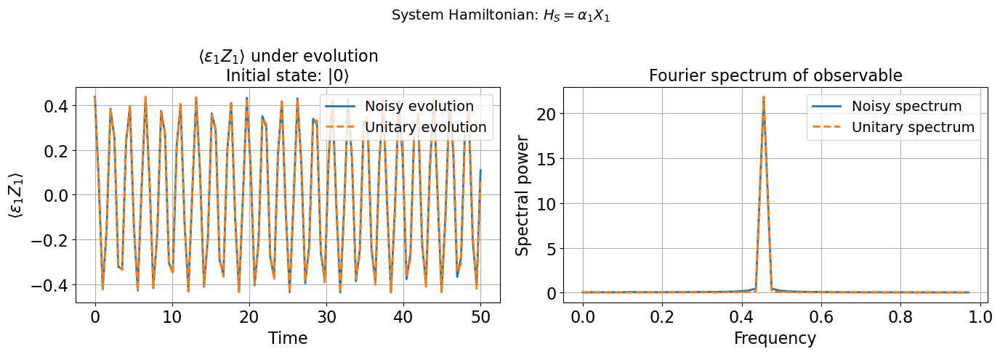

The dominant frequency from the Fourier transform is: 0.4554 (units of 1/time)
For 1 qubit, only the first Hamiltonian is applicable.


In [8]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters - USER CAN CHANGE THESE
num_qubits = 1  # Change this to the desired number of qubits
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 50, 100)
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\{num_qubits}QUBITS"
# Generate random coefficients for the Hamiltonian and observable
epsilon = np.random.uniform(0.1, 1.0, num_qubits)  # Coefficients for observable
alpha = np.random.uniform(0.1, 1.5, 2*num_qubits+1)  # Coefficients for system Hamiltonian


def build_op(op_qubit, pos):
    """Build an operator acting on position 'pos' in the full Hilbert space"""
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Create Pauli operators for all qubits
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]

# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))


# Observable operator acting only on the qubits' Hilbert space
Z_ops_qubits = [tensor([sigmaz() if j == i else qeye(2) for j in range(num_qubits)]) for i in range(num_qubits)]
observable_op = sum(epsilon[i] * Z_ops_qubits[i] for i in range(num_qubits))


# System Hamiltonian: Nearest-neighbor XX and YY interactions
Hs_1 = 0
for i in range(num_qubits):
    Hs_1 += alpha[i]* X_ops[i]
Hs_2 = 0
for i in range(num_qubits-1):
    Hs_2+= alpha[i] * X_ops[i] * X_ops[i+1]  # XX coupling
    Hs_2 += alpha[2*i+1] * Y_ops[i] * Y_ops[i+1]  # YY coupling

# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    Z = Z_ops[qubit]
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * Z * (a + a.dag())

# Total Hamiltonian
H_total_1 = Hs_1 + Hb + Hsb
H_total_2 = Hs_2 + Hb + Hsb

# Initial state: all qubits in |0⟩ and all bath modes in vacuum
zero_state = tensor([basis(2, 0) for _ in range(num_qubits)] + [basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
psi = zero_state.unit()

# Collapse operators (for open system evolution)
c_ops = [np.sqrt(kappa) * a for a in a_ops]

for i in range(2):
    if i == 0:
        H_total = H_total_1
        Hs = Hs_1
    else:
        if num_qubits == 1:
            print("For 1 qubit, only the first Hamiltonian is applicable.")
            continue
        else:
            H_total = H_total_2
            Hs = Hs_2

    # Evolution with noise (open system)
    result_noisy = mesolve(H_total, psi, tlist, [])

    # Evolution without noise (unitary)
    result_unitary = sesolve(Hs, psi, tlist)

    # Compute expectation values
    observable_noisy = []
    observable_unitary = []

    for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
        # For noisy case: calculate expectation value using individual qubit populations
        val_noisy = 0
        for j in range(num_qubits):
            rho_noisy = noisy_state.ptrace(j)
            rho_noisy = rho_noisy / rho_noisy.tr()  # Normalize
            p_noisy = rho_noisy[1, 1].real  # Probability of |1⟩ state
            val_noisy += epsilon[j] * (1 - 2 * p_noisy)
        observable_noisy.append(val_noisy)

        # For unitary case: calculate expectation value directly
        rho_unitary = unitary_state.ptrace(list(range(num_qubits)))
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_unitary.append(val_unitary)

    # Fourier Transform
    energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
    energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
    freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

    # Select only positive frequencies
    pos_mask = freqs >= 0
    freqs = freqs[pos_mask]
    spectrum_noisy = energy_noisy_fft[pos_mask]
    spectrum_unitary = energy_unitary_fft[pos_mask]

    # Plotting
    if layout == 'vertical':
        fig, axs = plt.subplots(2, 1, figsize=(8, 10))
    else:
        fig, axs = plt.subplots(1, 2, figsize=(14, 5))


    # Create Hamiltonian title string
    if i == 0:
        ham_title = r'System Hamiltonian: $H_S = '
        for j in range(num_qubits):
            ham_title += fr'\alpha_{j+1} X_{j+1}'
            if j < num_qubits - 1:
                ham_title += ' + '
        ham_title += '$'
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    else:
        # For the second Hamiltonian with nearest-neighbor interactions
        ham_title = r'System Hamiltonian: $H_S = '
        for j in range(num_qubits - 1):
            ham_title += fr'\alpha_{2*j+1} X_{j+1} X_{j+2} + \alpha_{2*j+2} Y_{j+1} Y_{j+2}'
            if j < num_qubits - 2:
                ham_title += ' + '
            ham_title += '$'
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    
    # Left: Observable
    fig.suptitle(ham_title, fontsize=14, y=y)
    if num_qubits == 1:
        obs_label = r'$\langle ' + fr'\epsilon_1 Z_1 \rangle$'
    else:
        obs_label = r'$\langle ' + ' + '.join([fr'\epsilon_{i+1} Z_{i+1}' for i in range(num_qubits)]) + r'\rangle$'
    axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
    axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution', lw=2, color='tab:orange')
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel(obs_label)
    axs[0].set_title(f'{obs_label} under evolution\nInitial state: |{"0"*num_qubits}⟩')
    axs[0].legend(loc='upper right')
    axs[0].grid(True)

    # Right: Fourier spectrum
    axs[1].plot(freqs, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
    axs[1].plot(freqs, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
    axs[1].set_xlabel('Frequency')
    axs[1].set_ylabel('Spectral power')
    axs[1].set_title('Fourier spectrum of observable')
    axs[1].legend(loc='upper right')
    axs[1].grid(True)

    # Save and show
    name = f"{num_qubits}_{title}_general_code.pdf"
    os.makedirs(save_base_path, exist_ok=True)
    filename = os.path.join(save_base_path, name)
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

    # Print dominant frequency
    idx_peak = np.argmax(spectrum_noisy)
    freq_peak = freqs[idx_peak]
    print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")

## N QUBIT CODE for Hsb X, with bosonic bath

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os
import re
np.random.seed(42)

# Parameters - USER CAN CHANGE THESE
num_qubits = 4  # Change this to the desired number of qubits
g = 0.05
num_modes_per_bath = 1
N = 2  # Fock space truncation
kappa = 0.05
tlist = np.linspace(0, 50, 100)
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\{num_qubits}QUBITS"
# Generate random coefficients for the Hamiltonian and observable
epsilon = np.random.uniform(0.1, 1.0, num_qubits)  # Coefficients for observable
alpha = np.random.uniform(0.1, 1.5, 2*num_qubits+1)  # Coefficients for system Hamiltonian


def build_op(op_qubit, pos):
    """Build an operator acting on position 'pos' in the full Hilbert space"""
    ops = [qeye(2) for _ in range(num_qubits)] + [qeye(N) for _ in range(num_qubits * num_modes_per_bath)]
    ops[pos] = op_qubit
    return tensor(ops)

# Create Pauli operators for all qubits
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]

# Bath creation/annihilation operators
a_ops = []
for i in range(num_qubits * num_modes_per_bath):
    ops = [qeye(2) for _ in range(num_qubits)] + [destroy(N) if j == i else qeye(N) for j in range(num_qubits * num_modes_per_bath)]
    a_ops.append(tensor(ops))


# Observable operator acting only on the qubits' Hilbert space
X_ops_qubits = [tensor([sigmax() if j == i else qeye(2) for j in range(num_qubits)]) for i in range(num_qubits)]
observable_op = sum(epsilon[i] * X_ops_qubits[i] for i in range(num_qubits))


# System Hamiltonian: Nearest-neighbor XX and YY interactions
Hs_1 = 0
for i in range(num_qubits):
    Hs_1 += alpha[i]* Z_ops[i]


# Bath Hamiltonian
omega_list = np.random.uniform(0.5, 2.0, len(a_ops))  
Hb = sum(omega_list[i] * a_ops[i].dag() * a_ops[i] for i in range(len(a_ops)))

# System-bath coupling (pure dephasing)
Hsb = 0
for qubit in range(num_qubits):
    x = X_ops[qubit]
    for mode in range(num_modes_per_bath):
        a = a_ops[qubit * num_modes_per_bath + mode]
        Hsb += (g / np.sqrt(num_modes_per_bath)) * x * (a + a.dag())

# Total Hamiltonian
H_total_1 = Hs_1 + Hb + Hsb

# Initial state: all qubits in |0⟩ and all bath modes in vacuum
zero_state = tensor([basis(2, 0) for _ in range(num_qubits)] + [basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
one_state =  tensor([basis(2,1)]+ [basis(2, 0) for _ in range(1,num_qubits)] + [basis(N, 0) for _ in range(num_qubits * num_modes_per_bath)])
psi = zero_state+one_state
psi = psi.unit()

# Collapse operators (for open system evolution)
c_ops = [np.sqrt(kappa) * a for a in a_ops]


H_total = H_total_1

# Evolution with noise (open system)
result_noisy = mesolve(H_total, psi, tlist, [])

# Evolution without noise (unitary)
result_unitary = sesolve(Hs_1, psi, tlist)


# Compute expectation values
observable_noisy = []
observable_unitary = []

for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
    # For unitary case: calculate expectation value directly
    rho_unitary = unitary_state.ptrace(list(range(num_qubits)))
    rho_unitary = rho_unitary / rho_unitary.tr()
    val_unitary = expect(observable_op, rho_unitary)
    observable_unitary.append(val_unitary)
    rho_noisy = noisy_state.ptrace(list(range(num_qubits)))
    rho_noisy = rho_noisy / rho_noisy.tr()
    val_noisy = expect(observable_op, rho_noisy)
    observable_noisy.append(val_noisy)

# Fourier Transform
energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Select only positive frequencies
pos_mask = freqs >= 0
freqs = freqs[pos_mask]
spectrum_noisy = energy_noisy_fft[pos_mask]
spectrum_unitary = energy_unitary_fft[pos_mask]

# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))


# Create Hamiltonian title string

ham_title = r'System Hamiltonian: $H_S = '
for j in range(num_qubits):
    ham_title += fr'\alpha_{j+1} Z_{j+1}'
    if j < num_qubits - 1:
        ham_title += ' + '
ham_title += '$'
title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
# Left: Observable
fig.suptitle(ham_title, fontsize=14, y=y)
if num_qubits == 1:
    obs_label = r'$\langle ' + fr'\epsilon_1 X_1 \rangle$'
else:
    obs_label = r'$\langle ' + ' + '.join([fr'\epsilon_{i+1} X_{i+1}' for i in range(num_qubits)]) + r'\rangle$'
axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution', lw=2, color='tab:orange')
axs[0].set_xlabel('Time')
axs[0].set_ylabel(obs_label)
axs[0].set_title(
    rf'{obs_label} under evolution' '\n'
    rf'Initial state: $\frac{{1}}{{\sqrt{{2}}}} \left( |{"0"*num_qubits}\rangle + |1{"0"*(num_qubits-1)}\rangle \right)$'
)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
axs[1].plot(freqs, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
axs[1].plot(freqs, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].legend(loc='upper right')
axs[1].grid(True)

# Save and show
name = f"{num_qubits}_{title}_general_code.png"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()


# Print dominant frequency
idx_peak = np.argmax(spectrum_noisy)
freq_peak = freqs[idx_peak]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")

# Drude Lorentz Bath

In the theory of open quantum systems, a bosonic environment is often characterized by its **spectral density** $ J(\omega)$, which describes how different frequency modes of the bath couple to the system.

The **Drude-Lorentz spectral density** is a widely used model that captures dissipation with a finite memory time. It is particularly useful for describing condensed-phase environments such as solvents, phonon baths, or thermal reservoirs with exponential decay of correlations.

---

## Spectral Density Function

The Drude-Lorentz spectral density is defined as:

$$
J(\omega) = \frac{2 \lambda \gamma \omega}{\omega^2 + \gamma^2}
$$

---

### Meaning of each term:

- $ \omega $: Frequency of the environmental (bath) mode.
- $ \lambda $: **Reorganization energy** or **coupling strength**. This parameter quantifies the total coupling between the system and the bath.
- $ \gamma $: **Cutoff frequency** or **bath relaxation rate**. It sets the timescale for the decay of bath correlations, with $\tau_c = \gamma^{-1} $ being the correlation time.
- $ J(\omega) $: Spectral density, describing how strongly each frequency component of the bath couples to the system.

---

## Physical Interpretation

- At low frequencies $ (\omega \ll \gamma)$,$ J(\omega) \approx \frac{2 \lambda \omega}{\gamma} $, showing **Ohmic behavior**.
- At high frequencies $ (\omega \gg \gamma) $, the spectral density decays as $ J(\omega) \propto \omega^{-1} $, ensuring that high-frequency contributions are suppressed.

This model allows for **non-Markovian dynamics** due to the finite bath memory time, making it a versatile and realistic choice for simulations involving quantum dissipation.

## 1 QUBIT

### X_1

\begin{equation}
H_S = \alpha_1X_1
\end{equation}

10.0%. Run time:   0.02s. Est. time left: 00:00:00:00
20.0%. Run time:   0.04s. Est. time left: 00:00:00:00
30.1%. Run time:   0.06s. Est. time left: 00:00:00:00
40.1%. Run time:   0.08s. Est. time left: 00:00:00:00
50.1%. Run time:   0.10s. Est. time left: 00:00:00:00
60.1%. Run time:   0.12s. Est. time left: 00:00:00:00
70.1%. Run time:   0.15s. Est. time left: 00:00:00:00
80.2%. Run time:   0.17s. Est. time left: 00:00:00:00
90.2%. Run time:   0.18s. Est. time left: 00:00:00:00
100.0%. Run time:   0.21s. Est. time left: 00:00:00:00
Total run time:   0.21s


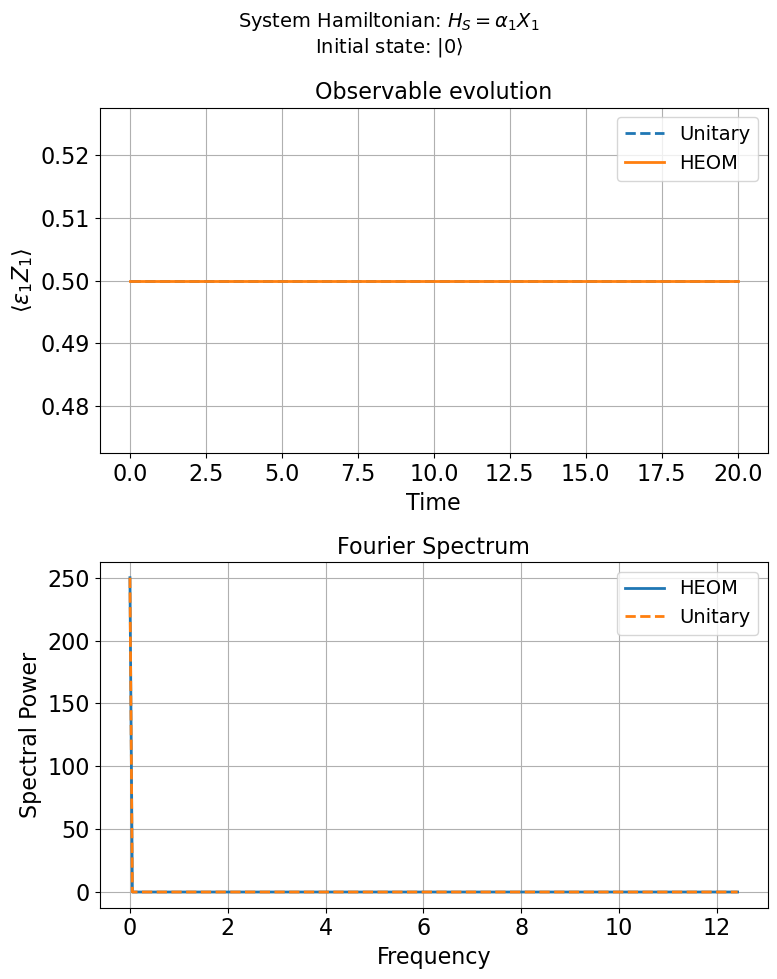

The dominant frequency from the Fourier transform is: 0.0000 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0000 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: nan%


C:\Users\jalej\AppData\Local\Temp\ipykernel_6540\3209643026.py:137: RuntimeWarning: invalid value encountered in scalar divide
  relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100


In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = sigmax()
Z1 = sigmaz()

#   Parameters
epsilon1=0.3
alpha_list = [0.6, 0.6, 0.6, 0.8, 1.0]
alpha_min = min(alpha_list)
lambda_d = 0.5 * alpha_min
gamma = 7 * alpha_min
max_depth=4
Nk=6
T = lambda_d

# System Hamiltonian
H_sys = alpha_list[0]*X1 

observable_op = 0.5 * (qeye(2) - sigmaz())


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d, gamma, T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)

# Bell states
zero0 = basis(2,0)
one0 = basis(2,1)

psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 500)

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    # Partial trace to single qubits
    rho_0 = state.ptrace(0)

    # Normalize reduced single-qubit density matrices
    rho_0 = rho_0 / rho_0.tr()
    
    val = expect(observable_op, rho_0)
    # Append the expectation value to the list

    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
# Evolution without noise (unitary)
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace(0)
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)        


# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]

# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 X_1$' + '\n' + r'Initial state: $|0\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1\rangle$')
axs[0].set_title('Observable evolution')
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)


name ="ket_0_x1"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/1Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### Z_1

\begin{equation}
H_s = Z_1
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = sigmax()
Z1 = sigmaz()




#   Parameters
epsilon1=0.3
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0]
alpha = np.array(alpha_list)
alpha_min = min(alpha_list)
lambda_d = 0.05 * alpha_min
gamma = 7 * alpha_min
max_depth=4
Nk=6
T = lambda_d

# System Hamiltonian
H_sys = alpha[1]*Z1 

observable_op = epsilon1 * X1 
# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(X1, lambda_d, gamma, T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)

# Bell states
zero0 = basis(2,0)
one0 = basis(2,1)

psi = (zero0+one0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 500)

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    # Partial trace to single qubits
    rho_0 = state.ptrace(0)

    # Normalize reduced single-qubit density matrices
    rho_0 = rho_0 / rho_0.tr()
    val = expect(observable_op, rho_0)
    observable_vals.append(val)

fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
# Evolution without noise (unitary)
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace(0)
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 Z_1$' + '\n' + r'Initial state: $ \dfrac{1}{\sqrt{2}} (\left |0\right \rangle +\left |1\right \rangle)$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')

axs[1].grid(True)

axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
name ="ket_0_Z1"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/1Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## 2 Qubits

### X_1 + X_2

\begin{equation}
H_S = \alpha_1X_1 + \alpha_2X_2
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2))
X2 = tensor(qeye(2), sigmax())
Z1 = tensor(sigmaz(), qeye(2))
Z2 = tensor(qeye(2), sigmaz())
# Parameters
epsilon1=0.3
epsilon2=1.2
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0]
alpha= np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=4
Nk=6
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[1]*X1 + alpha[2]* X2

# Observable
observable_op = epsilon1 * Z1 + epsilon2 * Z2


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(Z2, lambda_d[1], gamma[1], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 0), basis(2, 0))


psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 500)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho_0 = state.ptrace([0, 1])  # Partial trace to both qubits
    rho_0 = rho_0 / rho_0.tr()  # Normalize reduced density matrix
    val = expect(observable_op, rho_0)
    # Append the expectation value to the list
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
# Evolution without noise (unitary)
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 X_1 +\alpha_2 X_2$' + '\n' + r'Initial state: $|00\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')

axs[1].grid(True)

axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')

name ="ket_00_X1_X2"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/2Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### X_1X_2+Y_1Y_2

\begin{equation}
H_S = \alpha_1 X_1X_2+ \alpha_2 Y_1Y_2
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2))
X2 = tensor(qeye(2), sigmax())
Y1 = tensor(sigmay(), qeye(2))
Y2 = tensor(qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2))
Z2 = tensor(qeye(2), sigmaz())



# Parameters
epsilon1=0.3
epsilon2=1.2
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=4
Nk=6
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[0]*X1*X2 + alpha[1]* Y1*Y2

# Observable
observable_op = epsilon1 * Z1 + epsilon2 * Z2
# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(Z2, lambda_d[1], gamma[1], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 1), basis(2, 0))


psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 50, 500)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho_0 = state.ptrace([0, 1])  #Partial trace to both qubits
    rho_0 = rho_0 / rho_0.tr()  # Normalize reduced density matrix
    val = expect(observable_op, rho_0)
    # Append the expectation value to the list

    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
# Evolution without noise (unitary)
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting

if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 X_1X_2 +\alpha_2 Y_1Y_2$' + '\n' + r'Initial state: $|10\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)

axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')

axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)

name ="ket_00_X1X2_Y1Y2"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/2Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### Z_1 + Z_2

\begin{equation}
 H_s = \alpha_1 Z_1 + \alpha_2 Z_2
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2))
X2 = tensor(qeye(2), sigmax())
Z1 = tensor(sigmaz(), qeye(2))
Z2 = tensor(qeye(2), sigmaz())

# Parameters
epsilon1=0.3
epsilon2=1.2
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=4
Nk=6
T = lambda_d.min()

# System Hamiltonian
H_sys = alpha[0]*Z1 + alpha[1]* Z2

# Observable
observable_op = epsilon1 * X1 + epsilon2 * X2


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(X1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(X2, lambda_d[1], gamma[1], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 0), basis(2, 0))
one0 = tensor(basis(2, 1), basis(2, 0))

psi = (zero0+one0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 500)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    val = expect(observable_op, state.ptrace([0, 1]))
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 Z_1 +\alpha_2 Z_2$' + '\n' + r'Initial state: $ \dfrac{1}{\sqrt{2}}|00\rangle + |10\rangle $',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)

axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')

axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)


name ="Z1_Z2"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/2Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## 3 QUBITS

### X1+X2+X3

\begin{equation}
H_S = \alpha_1X_1+ \alpha_2X_2 + \alpha_3X_3
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax())

Y1 = tensor(sigmay(), qeye(2), qeye(2))
Y2 = tensor(qeye(2), sigmay(), qeye(2))
Y3 = tensor(qeye(2), qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz())



# Parameters
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=4
Nk=6
T = lambda_d.min()

# System Hamiltonian
H_sys = alpha[0]*X1 + alpha[1]* X2 + alpha[2] * X3

# Observable
observable_op = epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(Z2, lambda_d[1], gamma[1], T, Nk),
    DrudeLorentzBath(Z3, lambda_d[2], gamma[2], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 0), basis(2, 0),basis(2, 0))


psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 100)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho_0 = state.ptrace([0, 1, 2]) 
    rho_0 = rho_0 / rho_0.tr()  # Normalize reduced density matrix
    val = expect(observable_op, rho_0)
    # Append the expectation value to the list
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1,2])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 X_1 +\alpha_2 X_2 + \alpha_3 X_3$' + '\n' + r'Initial state: $|000\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 +\epsilon_3 Z_3 \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)

name ="ket_00_X1_X2_X3"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/3Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### X_1 * X_2 + Y_1 * Y_2 + X_2 * X_3 + Y_2 * Y_3

\begin{equation}
H_s= \alpha_1 X_1 * X_2 + \alpha_2Y_1 * Y_2 + \alpha_3X_2 * X_3 + \alpha_4Y_2 * Y_3
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax())

Y1 = tensor(sigmay(), qeye(2), qeye(2))
Y2 = tensor(qeye(2), sigmay(), qeye(2))
Y3 = tensor(qeye(2), qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz())


# Parameters
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0,1.1,0.7,0.8]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=4
Nk=6
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[0]*X1*X2 + alpha[1]* Y1*Y2 + alpha[2]* X2*X3 + alpha[3] * Y2*Y3

# Observable
observable_op = epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(Z2, lambda_d[1], gamma[1], T, Nk),
    DrudeLorentzBath(Z3, lambda_d[2], gamma[2], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 1), basis(2, 0),basis(2, 0))


psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 100)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho_0 = state.ptrace([0, 1, 2])
    rho_0 = rho_0 / rho_0.tr()  # Normalize reduced density matrix
    val = expect(observable_op, rho_0)
    # Append the expectation value to the list
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1,2])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs > 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_s= \alpha_1 X_1 * X_2 + \beta_1 Y_1 * Y_2 +  \alpha_2 X_2 * X_3 +  \beta_2 Y_2 * Y_3 $' + '\n' + r'Initial state: $|100\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)

axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs > 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')

axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)

name ="ket_00_X1X2_Y1Y2_X2X3_Y2Y3"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/3Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### Z1+Z2+Z3

\begin{equation}
H_S = \alpha_1Z_1+ \alpha_2Z_2 + \alpha_3Z_3
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax())

Y1 = tensor(sigmay(), qeye(2), qeye(2))
Y2 = tensor(qeye(2), sigmay(), qeye(2))
Y3 = tensor(qeye(2), qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz())


# Parameters
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0,1.1,0.7,0.8]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=4
Nk=6
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[0]*Z1 + alpha[1]* Z2 + alpha[2] * Z3

# Observable
observable_op = epsilon1 * X1 + epsilon2 * X2 + epsilon3 * X3



# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(X1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(X2, lambda_d[1], gamma[1], T, Nk),
    DrudeLorentzBath(X3, lambda_d[2], gamma[2], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 0), basis(2, 0),basis(2, 0))
one0 = tensor(basis(2, 1), basis(2, 0),basis(2, 0))

psi = (zero0+one0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 100)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho= state.ptrace([0, 1, 2])  # Full state for all qubits
    val = expect(observable_op, rho)  # Expectation value of the observable
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1,2])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs > 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 Z_1 +\alpha_2 Z_2 + \alpha_3 Z_3$' + '\n' + r'Initial state: $  \dfrac {1}{\sqrt{2}} (\left |000\right \rangle+\left |100\right \rangle) $',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 +\epsilon_3 X_3 \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)

axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs > 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')

axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)


name ="_Z1_Z2_Z3"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/3Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## 4 QUBITS



### $\alpha_1 X_1 + \alpha_2 X_2 + \alpha_3 X_3 + \alpha_4 X_4$

\begin{equation}
H_S = \alpha_1 X_1 + \alpha_2 X_2 + \alpha_3 X_3 + \alpha_4 X_4
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax(), qeye(2))
X4 = tensor(qeye(2), qeye(2), qeye(2), sigmax())
Y1 = tensor(sigmay(), qeye(2), qeye(2), qeye(2))
Y2 = tensor(qeye(2), sigmay(), qeye(2), qeye(2))
Y3 = tensor(qeye(2), qeye(2), sigmay(), qeye(2))
Y4 = tensor(qeye(2), qeye(2), qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz(), qeye(2))
Z4 = tensor(qeye(2), qeye(2), qeye(2), sigmaz())

# Parameters
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
epsilon4= 0.3
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0,1.1,0.7,0.8]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=3
Nk=3
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[0]*Z1 + alpha[1]* Z2 + alpha[2] * Z3


# System Hamiltonian
H_sys = alpha[0]*X1 + alpha[0]* X2 + alpha[0] * X3+ alpha[0] *X4

# Observable
observable_op = epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3 + epsilon4 * Z4



# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(Z2, lambda_d[1], gamma[1], T, Nk),
    DrudeLorentzBath(Z3, lambda_d[2], gamma[2], T, Nk),
    DrudeLorentzBath(Z4, lambda_d[3], gamma[3], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 0), basis(2, 0),basis(2, 0), basis(2, 0))


psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 20, 500)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho = state.ptrace([0, 1, 2, 3])  # Full state for all qubits
    val = expect(observable_op, rho)  # Expectation value of the observable
    # Append the expectation value to the list
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1,2,3])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 X_1 +\alpha_2 X_2 + \alpha_3 X_3+\alpha_4 X_4 $' + '\n' + r'Initial state: $|0000\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 + \epsilon_4 Z_4  \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
axs[0].legend(loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral Power')
axs[1].set_title('Fourier Spectrum')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend(loc='upper right')
axs[1].grid(True)


name ="ket_00_X1_X2_X3_X4"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/4Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### $\alpha_1 X_1 X_2 + \alpha_2 Y_1 Y_2 + \alpha_3 X_2 X_3 + \alpha_4 Y_2 Y_3 + \alpha_5 X_3 X_4 + \alpha_6 Y_3 Y_4$

\begin{equation}
H_S = \alpha_1 X_1 X_2 + \alpha_2 Y_1 Y_2 + \alpha_3 X_2 X_3 + \alpha_4 Y_2 Y_3 + \alpha_5 X_3 X_4 + \alpha_6 Y_3 Y_4
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax(), qeye(2))
X4 = tensor(qeye(2), qeye(2), qeye(2), sigmax())
Y1 = tensor(sigmay(), qeye(2), qeye(2), qeye(2))
Y2 = tensor(qeye(2), sigmay(), qeye(2), qeye(2))
Y3 = tensor(qeye(2), qeye(2), sigmay(), qeye(2))
Y4 = tensor(qeye(2), qeye(2), qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz(), qeye(2))
Z4 = tensor(qeye(2), qeye(2), qeye(2), sigmaz())

# Parameters
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
epsilon4= 0.3
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0,1.1,0.7,0.8]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=3
Nk=3
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[0]*Z1 + alpha[1]* Z2 + alpha[2] * Z3

# System Hamiltonian
H_sys = alpha[0]*X1*X2 + alpha[1]* Y1*Y2 + alpha[2] * X2*X3 + alpha[3] * Y2*Y3 + alpha[4] * X3*X4 + alpha[5] * Y3*Y4

# Observable
observable_op = epsilon1 * Z1 + epsilon2 * Z2 + epsilon3 * Z3 + epsilon4 * Z4


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(Z1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(Z2, lambda_d[1], gamma[1], T, Nk),
    DrudeLorentzBath(Z3, lambda_d[2], gamma[2], T, Nk),
    DrudeLorentzBath(Z4, lambda_d[3], gamma[3], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 1), basis(2, 0),basis(2, 0), basis(2, 0))

psi = (zero0).unit()


# Simulation loop
tlist = np.linspace(0, 50, 500)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho = state.ptrace([0, 1, 2, 3])  # Full state for all qubits
    val = expect(observable_op, rho)  # Expectation value of the observable
    # Append the expectation value to the list
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1,2,3])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]
# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S =H_S = \alpha_1 X_1 X_2 + \beta_1 Y_1 Y_2 + \alpha_2 X_2 X_3 + \beta_2 Y_2 Y_3 + \alpha_3 X_3 X_4 + \beta_3 Y_3 Y_4  $' + '\n' + r'Initial state: $|1000\rangle$',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 Z_1 + \epsilon_2 Z_2 + \epsilon_3 Z_3 + \epsilon_4 Z_4  \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)

axs[0].legend( loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend( loc='upper right')
axs[1].grid(True)


name ="ket_00_X1X2_Y1Y2_X2X3_Y2Y3_X3X4_Y3Y4"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/4Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

### $\alpha_1 Z_1 + \alpha_2 Z_2 + \alpha_3 Z_3 + \alpha_4 Z_4$

\begin{equation}
H_S = \alpha_1 Z_1 + \alpha_2 Z_2 + \alpha_3 Z_3 + \alpha_4 Z_4
\end{equation}

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip import *
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
import os
import re
np.random.seed(42)

# System operators (2-qubit Pauli)
X1 = tensor(sigmax(), qeye(2), qeye(2), qeye(2))
X2 = tensor(qeye(2), sigmax(), qeye(2), qeye(2))
X3 = tensor(qeye(2), qeye(2), sigmax(), qeye(2))
X4 = tensor(qeye(2), qeye(2), qeye(2), sigmax())
Y1 = tensor(sigmay(), qeye(2), qeye(2), qeye(2))
Y2 = tensor(qeye(2), sigmay(), qeye(2), qeye(2))
Y3 = tensor(qeye(2), qeye(2), sigmay(), qeye(2))
Y4 = tensor(qeye(2), qeye(2), qeye(2), sigmay())
Z1 = tensor(sigmaz(), qeye(2), qeye(2), qeye(2))
Z2 = tensor(qeye(2), sigmaz(), qeye(2), qeye(2))
Z3 = tensor(qeye(2), qeye(2), sigmaz(), qeye(2))
Z4 = tensor(qeye(2), qeye(2), qeye(2), sigmaz())

# Parameters
epsilon1= 0.1
epsilon2= 0.5
epsilon3= 0.9
epsilon4= 0.3
alpha_list = [0.6, 0.4, 0.6, 0.8, 1.0,1.1,0.7,0.8]
alpha = np.array(alpha_list)

lambda_d = 0.05 * alpha
gamma = 7 * alpha
max_depth=3
Nk=3
T = lambda_d.min()
# System Hamiltonian
H_sys = alpha[0]*Z1 + alpha[1]* Z2 + alpha[2] * Z3


# System Hamiltonian
H_sys = alpha1*Z1 + alpha2* Z2 + alpha3 * Z3+ alpha4 *Z4

# Observable
observable_op = epsilon1 * X1 + epsilon2 * X2 + epsilon3 * X3 + epsilon4 * X4


# Drude-Lorentz baths for each qubit
baths = [
    DrudeLorentzBath(X1, lambda_d[0], gamma[0], T, Nk),
    DrudeLorentzBath(X2, lambda_d[1], gamma[1], T, Nk),
    DrudeLorentzBath(X3, lambda_d[2], gamma[2], T, Nk),
    DrudeLorentzBath(X4, lambda_d[3], gamma[3], T, Nk),
]

# HEOM Liouvillian
HL = liouvillian(H_sys) + sum(bath.terminator()[1] for bath in baths)


zero0 = tensor(basis(2, 0), basis(2, 0),basis(2, 0), basis(2, 0))
one0 = tensor(basis(2, 1), basis(2, 0),basis(2, 0), basis(2, 0))

psi = (zero0+one0).unit()


# Simulation loop
tlist = np.linspace(0, 50, 500)  

# HEOM evolution
solver = HEOMSolver(HL, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
result = solver.run(rho0, tlist)
observable_vals = []
for state in result.states:
    rho= state.ptrace([0, 1, 2, 3])  # Full state for all qubits
    val = expect(observable_op, rho)  # Expectation value of the observable
    observable_vals.append(val)
fft_heom = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
result_unitary = sesolve(H_sys, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace([0, 1,2,3])
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)  

# FFT for unitary evolution
pos_mask = freqs >= 0
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
fft_unitary = fft_unitary[pos_mask]

# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))

fig.suptitle(
    r'System Hamiltonian: $H_S = \alpha_1 Z_1 +\alpha_2 Z_2 + \alpha_3 Z_3+\alpha_4 Z_4 $' + '\n' + r'Initial state: $ \dfrac {1}{\sqrt{2}} (\left |0000\right \rangle+\left |1000\right \rangle) $',
    fontsize=14,
    y=y,
    va='top'
)

axs[0].plot(tlist, observable_vals, label="HEOM", lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(r'$\langle \epsilon_1 X_1 + \epsilon_2 X_2 + \epsilon_3 X_3 + \epsilon_4 X_4  \rangle$')
axs[0].set_title('Observable evolution')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
axs[0].legend( loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
# Define mask to select only positive frequencies
pos_mask = freqs >= 0

freqs= freqs[pos_mask]
fft_heom = fft_heom[pos_mask]
axs[1].plot(freqs, fft_heom, label="HEOM", lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend( loc='upper right')
axs[1].grid(True)


name ="Z1_Z2_Z3_Z4"
save_base_path = r"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz/4Qubits" #To save the images
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, f"{name}_Drude_Lorentz.png")
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(fft_heom)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## N QUBIT CODE WITH DRUDE LORENTZ MODEL (Hsb Z)

Initial state trace: 1.0
10.0%. Run time:   0.05s. Est. time left: 00:00:00:00
20.0%. Run time:   0.10s. Est. time left: 00:00:00:00
30.0%. Run time:   0.15s. Est. time left: 00:00:00:00
40.0%. Run time:   0.19s. Est. time left: 00:00:00:00


c:\Users\jalej\anaconda3\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


50.0%. Run time:   0.24s. Est. time left: 00:00:00:00
60.0%. Run time:   0.28s. Est. time left: 00:00:00:00
70.0%. Run time:   0.33s. Est. time left: 00:00:00:00
80.0%. Run time:   0.37s. Est. time left: 00:00:00:00
90.0%. Run time:   0.41s. Est. time left: 00:00:00:00
100.0%. Run time:   0.46s. Est. time left: 00:00:00:00
Total run time:   0.46s


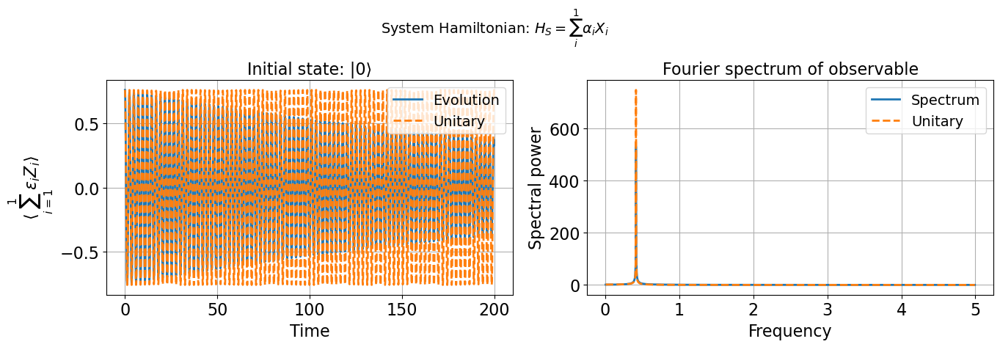

The dominant frequency from the Fourier transform is: 0.4148 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4148 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
For 1 qubit, only the first Hamiltonian is applicable.
Initial state trace: 1.0
10.0%. Run time:   0.04s. Est. time left: 00:00:00:00
20.0%. Run time:   0.09s. Est. time left: 00:00:00:00
30.0%. Run time:   0.15s. Est. time left: 00:00:00:00
40.0%. Run time:   0.18s. Est. time left: 00:00:00:00
50.0%. Run time:   0.22s. Est. time left: 00:00:00:00
60.0%. Run time:   0.26s. Est. time left: 00:00:00:00
70.0%. Run time:   0.30s. Est. time left: 00:00:00:00
80.0%. Run time:   0.33s. Est. time left: 00:00:00:00
90.0%. Run time:   0.37s. Est. time left: 00:00:00:00
100.0%. Run time:   0.40s. Est. time left: 00:00:00:00
Total run time:   0.41s


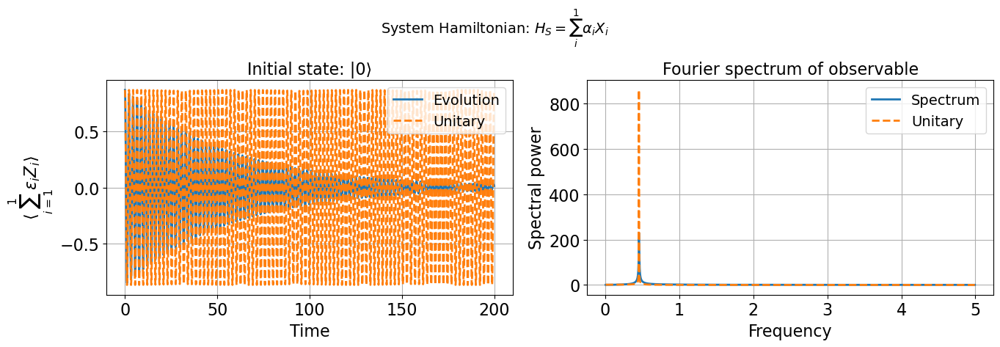

The dominant frequency from the Fourier transform is: 0.4548 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4548 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
For 1 qubit, only the first Hamiltonian is applicable.
Initial state trace: 1.0
10.0%. Run time:   0.04s. Est. time left: 00:00:00:00
20.0%. Run time:   0.07s. Est. time left: 00:00:00:00
30.0%. Run time:   0.12s. Est. time left: 00:00:00:00
40.0%. Run time:   0.15s. Est. time left: 00:00:00:00
50.0%. Run time:   0.19s. Est. time left: 00:00:00:00
60.0%. Run time:   0.22s. Est. time left: 00:00:00:00
70.0%. Run time:   0.26s. Est. time left: 00:00:00:00
80.0%. Run time:   0.29s. Est. time left: 00:00:00:00
90.0%. Run time:   0.33s. Est. time left: 00:00:00:00
100.0%. Run time:   0.37s. Est. time left: 00:00:00:00
Total run time:   0.37s


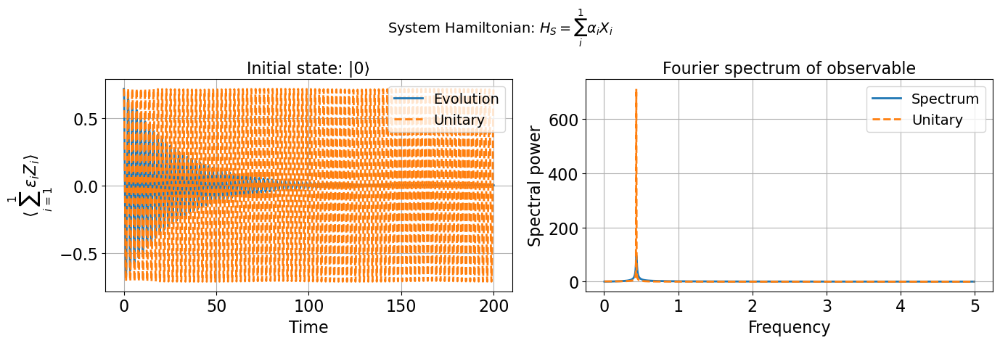

The dominant frequency from the Fourier transform is: 0.4348 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4348 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
For 1 qubit, only the first Hamiltonian is applicable.
Initial state trace: 1.0
10.0%. Run time:   0.04s. Est. time left: 00:00:00:00
20.0%. Run time:   0.08s. Est. time left: 00:00:00:00
30.0%. Run time:   0.13s. Est. time left: 00:00:00:00
40.0%. Run time:   0.18s. Est. time left: 00:00:00:00
50.0%. Run time:   0.21s. Est. time left: 00:00:00:00
60.0%. Run time:   0.25s. Est. time left: 00:00:00:00
70.0%. Run time:   0.29s. Est. time left: 00:00:00:00
80.0%. Run time:   0.38s. Est. time left: 00:00:00:00
90.0%. Run time:   0.42s. Est. time left: 00:00:00:00
100.0%. Run time:   0.46s. Est. time left: 00:00:00:00
Total run time:   0.46s


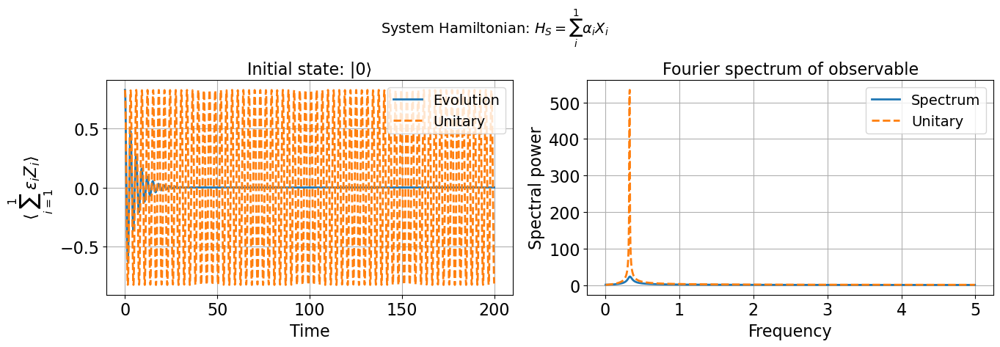

The dominant frequency from the Fourier transform is: 0.3348 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3298 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 1.52%
For 1 qubit, only the first Hamiltonian is applicable.
Initial state trace: 1.0
10.0%. Run time:   0.05s. Est. time left: 00:00:00:00
20.0%. Run time:   0.09s. Est. time left: 00:00:00:00
30.0%. Run time:   0.13s. Est. time left: 00:00:00:00
40.0%. Run time:   0.17s. Est. time left: 00:00:00:00
50.0%. Run time:   0.22s. Est. time left: 00:00:00:00
60.0%. Run time:   0.26s. Est. time left: 00:00:00:00
70.0%. Run time:   0.30s. Est. time left: 00:00:00:00
80.0%. Run time:   0.35s. Est. time left: 00:00:00:00
90.0%. Run time:   0.39s. Est. time left: 00:00:00:00
100.0%. Run time:   0.43s. Est. time left: 00:00:00:00
Total run time:   0.43s


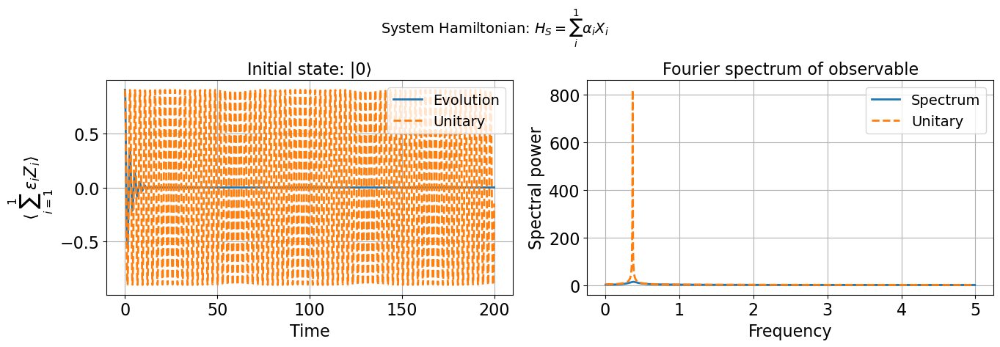

The dominant frequency from the Fourier transform is: 0.3798 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3698 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 2.70%
For 1 qubit, only the first Hamiltonian is applicable.
Initial state trace: 1.0
10.0%. Run time:   0.04s. Est. time left: 00:00:00:00
20.0%. Run time:   0.08s. Est. time left: 00:00:00:00
30.0%. Run time:   0.12s. Est. time left: 00:00:00:00
40.0%. Run time:   0.16s. Est. time left: 00:00:00:00
50.0%. Run time:   0.20s. Est. time left: 00:00:00:00
60.0%. Run time:   0.24s. Est. time left: 00:00:00:00
70.0%. Run time:   0.28s. Est. time left: 00:00:00:00
80.0%. Run time:   0.33s. Est. time left: 00:00:00:00
90.0%. Run time:   0.37s. Est. time left: 00:00:00:00
100.0%. Run time:   0.41s. Est. time left: 00:00:00:00
Total run time:   0.41s


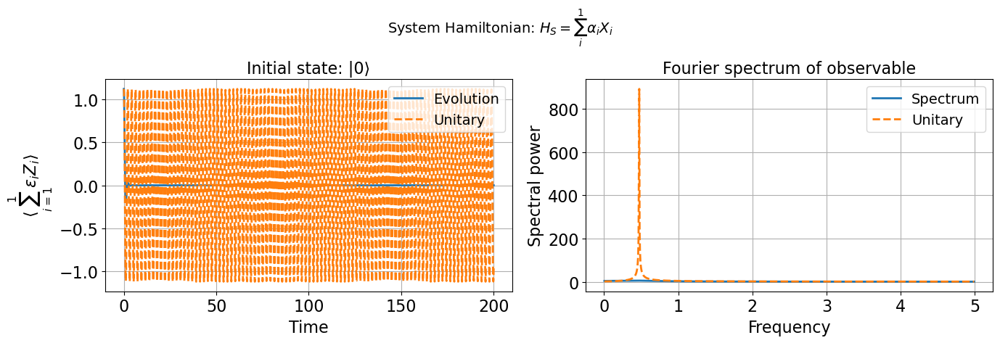

The dominant frequency from the Fourier transform is: 0.4298 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4748 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 9.47%
For 1 qubit, only the first Hamiltonian is applicable.
Initial state trace: 1.0
10.0%. Run time:   0.09s. Est. time left: 00:00:00:00
20.0%. Run time:   0.19s. Est. time left: 00:00:00:00
30.0%. Run time:   0.29s. Est. time left: 00:00:00:00
40.0%. Run time:   0.41s. Est. time left: 00:00:00:00
50.0%. Run time:   0.52s. Est. time left: 00:00:00:00
60.0%. Run time:   0.63s. Est. time left: 00:00:00:00
70.0%. Run time:   0.74s. Est. time left: 00:00:00:00
80.0%. Run time:   0.87s. Est. time left: 00:00:00:00
90.0%. Run time:   0.96s. Est. time left: 00:00:00:00
100.0%. Run time:   1.07s. Est. time left: 00:00:00:00
Total run time:   1.07s


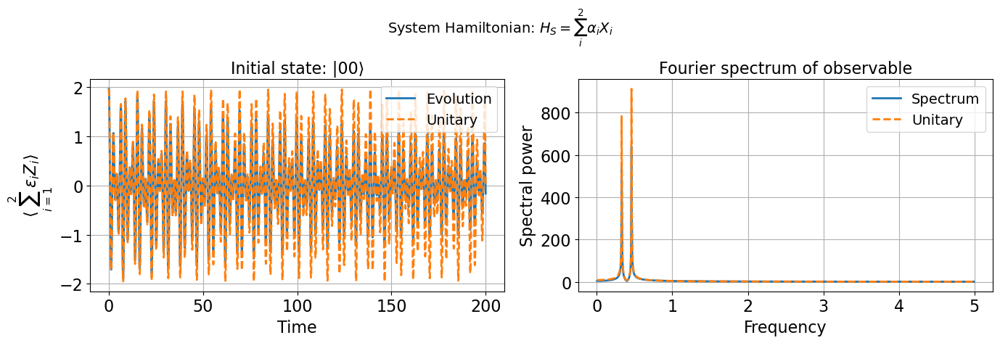

The dominant frequency from the Fourier transform is: 0.4598 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4598 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.09s. Est. time left: 00:00:00:00
20.0%. Run time:   0.19s. Est. time left: 00:00:00:00
30.0%. Run time:   0.28s. Est. time left: 00:00:00:00
40.0%. Run time:   0.36s. Est. time left: 00:00:00:00
50.0%. Run time:   0.46s. Est. time left: 00:00:00:00
60.0%. Run time:   0.54s. Est. time left: 00:00:00:00
70.0%. Run time:   0.64s. Est. time left: 00:00:00:00
80.0%. Run time:   0.73s. Est. time left: 00:00:00:00
90.0%. Run time:   0.83s. Est. time left: 00:00:00:00
100.0%. Run time:   0.93s. Est. time left: 00:00:00:00
Total run time:   0.93s


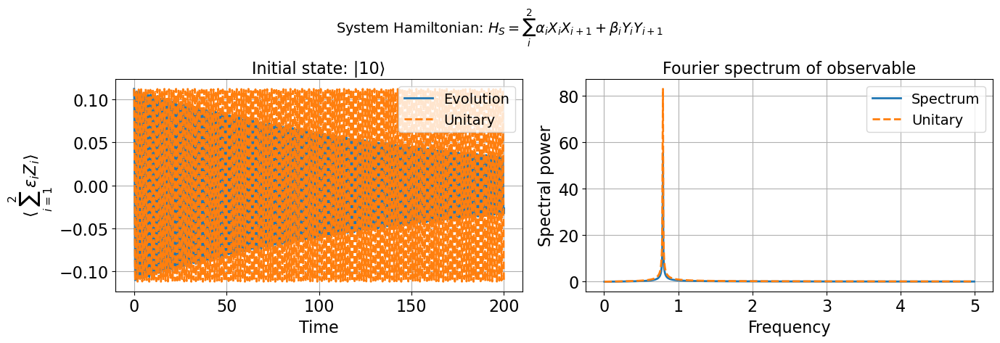

The dominant frequency from the Fourier transform is: 0.7946 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.7946 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.10s. Est. time left: 00:00:00:00
20.0%. Run time:   0.22s. Est. time left: 00:00:00:00
30.0%. Run time:   0.37s. Est. time left: 00:00:00:00
40.0%. Run time:   0.48s. Est. time left: 00:00:00:00
50.0%. Run time:   0.58s. Est. time left: 00:00:00:00
60.0%. Run time:   0.76s. Est. time left: 00:00:00:00
70.0%. Run time:   0.88s. Est. time left: 00:00:00:00
80.0%. Run time:   1.01s. Est. time left: 00:00:00:00
90.0%. Run time:   1.15s. Est. time left: 00:00:00:00
100.0%. Run time:   1.27s. Est. time left: 00:00:00:00
Total run time:   1.27s


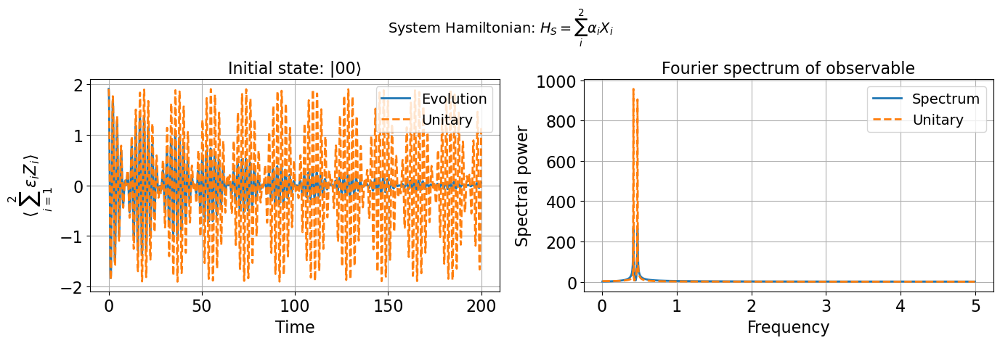

The dominant frequency from the Fourier transform is: 0.4198 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4198 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.12s. Est. time left: 00:00:00:01
20.0%. Run time:   0.24s. Est. time left: 00:00:00:00
30.0%. Run time:   0.37s. Est. time left: 00:00:00:00
40.0%. Run time:   0.43s. Est. time left: 00:00:00:00
50.0%. Run time:   0.50s. Est. time left: 00:00:00:00
60.0%. Run time:   0.58s. Est. time left: 00:00:00:00
70.0%. Run time:   0.65s. Est. time left: 00:00:00:00
80.0%. Run time:   0.71s. Est. time left: 00:00:00:00
90.0%. Run time:   0.79s. Est. time left: 00:00:00:00
100.0%. Run time:   0.85s. Est. time left: 00:00:00:00
Total run time:   0.85s


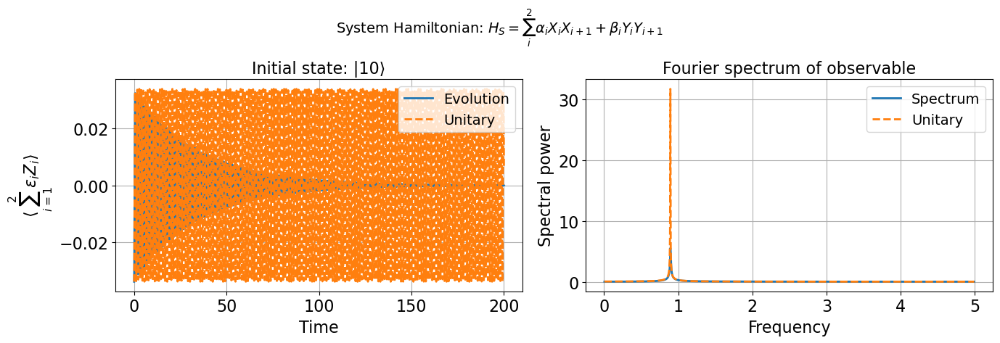

The dominant frequency from the Fourier transform is: 0.8946 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.8946 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.11s. Est. time left: 00:00:00:00
20.0%. Run time:   0.22s. Est. time left: 00:00:00:00
30.0%. Run time:   0.33s. Est. time left: 00:00:00:00
40.0%. Run time:   0.43s. Est. time left: 00:00:00:00
50.0%. Run time:   0.52s. Est. time left: 00:00:00:00
60.0%. Run time:   0.60s. Est. time left: 00:00:00:00
70.0%. Run time:   0.69s. Est. time left: 00:00:00:00
80.0%. Run time:   0.76s. Est. time left: 00:00:00:00
90.0%. Run time:   0.85s. Est. time left: 00:00:00:00
100.0%. Run time:   0.94s. Est. time left: 00:00:00:00
Total run time:   0.94s


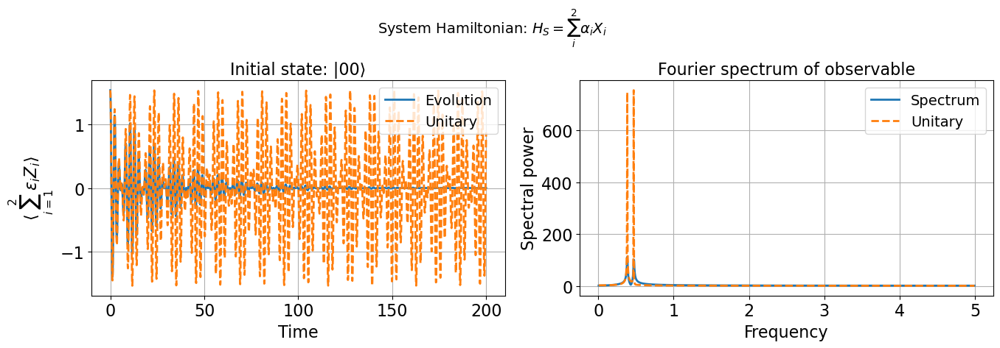

The dominant frequency from the Fourier transform is: 0.3848 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4698 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 18.09%
Initial state trace: 1.0
10.0%. Run time:   0.13s. Est. time left: 00:00:00:01
20.0%. Run time:   0.23s. Est. time left: 00:00:00:00
30.0%. Run time:   0.35s. Est. time left: 00:00:00:00
40.0%. Run time:   0.46s. Est. time left: 00:00:00:00
50.0%. Run time:   0.54s. Est. time left: 00:00:00:00
60.0%. Run time:   0.66s. Est. time left: 00:00:00:00
70.0%. Run time:   0.74s. Est. time left: 00:00:00:00
80.0%. Run time:   0.82s. Est. time left: 00:00:00:00
90.0%. Run time:   0.92s. Est. time left: 00:00:00:00
100.0%. Run time:   1.01s. Est. time left: 00:00:00:00
Total run time:   1.01s


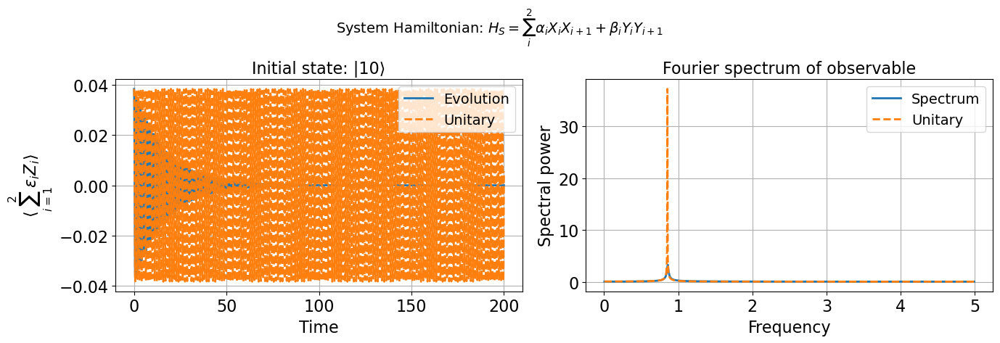

The dominant frequency from the Fourier transform is: 0.8596 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.8546 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.58%
Initial state trace: 1.0
10.0%. Run time:   0.11s. Est. time left: 00:00:00:01
20.0%. Run time:   0.19s. Est. time left: 00:00:00:00
30.0%. Run time:   0.27s. Est. time left: 00:00:00:00
40.0%. Run time:   0.33s. Est. time left: 00:00:00:00
50.0%. Run time:   0.40s. Est. time left: 00:00:00:00
60.0%. Run time:   0.52s. Est. time left: 00:00:00:00
70.0%. Run time:   0.60s. Est. time left: 00:00:00:00
80.0%. Run time:   0.68s. Est. time left: 00:00:00:00
90.0%. Run time:   0.75s. Est. time left: 00:00:00:00
100.0%. Run time:   0.81s. Est. time left: 00:00:00:00
Total run time:   0.81s


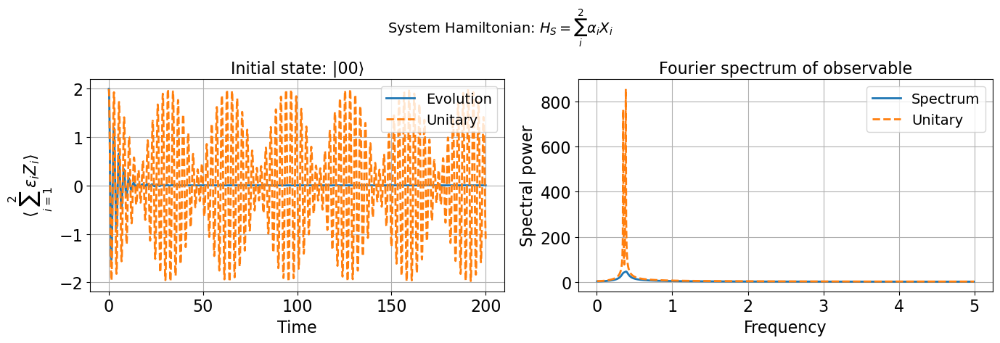

The dominant frequency from the Fourier transform is: 0.3898 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3848 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 1.30%
Initial state trace: 1.0
10.0%. Run time:   0.09s. Est. time left: 00:00:00:00
20.0%. Run time:   0.15s. Est. time left: 00:00:00:00
30.0%. Run time:   0.24s. Est. time left: 00:00:00:00
40.0%. Run time:   0.30s. Est. time left: 00:00:00:00
50.0%. Run time:   0.37s. Est. time left: 00:00:00:00
60.0%. Run time:   0.43s. Est. time left: 00:00:00:00
70.0%. Run time:   0.51s. Est. time left: 00:00:00:00
80.0%. Run time:   0.57s. Est. time left: 00:00:00:00
90.0%. Run time:   0.64s. Est. time left: 00:00:00:00
100.0%. Run time:   0.70s. Est. time left: 00:00:00:00
Total run time:   0.71s


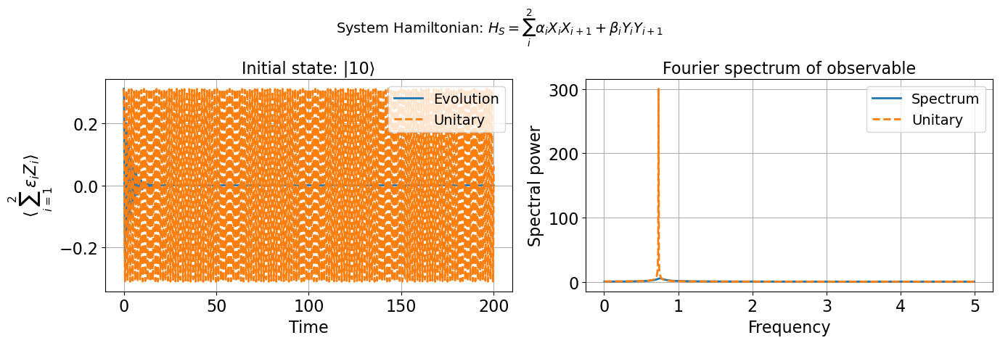

The dominant frequency from the Fourier transform is: 0.7546 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.7346 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 2.72%
Initial state trace: 1.0
10.0%. Run time:   0.17s. Est. time left: 00:00:00:01
20.0%. Run time:   0.32s. Est. time left: 00:00:00:01
30.0%. Run time:   0.45s. Est. time left: 00:00:00:01
40.0%. Run time:   0.60s. Est. time left: 00:00:00:00
50.0%. Run time:   0.77s. Est. time left: 00:00:00:00
60.0%. Run time:   0.90s. Est. time left: 00:00:00:00
70.0%. Run time:   1.04s. Est. time left: 00:00:00:00
80.0%. Run time:   1.20s. Est. time left: 00:00:00:00
90.0%. Run time:   1.34s. Est. time left: 00:00:00:00
100.0%. Run time:   1.55s. Est. time left: 00:00:00:00
Total run time:   1.56s


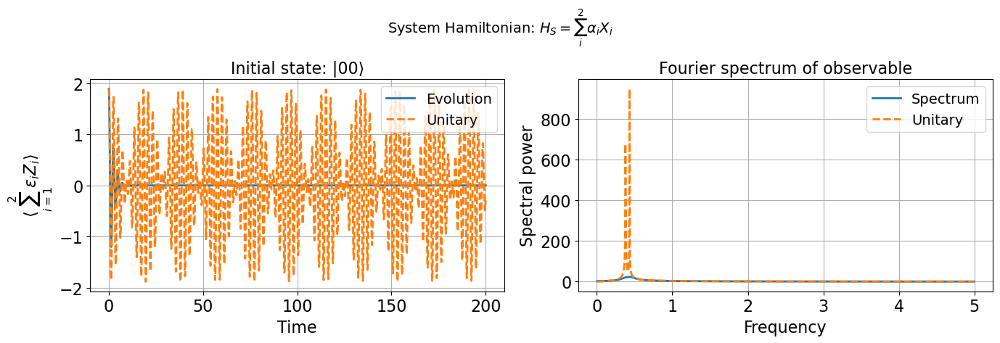

The dominant frequency from the Fourier transform is: 0.4348 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4348 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.08s. Est. time left: 00:00:00:00
20.0%. Run time:   0.19s. Est. time left: 00:00:00:00
30.0%. Run time:   0.29s. Est. time left: 00:00:00:00
40.0%. Run time:   0.44s. Est. time left: 00:00:00:00
50.0%. Run time:   0.55s. Est. time left: 00:00:00:00
60.0%. Run time:   0.66s. Est. time left: 00:00:00:00
70.0%. Run time:   0.76s. Est. time left: 00:00:00:00
80.0%. Run time:   0.89s. Est. time left: 00:00:00:00
90.0%. Run time:   1.00s. Est. time left: 00:00:00:00
100.0%. Run time:   1.09s. Est. time left: 00:00:00:00
Total run time:   1.09s


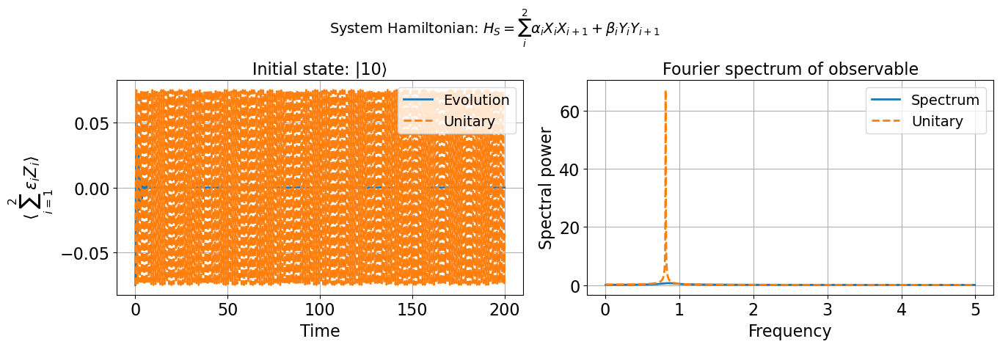

The dominant frequency from the Fourier transform is: 0.8596 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.8146 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 5.52%
Initial state trace: 1.0
10.0%. Run time:   0.10s. Est. time left: 00:00:00:00
20.0%. Run time:   0.17s. Est. time left: 00:00:00:00
30.0%. Run time:   0.30s. Est. time left: 00:00:00:00
40.0%. Run time:   0.38s. Est. time left: 00:00:00:00
50.0%. Run time:   0.46s. Est. time left: 00:00:00:00
60.0%. Run time:   0.53s. Est. time left: 00:00:00:00
70.0%. Run time:   0.60s. Est. time left: 00:00:00:00
80.0%. Run time:   0.67s. Est. time left: 00:00:00:00
90.0%. Run time:   0.73s. Est. time left: 00:00:00:00
100.0%. Run time:   0.79s. Est. time left: 00:00:00:00
Total run time:   0.80s


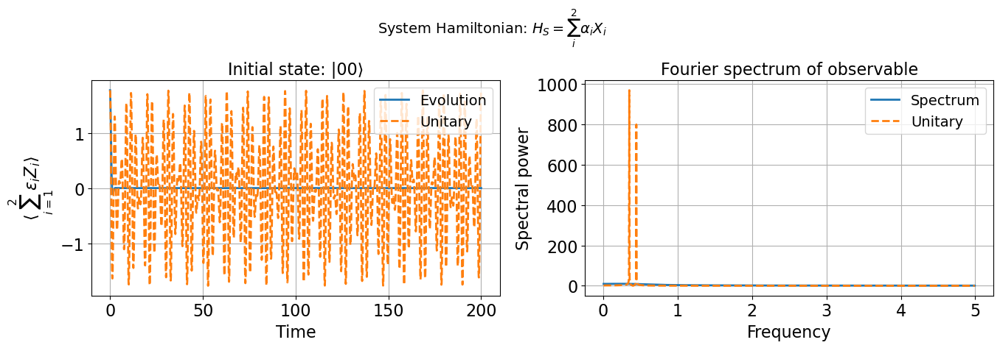

The dominant frequency from the Fourier transform is: 0.2399 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3498 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 31.43%
Initial state trace: 1.0
10.0%. Run time:   0.09s. Est. time left: 00:00:00:00
20.0%. Run time:   0.19s. Est. time left: 00:00:00:00
30.0%. Run time:   0.28s. Est. time left: 00:00:00:00
40.0%. Run time:   0.37s. Est. time left: 00:00:00:00
50.0%. Run time:   0.47s. Est. time left: 00:00:00:00
60.0%. Run time:   0.57s. Est. time left: 00:00:00:00
70.0%. Run time:   0.67s. Est. time left: 00:00:00:00
80.0%. Run time:   0.76s. Est. time left: 00:00:00:00
90.0%. Run time:   0.85s. Est. time left: 00:00:00:00
100.0%. Run time:   0.93s. Est. time left: 00:00:00:00
Total run time:   0.93s


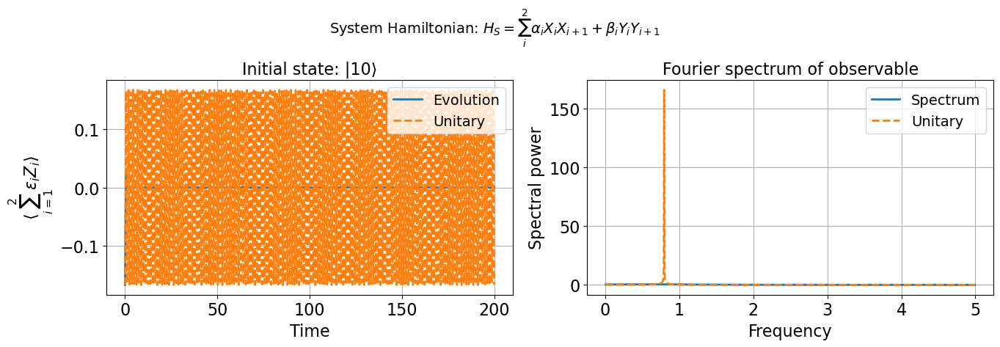

The dominant frequency from the Fourier transform is: 0.7196 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.7946 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 9.43%
Initial state trace: 1.0
10.0%. Run time:   0.83s. Est. time left: 00:00:00:07
20.0%. Run time:   1.48s. Est. time left: 00:00:00:05
30.0%. Run time:   2.16s. Est. time left: 00:00:00:05
40.0%. Run time:   2.75s. Est. time left: 00:00:00:04
50.0%. Run time:   3.40s. Est. time left: 00:00:00:03
60.0%. Run time:   4.05s. Est. time left: 00:00:00:02
70.0%. Run time:   4.70s. Est. time left: 00:00:00:02
80.0%. Run time:   5.30s. Est. time left: 00:00:00:01
90.0%. Run time:   5.82s. Est. time left: 00:00:00:00
100.0%. Run time:   6.40s. Est. time left: 00:00:00:00
Total run time:   6.40s


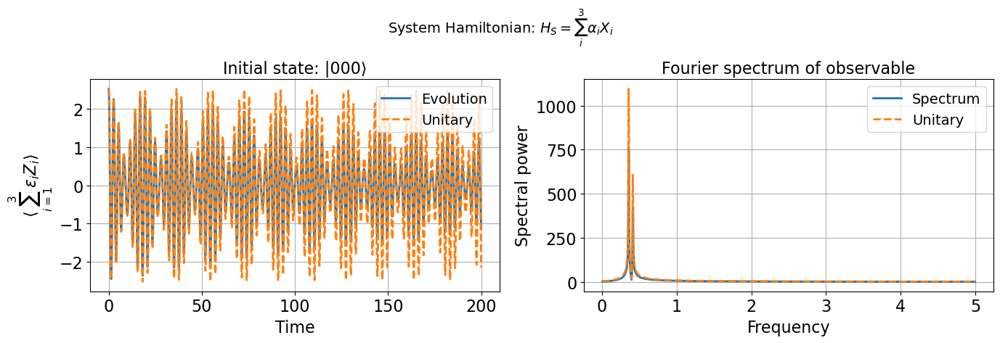

The dominant frequency from the Fourier transform is: 0.3548 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3548 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.68s. Est. time left: 00:00:00:06
20.0%. Run time:   1.29s. Est. time left: 00:00:00:05
30.0%. Run time:   1.84s. Est. time left: 00:00:00:04
40.0%. Run time:   2.49s. Est. time left: 00:00:00:03
50.0%. Run time:   3.05s. Est. time left: 00:00:00:03
60.0%. Run time:   3.65s. Est. time left: 00:00:00:02
70.0%. Run time:   4.21s. Est. time left: 00:00:00:01
80.0%. Run time:   4.85s. Est. time left: 00:00:00:01
90.0%. Run time:   5.41s. Est. time left: 00:00:00:00
100.0%. Run time:   6.06s. Est. time left: 00:00:00:00
Total run time:   6.06s


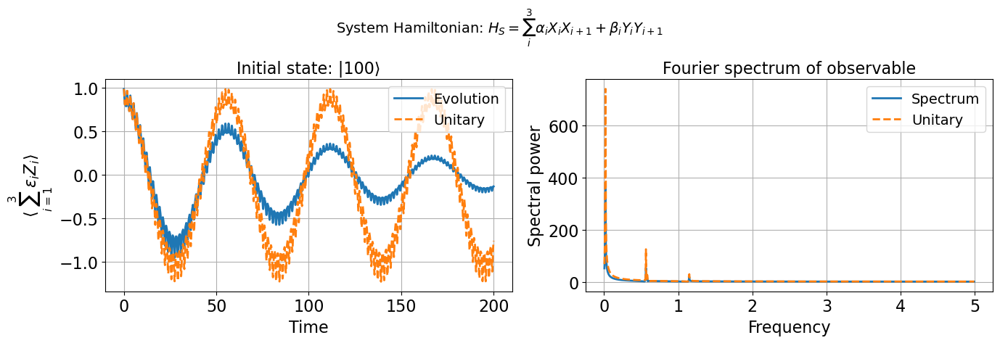

The dominant frequency from the Fourier transform is: 0.0200 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0200 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.62s. Est. time left: 00:00:00:05
20.0%. Run time:   1.34s. Est. time left: 00:00:00:05
30.0%. Run time:   2.04s. Est. time left: 00:00:00:04
40.0%. Run time:   2.57s. Est. time left: 00:00:00:03
50.0%. Run time:   3.03s. Est. time left: 00:00:00:03
60.0%. Run time:   3.49s. Est. time left: 00:00:00:02
70.0%. Run time:   3.91s. Est. time left: 00:00:00:01
80.0%. Run time:   4.32s. Est. time left: 00:00:00:01
90.0%. Run time:   4.75s. Est. time left: 00:00:00:00
100.0%. Run time:   5.19s. Est. time left: 00:00:00:00
Total run time:   5.19s


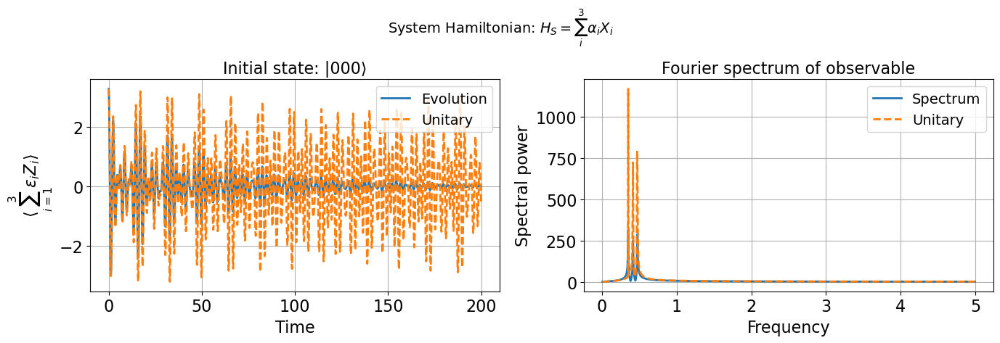

The dominant frequency from the Fourier transform is: 0.3498 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3498 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.66s. Est. time left: 00:00:00:05
20.0%. Run time:   1.24s. Est. time left: 00:00:00:04
30.0%. Run time:   1.85s. Est. time left: 00:00:00:04
40.0%. Run time:   2.46s. Est. time left: 00:00:00:03
50.0%. Run time:   3.27s. Est. time left: 00:00:00:03
60.0%. Run time:   3.65s. Est. time left: 00:00:00:02
70.0%. Run time:   4.04s. Est. time left: 00:00:00:01
80.0%. Run time:   4.46s. Est. time left: 00:00:00:01
90.0%. Run time:   4.88s. Est. time left: 00:00:00:00
100.0%. Run time:   5.25s. Est. time left: 00:00:00:00
Total run time:   5.25s


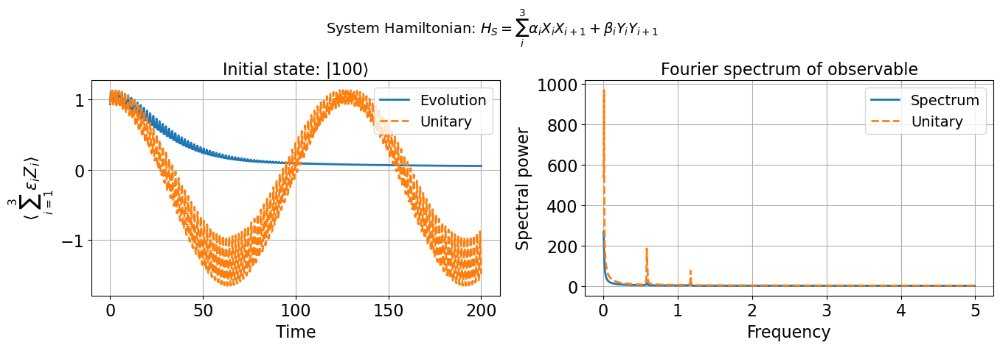

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0100 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 50.00%
Initial state trace: 1.0
10.0%. Run time:   0.73s. Est. time left: 00:00:00:06
20.0%. Run time:   1.54s. Est. time left: 00:00:00:06
30.0%. Run time:   2.37s. Est. time left: 00:00:00:05
40.0%. Run time:   3.39s. Est. time left: 00:00:00:05
50.0%. Run time:   4.19s. Est. time left: 00:00:00:04
60.0%. Run time:   5.28s. Est. time left: 00:00:00:03
70.0%. Run time:   6.30s. Est. time left: 00:00:00:02
80.0%. Run time:   7.00s. Est. time left: 00:00:00:01
90.0%. Run time:   7.72s. Est. time left: 00:00:00:00
100.0%. Run time:   8.65s. Est. time left: 00:00:00:00
Total run time:   8.65s


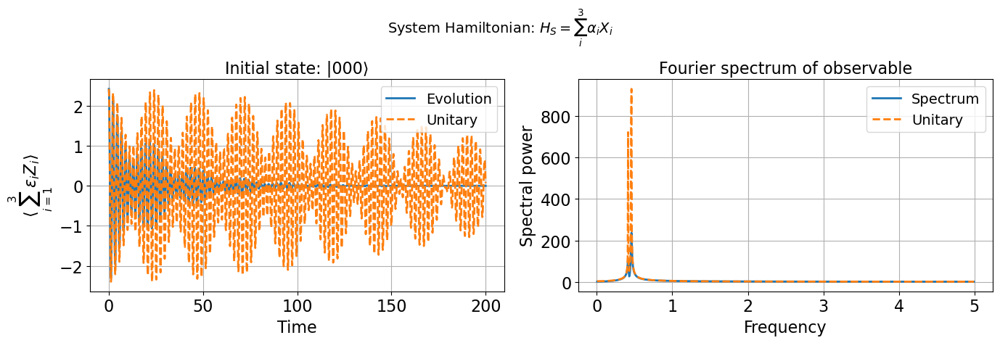

The dominant frequency from the Fourier transform is: 0.4598 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4598 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   0.67s. Est. time left: 00:00:00:06
20.0%. Run time:   1.32s. Est. time left: 00:00:00:05
30.0%. Run time:   1.97s. Est. time left: 00:00:00:04
40.0%. Run time:   2.69s. Est. time left: 00:00:00:04
50.0%. Run time:   3.38s. Est. time left: 00:00:00:03
60.0%. Run time:   4.06s. Est. time left: 00:00:00:02
70.0%. Run time:   4.80s. Est. time left: 00:00:00:02
80.0%. Run time:   5.45s. Est. time left: 00:00:00:01
90.0%. Run time:   6.05s. Est. time left: 00:00:00:00
100.0%. Run time:   6.67s. Est. time left: 00:00:00:00
Total run time:   6.68s


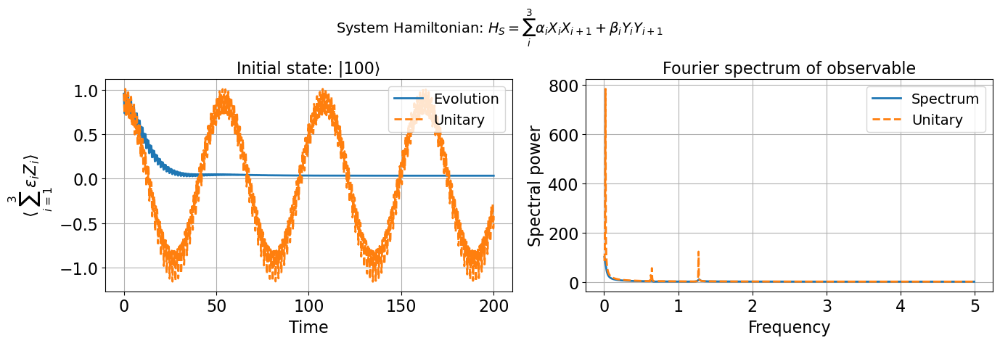

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0200 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 75.00%
Initial state trace: 1.0
10.0%. Run time:   1.00s. Est. time left: 00:00:00:09
20.0%. Run time:   2.06s. Est. time left: 00:00:00:08
30.0%. Run time:   3.26s. Est. time left: 00:00:00:07
40.0%. Run time:   4.21s. Est. time left: 00:00:00:06
50.0%. Run time:   5.26s. Est. time left: 00:00:00:05
60.0%. Run time:   6.35s. Est. time left: 00:00:00:04
70.0%. Run time:   7.34s. Est. time left: 00:00:00:03
80.0%. Run time:   8.43s. Est. time left: 00:00:00:02
90.0%. Run time:   9.53s. Est. time left: 00:00:00:01
100.0%. Run time:  10.60s. Est. time left: 00:00:00:00
Total run time:  10.60s


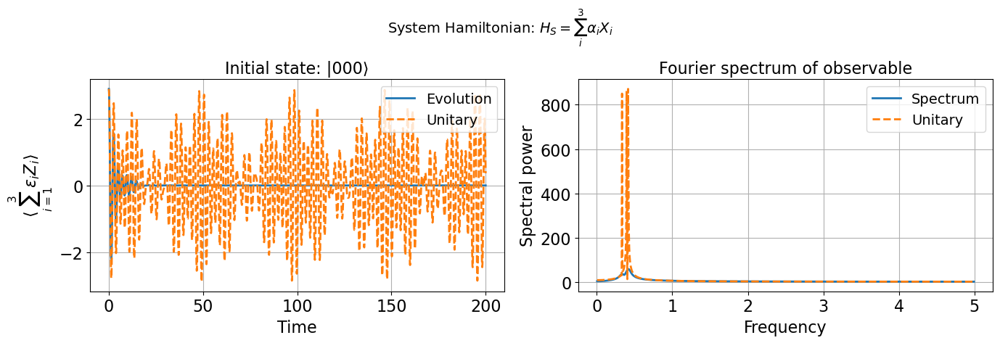

The dominant frequency from the Fourier transform is: 0.4198 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4148 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 1.20%
Initial state trace: 1.0
10.0%. Run time:   0.76s. Est. time left: 00:00:00:06
20.0%. Run time:   1.10s. Est. time left: 00:00:00:04
30.0%. Run time:   1.46s. Est. time left: 00:00:00:03
40.0%. Run time:   1.79s. Est. time left: 00:00:00:02
50.0%. Run time:   2.11s. Est. time left: 00:00:00:02
60.0%. Run time:   2.46s. Est. time left: 00:00:00:01
70.0%. Run time:   2.85s. Est. time left: 00:00:00:01
80.0%. Run time:   3.18s. Est. time left: 00:00:00:00
90.0%. Run time:   3.58s. Est. time left: 00:00:00:00
100.0%. Run time:   3.89s. Est. time left: 00:00:00:00
Total run time:   3.89s


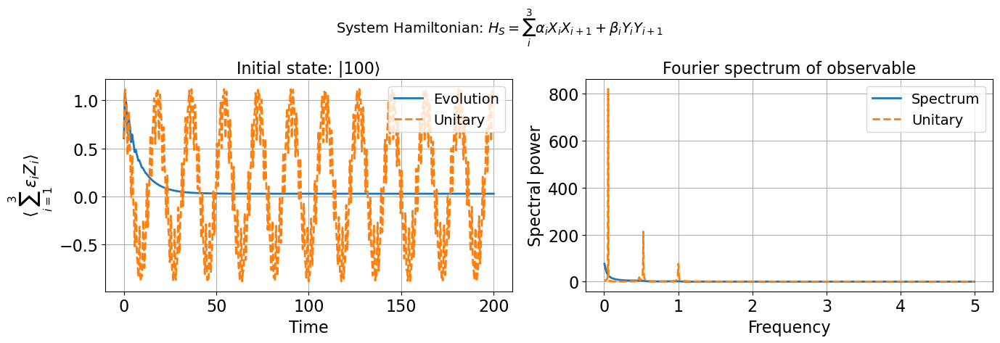

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0550 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 90.91%
Initial state trace: 1.0
10.0%. Run time:   0.45s. Est. time left: 00:00:00:04
20.0%. Run time:   0.74s. Est. time left: 00:00:00:02
30.0%. Run time:   1.02s. Est. time left: 00:00:00:02
40.0%. Run time:   1.29s. Est. time left: 00:00:00:01
50.0%. Run time:   1.56s. Est. time left: 00:00:00:01
60.0%. Run time:   1.89s. Est. time left: 00:00:00:01
70.0%. Run time:   2.20s. Est. time left: 00:00:00:00
80.0%. Run time:   2.50s. Est. time left: 00:00:00:00
90.0%. Run time:   2.81s. Est. time left: 00:00:00:00
100.0%. Run time:   3.10s. Est. time left: 00:00:00:00
Total run time:   3.10s


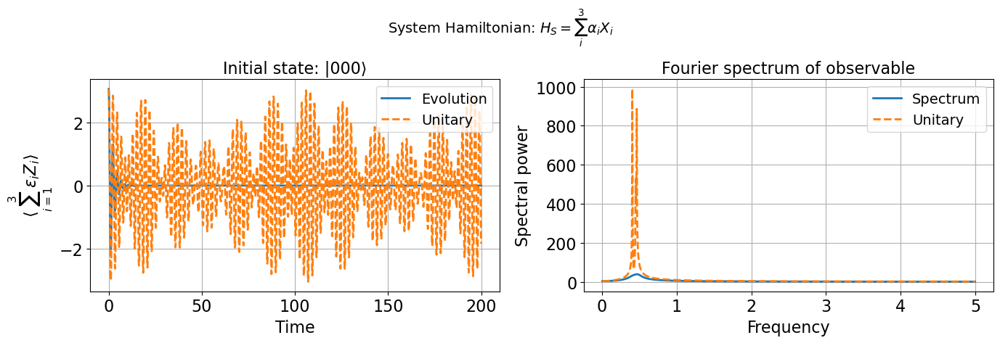

The dominant frequency from the Fourier transform is: 0.4698 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4048 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 16.05%
Initial state trace: 1.0
10.0%. Run time:   0.38s. Est. time left: 00:00:00:03
20.0%. Run time:   0.65s. Est. time left: 00:00:00:02
30.0%. Run time:   0.94s. Est. time left: 00:00:00:02
40.0%. Run time:   1.24s. Est. time left: 00:00:00:01
50.0%. Run time:   1.54s. Est. time left: 00:00:00:01
60.0%. Run time:   1.90s. Est. time left: 00:00:00:01
70.0%. Run time:   2.34s. Est. time left: 00:00:00:00
80.0%. Run time:   2.65s. Est. time left: 00:00:00:00
90.0%. Run time:   2.98s. Est. time left: 00:00:00:00
100.0%. Run time:   3.25s. Est. time left: 00:00:00:00
Total run time:   3.25s


c:\Users\jalej\anaconda3\Lib\site-packages\matplotlib\cbook.py:1762: ComplexWarning: Casting complex values to real discards the imaginary part
  return math.isfinite(val)
c:\Users\jalej\anaconda3\Lib\site-packages\matplotlib\cbook.py:1398: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


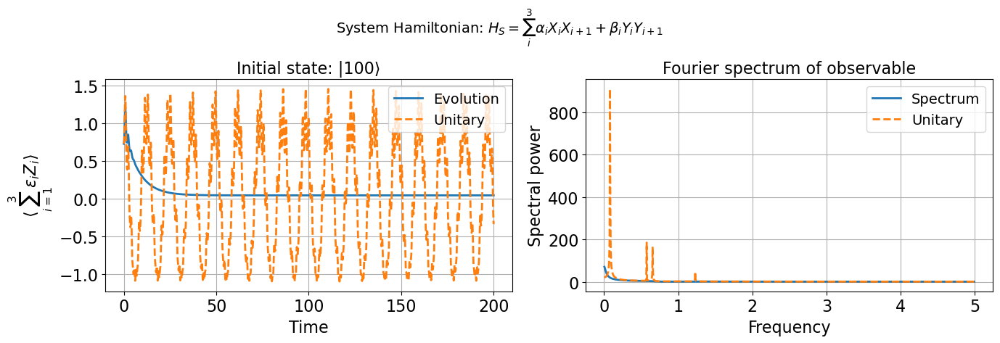

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0800 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 93.75%
Initial state trace: 1.0
10.0%. Run time:   1.20s. Est. time left: 00:00:00:10
20.0%. Run time:   1.58s. Est. time left: 00:00:00:06
30.0%. Run time:   1.88s. Est. time left: 00:00:00:04
40.0%. Run time:   2.17s. Est. time left: 00:00:00:03
50.0%. Run time:   2.48s. Est. time left: 00:00:00:02
60.0%. Run time:   2.76s. Est. time left: 00:00:00:01
70.0%. Run time:   3.07s. Est. time left: 00:00:00:01
80.0%. Run time:   3.38s. Est. time left: 00:00:00:00
90.0%. Run time:   3.64s. Est. time left: 00:00:00:00
100.0%. Run time:   3.95s. Est. time left: 00:00:00:00
Total run time:   3.95s


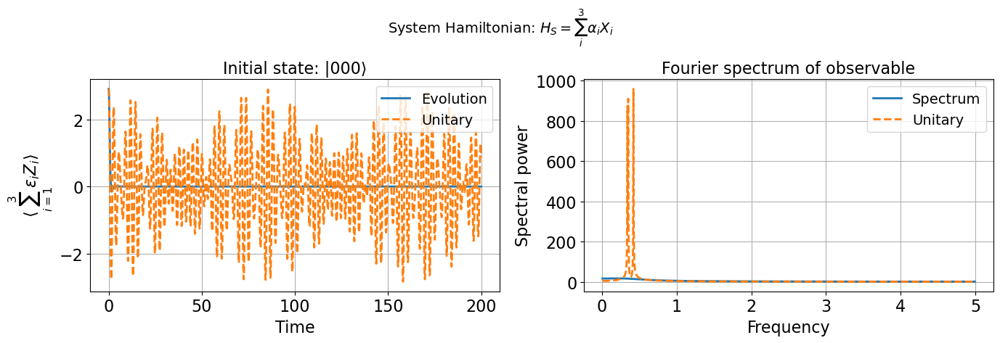

The dominant frequency from the Fourier transform is: 0.2099 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4198 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 50.00%
Initial state trace: 1.0
10.0%. Run time:   0.46s. Est. time left: 00:00:00:04
20.0%. Run time:   0.74s. Est. time left: 00:00:00:02
30.0%. Run time:   1.02s. Est. time left: 00:00:00:02
40.0%. Run time:   1.36s. Est. time left: 00:00:00:02
50.0%. Run time:   1.74s. Est. time left: 00:00:00:01
60.0%. Run time:   2.09s. Est. time left: 00:00:00:01
70.0%. Run time:   2.39s. Est. time left: 00:00:00:01
80.0%. Run time:   2.71s. Est. time left: 00:00:00:00
90.0%. Run time:   2.99s. Est. time left: 00:00:00:00
100.0%. Run time:   3.29s. Est. time left: 00:00:00:00
Total run time:   3.29s


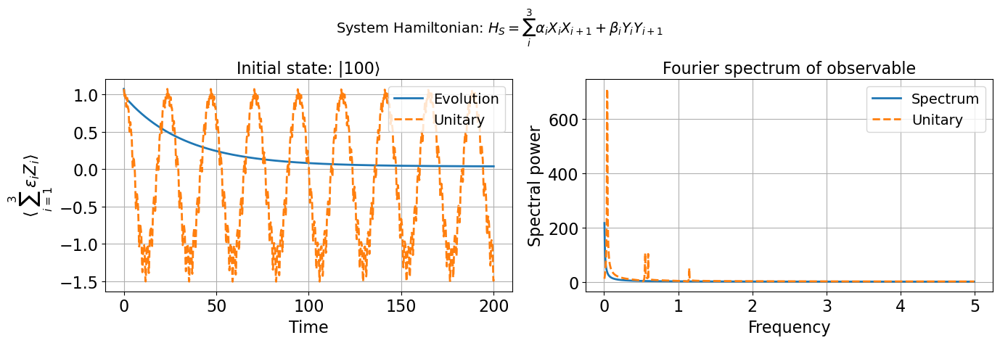

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0400 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 87.50%
Initial state trace: 1.0
10.0%. Run time:   5.24s. Est. time left: 00:00:00:47
20.0%. Run time:  10.21s. Est. time left: 00:00:00:40
30.0%. Run time:  15.32s. Est. time left: 00:00:00:35
40.0%. Run time:  20.30s. Est. time left: 00:00:00:30
50.0%. Run time:  25.39s. Est. time left: 00:00:00:25
60.0%. Run time:  30.55s. Est. time left: 00:00:00:20
70.0%. Run time:  35.16s. Est. time left: 00:00:00:15
80.0%. Run time:  39.97s. Est. time left: 00:00:00:09
90.0%. Run time:  45.17s. Est. time left: 00:00:00:04
100.0%. Run time:  50.37s. Est. time left: 00:00:00:00
Total run time:  50.37s


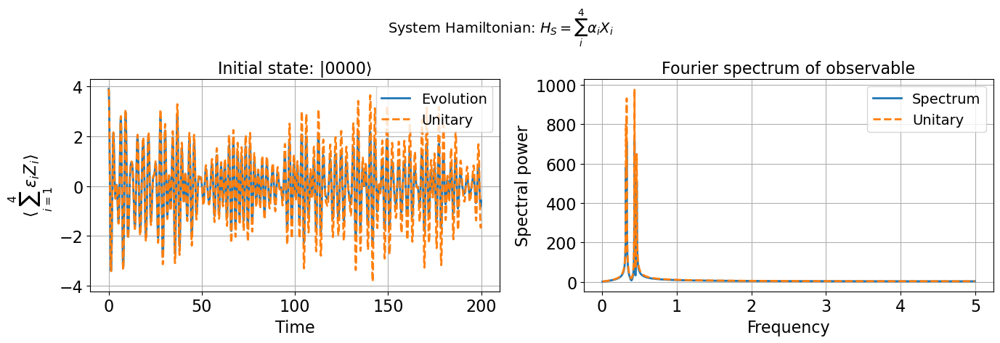

The dominant frequency from the Fourier transform is: 0.4348 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4348 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   4.40s. Est. time left: 00:00:00:39
20.0%. Run time:   8.39s. Est. time left: 00:00:00:33
30.0%. Run time:  12.22s. Est. time left: 00:00:00:28
40.0%. Run time:  16.18s. Est. time left: 00:00:00:24
50.0%. Run time:  20.04s. Est. time left: 00:00:00:20
60.0%. Run time:  24.31s. Est. time left: 00:00:00:16
70.0%. Run time:  28.15s. Est. time left: 00:00:00:12
80.0%. Run time:  32.14s. Est. time left: 00:00:00:08
90.0%. Run time:  36.04s. Est. time left: 00:00:00:03
100.0%. Run time:  40.01s. Est. time left: 00:00:00:00
Total run time:  40.01s


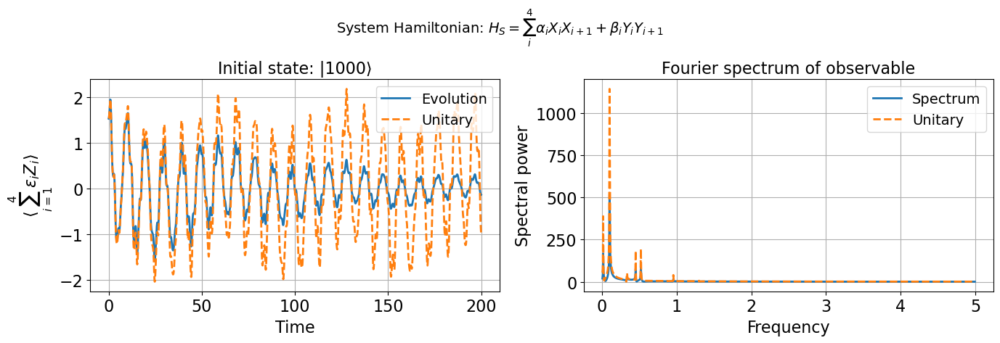

The dominant frequency from the Fourier transform is: 0.1000 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.1000 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   4.53s. Est. time left: 00:00:00:40
20.0%. Run time:   9.03s. Est. time left: 00:00:00:36
30.0%. Run time:  13.39s. Est. time left: 00:00:00:31
40.0%. Run time:  17.84s. Est. time left: 00:00:00:26
50.0%. Run time:  22.18s. Est. time left: 00:00:00:22
60.0%. Run time:  26.49s. Est. time left: 00:00:00:17
70.0%. Run time:  30.92s. Est. time left: 00:00:00:13
80.0%. Run time:  35.24s. Est. time left: 00:00:00:08
90.0%. Run time:  39.54s. Est. time left: 00:00:00:04
100.0%. Run time:  43.80s. Est. time left: 00:00:00:00
Total run time:  43.80s


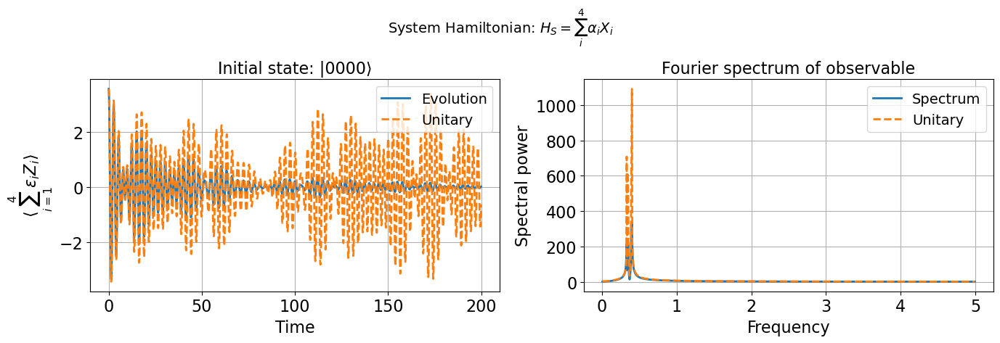

The dominant frequency from the Fourier transform is: 0.3998 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3998 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   3.69s. Est. time left: 00:00:00:33
20.0%. Run time:   7.48s. Est. time left: 00:00:00:29
30.0%. Run time:  11.17s. Est. time left: 00:00:00:26
40.0%. Run time:  14.27s. Est. time left: 00:00:00:21
50.0%. Run time:  16.81s. Est. time left: 00:00:00:16
60.0%. Run time:  19.46s. Est. time left: 00:00:00:12
70.0%. Run time:  22.04s. Est. time left: 00:00:00:09
80.0%. Run time:  24.66s. Est. time left: 00:00:00:06
90.0%. Run time:  27.26s. Est. time left: 00:00:00:03
100.0%. Run time:  29.74s. Est. time left: 00:00:00:00
Total run time:  29.74s


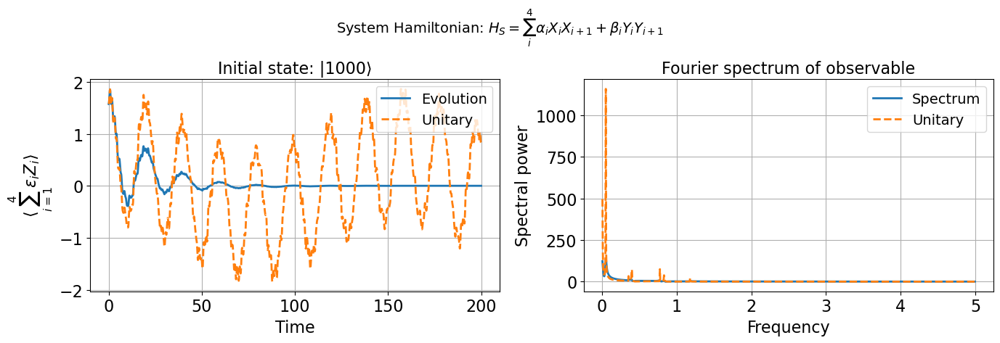

The dominant frequency from the Fourier transform is: 0.0500 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0500 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 0.00%
Initial state trace: 1.0
10.0%. Run time:   9.30s. Est. time left: 00:00:01:23
20.0%. Run time:  15.02s. Est. time left: 00:00:01:00
30.0%. Run time:  20.60s. Est. time left: 00:00:00:48
40.0%. Run time:  26.13s. Est. time left: 00:00:00:39
50.0%. Run time:  31.62s. Est. time left: 00:00:00:31
60.0%. Run time:  37.09s. Est. time left: 00:00:00:24
70.0%. Run time:  42.70s. Est. time left: 00:00:00:18
80.0%. Run time:  48.30s. Est. time left: 00:00:00:12
90.0%. Run time:  53.84s. Est. time left: 00:00:00:05
100.0%. Run time:  59.37s. Est. time left: 00:00:00:00
Total run time:  59.38s


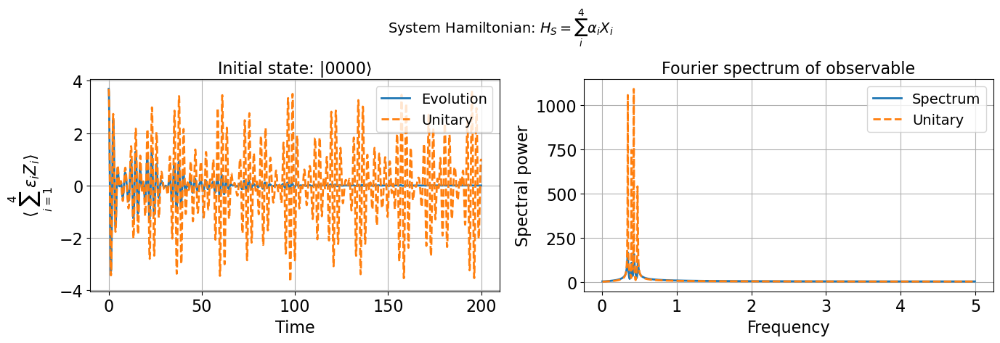

The dominant frequency from the Fourier transform is: 0.3448 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4248 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 18.82%
Initial state trace: 1.0
10.0%. Run time:   5.18s. Est. time left: 00:00:00:46
20.0%. Run time:   9.78s. Est. time left: 00:00:00:39
30.0%. Run time:  13.01s. Est. time left: 00:00:00:30
40.0%. Run time:  15.77s. Est. time left: 00:00:00:23
50.0%. Run time:  18.11s. Est. time left: 00:00:00:18
60.0%. Run time:  20.42s. Est. time left: 00:00:00:13
70.0%. Run time:  22.66s. Est. time left: 00:00:00:09
80.0%. Run time:  25.04s. Est. time left: 00:00:00:06
90.0%. Run time:  27.44s. Est. time left: 00:00:00:03
100.0%. Run time:  29.74s. Est. time left: 00:00:00:00
Total run time:  29.74s


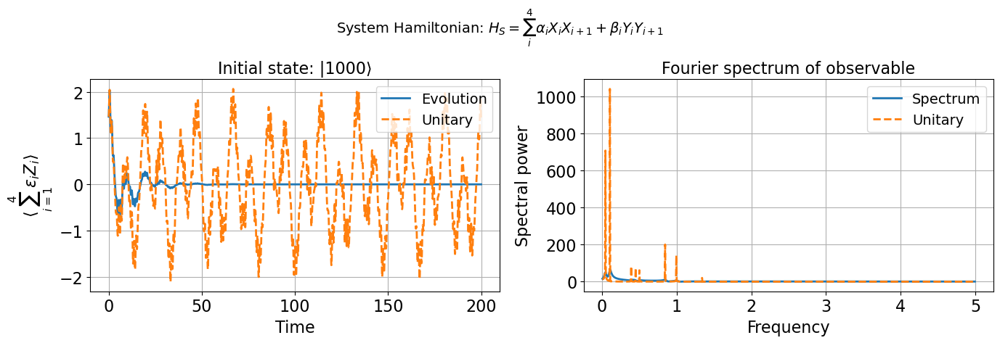

The dominant frequency from the Fourier transform is: 0.1099 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.1049 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 4.76%
Initial state trace: 1.0
10.0%. Run time:   4.54s. Est. time left: 00:00:00:40
20.0%. Run time:   7.21s. Est. time left: 00:00:00:28
30.0%. Run time:   9.90s. Est. time left: 00:00:00:23
40.0%. Run time:  12.41s. Est. time left: 00:00:00:18
50.0%. Run time:  14.99s. Est. time left: 00:00:00:14
60.0%. Run time:  17.62s. Est. time left: 00:00:00:11
70.0%. Run time:  20.26s. Est. time left: 00:00:00:08
80.0%. Run time:  22.84s. Est. time left: 00:00:00:05
90.0%. Run time:  25.61s. Est. time left: 00:00:00:02
100.0%. Run time:  28.07s. Est. time left: 00:00:00:00
Total run time:  28.07s


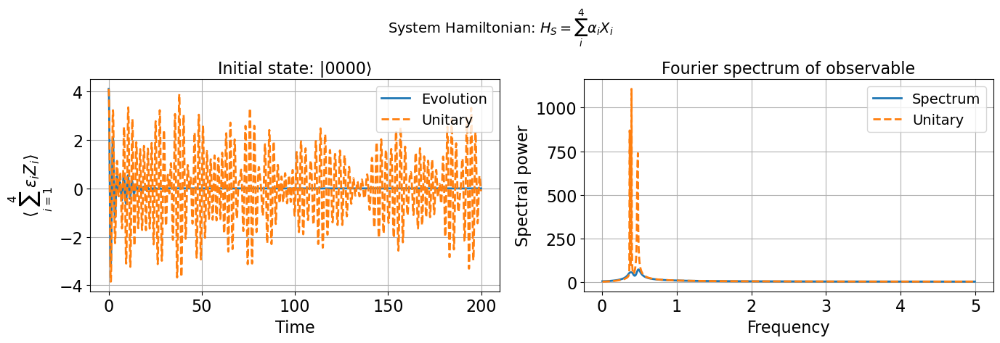

The dominant frequency from the Fourier transform is: 0.4848 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3948 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 22.78%
Initial state trace: 1.0
10.0%. Run time:   4.04s. Est. time left: 00:00:00:36
20.0%. Run time:   6.42s. Est. time left: 00:00:00:25
30.0%. Run time:   9.03s. Est. time left: 00:00:00:21
40.0%. Run time:  11.80s. Est. time left: 00:00:00:17
50.0%. Run time:  14.47s. Est. time left: 00:00:00:14
60.0%. Run time:  17.09s. Est. time left: 00:00:00:11
70.0%. Run time:  19.79s. Est. time left: 00:00:00:08
80.0%. Run time:  22.51s. Est. time left: 00:00:00:05
90.0%. Run time:  25.20s. Est. time left: 00:00:00:02
100.0%. Run time:  27.79s. Est. time left: 00:00:00:00
Total run time:  27.79s


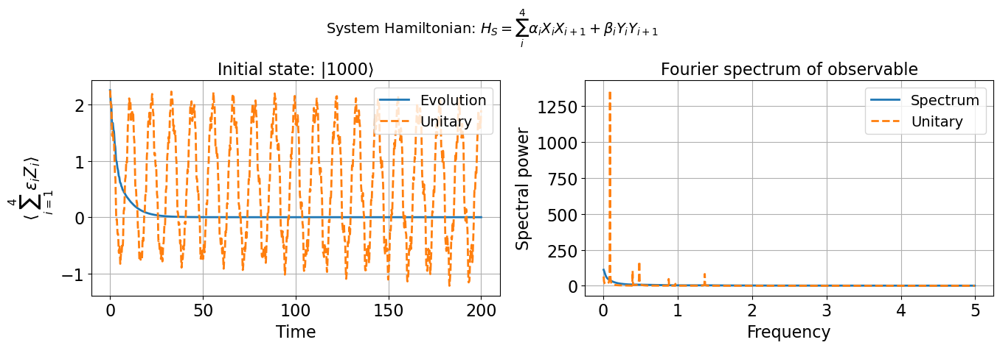

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0900 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 94.44%
Initial state trace: 1.0
10.0%. Run time:   3.58s. Est. time left: 00:00:00:32
20.0%. Run time:   5.97s. Est. time left: 00:00:00:23
30.0%. Run time:   8.02s. Est. time left: 00:00:00:18
40.0%. Run time:  10.14s. Est. time left: 00:00:00:15
50.0%. Run time:  12.29s. Est. time left: 00:00:00:12
60.0%. Run time:  14.49s. Est. time left: 00:00:00:09
70.0%. Run time:  16.58s. Est. time left: 00:00:00:07
80.0%. Run time:  18.90s. Est. time left: 00:00:00:04
90.0%. Run time:  21.23s. Est. time left: 00:00:00:02
100.0%. Run time:  24.19s. Est. time left: 00:00:00:00
Total run time:  24.19s


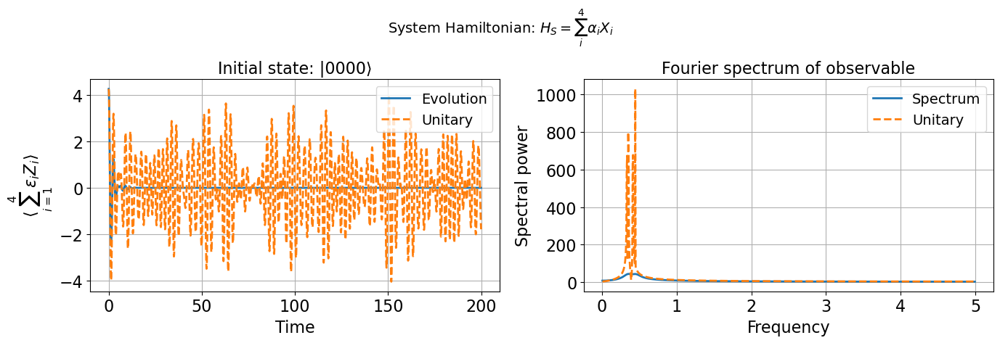

The dominant frequency from the Fourier transform is: 0.3548 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.4448 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 20.22%
Initial state trace: 1.0
10.0%. Run time:   3.29s. Est. time left: 00:00:00:29
20.0%. Run time:   5.42s. Est. time left: 00:00:00:21
30.0%. Run time:   7.48s. Est. time left: 00:00:00:17
40.0%. Run time:  10.04s. Est. time left: 00:00:00:15
50.0%. Run time:  12.86s. Est. time left: 00:00:00:12
60.0%. Run time:  15.77s. Est. time left: 00:00:00:10
70.0%. Run time:  18.12s. Est. time left: 00:00:00:07
80.0%. Run time:  20.54s. Est. time left: 00:00:00:05
90.0%. Run time:  22.85s. Est. time left: 00:00:00:02
100.0%. Run time:  25.43s. Est. time left: 00:00:00:00
Total run time:  25.43s


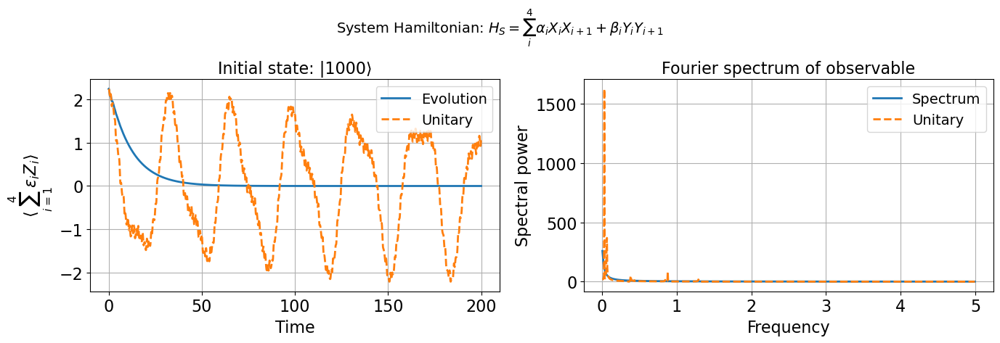

The dominant frequency from the Fourier transform is: 0.0050 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.0300 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 83.33%
Initial state trace: 1.0
10.0%. Run time:   5.22s. Est. time left: 00:00:00:46
20.0%. Run time:   9.99s. Est. time left: 00:00:00:39
30.0%. Run time:  14.82s. Est. time left: 00:00:00:34
40.0%. Run time:  19.71s. Est. time left: 00:00:00:29
50.0%. Run time:  24.33s. Est. time left: 00:00:00:24
60.0%. Run time:  29.58s. Est. time left: 00:00:00:19
70.0%. Run time:  34.58s. Est. time left: 00:00:00:14
80.0%. Run time:  39.34s. Est. time left: 00:00:00:09
90.0%. Run time:  44.31s. Est. time left: 00:00:00:04
100.0%. Run time:  49.14s. Est. time left: 00:00:00:00
Total run time:  49.14s


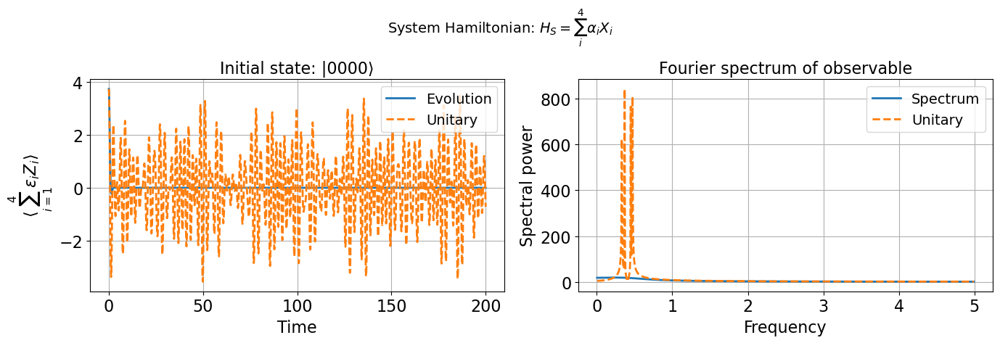

The dominant frequency from the Fourier transform is: 0.2449 (units of 1/time)
The dominant frequency from the Fourier transform (unitary) is: 0.3698 (units of 1/time)
The relative error between the noisy and unitary dominant frequencies is: 33.78%
Initial state trace: 1.0
10.0%. Run time:   4.01s. Est. time left: 00:00:00:36
20.0%. Run time:   7.16s. Est. time left: 00:00:00:28
30.0%. Run time:   9.88s. Est. time left: 00:00:00:23
40.0%. Run time:  12.63s. Est. time left: 00:00:00:18
50.0%. Run time:  15.38s. Est. time left: 00:00:00:15
60.0%. Run time:  18.28s. Est. time left: 00:00:00:12
70.0%. Run time:  20.97s. Est. time left: 00:00:00:08
80.0%. Run time:  23.79s. Est. time left: 00:00:00:05


KeyboardInterrupt: 

In [36]:

import numpy as np
import matplotlib.pyplot as plt
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
from qutip import *
import os
import re
np.random.seed(43)

# Parameters - USER CAN CHANGE THESE
for num_qubits in [1, 2, 3, 4, 5]:
    for lambda_d in [0.001,0.005, 0.01,0.05 , 0.1, 0.5]: 
        tlist = np.linspace(0, 200, 2000)
        save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz\{num_qubits}QUBITS"
        # Generate random coefficients for the Hamiltonian and observable

        epsilon = np.random.uniform(0.7, 1.2, num_qubits)  # Coefficients for observable
        alpha_list = np.random.uniform(1, 1.5, 2 * num_qubits + 1) 
        alpha = np.array(alpha_list)

        gamma = 10
        max_depth=2
        Nk=2
        T = 0.01




        def build_op(op_qubit, pos):
            """Build an operator acting on position 'pos' in the full Hilbert space"""
            ops = [qeye(2) for _ in range(num_qubits)]
            ops[pos] = op_qubit
            return tensor(ops)

        # Create Pauli operators for all qubits
        X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
        Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
        Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]


        # Observable operator acting only on the qubits' Hilbert space
        observable_op = sum(epsilon[i] * Z_ops[i] for i in range(num_qubits))

        # Create list of baths
        baths = []
        for i in range(num_qubits):
            baths.append(DrudeLorentzBath(Z_ops[i], lambda_d, gamma, T, Nk))

        # System Hamiltonian: Nearest-neighbor XX and YY interactions
        Hs_1 = 0
        for i in range(num_qubits):
            Hs_1 += alpha[i]* X_ops[i]
        Hs_2 = 0
        for i in range(num_qubits-1):
            Hs_2+= alpha[i] * X_ops[i] * X_ops[i+1]  # XX coupling
            Hs_2 += alpha[2*i+1] * Y_ops[i] * Y_ops[i+1]  # YY coupling


        # Initial state: all qubits in |0⟩ and all bath modes in vacuum
        zero_state = tensor([basis(2, 0) for _ in range(num_qubits)])
        one_state = tensor([basis(2, 1)]+[basis(2, 0) for _ in range(1,num_qubits)])
        psi_1 = zero_state.unit()
        psi_2 = one_state.unit()

        for i in range(2):
            if i == 0:
                Hs = Hs_1
                psi = psi_1
            else:
                if num_qubits == 1:
                    print("For 1 qubit, only the first Hamiltonian is applicable.")
                    continue
                else:
                    Hs = Hs_2
                    psi = psi_2

            # HEOM evolution
            solver = HEOMSolver(Hs, baths, max_depth=max_depth, options=Options(nsteps=10000))
            rho0 = ket2dm(psi)
            print(f"Initial state trace: {rho0.tr()}")  # Should be 1.
            result = solver.run(rho0, tlist)
            observable_vals = []


            for state in  result.states:
                rho = state.ptrace(list(range(num_qubits)))  # Full state for all qubits
                rho = rho / rho.tr()  # Normalize the state
                val = expect(observable_op, rho)  # Expectation value of the observable
                # Append the expectation value to the list
                observable_vals.append(val)

            # Fourier Transform
            energy_fft = np.abs(np.fft.fft(observable_vals))
            freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

            # Select only positive frequencies
            pos_mask = freqs > 0
            freqs = freqs[pos_mask]
            energy_fft = energy_fft[pos_mask]
            result_unitary = sesolve(Hs, psi, tlist)
            observable_vals_unitary = []
            for state_unitary in result_unitary.states:
                    rho_unitary = state_unitary.ptrace(list(range(num_qubits)))
                    rho_unitary = rho_unitary / rho_unitary.tr()
                    val_unitary = expect(observable_op, rho_unitary)
                    observable_vals_unitary.append(val_unitary)

            # FFT for unitary evolution
            fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
            freqs_unitary = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
            pos_mask_unitary = freqs_unitary > 0

            # Aplica el filtro correcto
            fft_unitary = fft_unitary[pos_mask_unitary]
            freqs_unitary = freqs_unitary[pos_mask_unitary]

            # Plotting
            if layout == 'vertical': #Layout was defined at the beginning of the jupyter notebook
                fig, axs = plt.subplots(2, 1, figsize=(8, 10))
            else:
                fig, axs = plt.subplots(1, 2, figsize=(14, 5))


            # Create Hamiltonian title string
            if i == 0:
                ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_i X_i$' % num_qubits
                title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
                fig.suptitle(ham_title, fontsize=14, y=y)
                axs[0].set_title(f'Initial state: |{"0"*num_qubits}⟩')
            else:
                # For the second Hamiltonian with nearest-neighbor interactions
                ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_{i} X_i X_{i+1} + \beta_{i} Y_i Y_{i+1}$' % num_qubits
                title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
                fig.suptitle(ham_title, fontsize=14, y=y)
                axs[0].set_title(f'Initial state: |1{"0"*(num_qubits-1)}⟩')
            obs_label=r'$\langle \sum_{i=1}^{%d} \epsilon_i Z_i \rangle$' % num_qubits


            # Left: Observable

            axs[0].plot(tlist, observable_vals, label='Evolution', lw=2)
            axs[0].set_xlabel('Time')
            axs[0].set_ylabel(obs_label)

            axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
            axs[0].legend( loc='upper right')
            axs[0].grid(True)

            # Right: Fourier spectrum
            axs[1].plot(freqs, energy_fft, label='Spectrum', lw=2)
            axs[1].set_xlabel('Frequency')
            axs[1].set_ylabel('Spectral power')
            axs[1].set_title('Fourier spectrum of observable')
            axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
            axs[1].legend( loc='upper right')
            axs[1].grid(True)

            # Save and show
            name = f"{num_qubits}_Hs_{i}_" + str(lambda_d)+ ".png"
            os.makedirs(save_base_path, exist_ok=True)
            filename = os.path.join(save_base_path,name)
            plt.tight_layout()
            plt.savefig(filename, bbox_inches='tight')
            plt.show()



            # Find the dominant frequency in the noisy spectrum
            idx_peak = np.argmax(energy_fft)

            # Use the frequency corresponding to the peak in the noisy spectrum
            freq_peak = freqs[idx_peak]
            # Find the dominant frequency in the unitary spectrum
            idx_peak_unitary =  np.argmax(fft_unitary)

            # Use the frequency corresponding to the unitary in the noisy spectrum
            freq_peak_unitary =freqs[idx_peak_unitary]
            print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
            print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
            relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
            print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## N QUBIT CODE WITH DRUDE LORENTZ MODEL (Hsb X)

In [ ]:


import numpy as np
import matplotlib.pyplot as plt
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
from qutip import *
import os
import re
np.random.seed(42)

# Parameters - USER CAN CHANGE THESE
num_qubits = 4  # Change this to the desired number of qubits

tlist = np.linspace(0, 20, 100)
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz\{num_qubits}QUBITS"
# Generate random coefficients for the Hamiltonian and observable
epsilon = np.random.uniform(0.5, 1.0, num_qubits)  # Coefficients for observable
alpha_list = np.random.uniform(0.8, 1.1, 2 * num_qubits + 1) 
alpha = np.array(alpha_list)

lambda_d = 0.02 * alpha
gamma = 8 * alpha
max_depth=2
Nk=2
T = lambda_d.min()


def build_op(op_qubit, pos):
    """Build an operator acting on position 'pos' in the full Hilbert space"""
    ops = [qeye(2) for _ in range(num_qubits)]
    ops[pos] = op_qubit
    return tensor(ops)

# Create Pauli operators for all qubits
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]


# Observable operator acting only on the qubits' Hilbert space
observable_op = sum(epsilon[i] * X_ops[i] for i in range(num_qubits))

# Create list of baths
baths = []
for i in range(num_qubits):
    baths.append(DrudeLorentzBath(X_ops[i], lambda_d[i], gamma[i], T, Nk))

# System Hamiltonian: Nearest-neighbor XX and YY interactions
Hs_1 = 0
for i in range(num_qubits):
    Hs_1 += alpha[i]* Z_ops[i]



# Initial state: all qubits in |0⟩ and all bath modes in vacuum
zero_state = tensor([basis(2, 0) for _ in range(num_qubits)])
one_state = tensor([basis(2, 1)]+[basis(2, 0) for _ in range(1,num_qubits)])
psi = zero_state+one_state
psi = psi.unit()


Hs = Hs_1

# HEOM evolution
solver = HEOMSolver(Hs, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
print(f"Initial state trace: {rho0.tr()}")  # Should be 1.
result = solver.run(rho0, tlist)
observable_vals = []


for state in  result.states:
    val = 0
    rho = state.ptrace(list(range(num_qubits)))  # Full state for all qubits
    rho = rho / rho.tr()  # Normalize
    val = expect(observable_op, rho)  # Expectation value of the observable
    observable_vals.append(val)

# Fourier Transform
energy_fft = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Select only positive frequencies
pos_mask = freqs >= 0
freqs = freqs[pos_mask]
energy_fft = energy_fft[pos_mask]
result_unitary = sesolve(Hs, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace(list(range(num_qubits)))
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)

fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
freqs_unitary = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
pos_mask_unitary = freqs_unitary >= 0

# Aplica el filtro correcto
fft_unitary = fft_unitary[pos_mask_unitary]
freqs_unitary = freqs_unitary[pos_mask_unitary]

# Plotting
if layout == 'vertical':
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))


# Create Hamiltonian title string

ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_i Z_i$'% num_qubits

title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')

# Left: Observable
fig.suptitle(ham_title, fontsize=14, y=y)
if num_qubits == 1:
    obs_label = r'$\langle ' + fr'\epsilon_1 X_1 \rangle$'
else:
    obs_label=r'$\langle \sum_{i=1}^{%d} \epsilon_i X_i \rangle$' % num_qubits
axs[0].plot(tlist, observable_vals, label='Evolution', lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(obs_label)
axs[0].set_title(
    f'{obs_label} under evolution\n'
    r'Initial state: $\frac{1}{\sqrt{2}}\left(|' + '0' * num_qubits +
    r'\rangle + |1' + '0' * (num_qubits - 1) + r'\rangle\right)$'
)
axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
axs[0].legend(  loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
axs[1].plot(freqs, energy_fft, label='Spectrum', lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend( loc='upper right')
axs[1].grid(True)

# Save and show
name = f"{num_qubits}_{2}_general_code.png"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path, name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()



# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(energy_fft)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary = np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## N Qubit code with an observable of multiple qubits

We define a **random symmetric coupling matrix** \( J_{ij} \) with entries sampled uniformly in \([0.7, 1.0]\), and then construct a **2-local observable** of the form:

$$
O = \sum_{i<j} J_{ij} Z_i Z_j
$$

where \( Z_i \) denotes the Pauli-Z operator acting on qubit \( i \).


In [ ]:

import numpy as np
import matplotlib.pyplot as plt
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
from qutip import *
import os
import re
np.random.seed(43)

# Parameters - USER CAN CHANGE THESE
num_qubits = 2 # Change this to the desired number of qubits
tlist = np.linspace(0,200, 1000)
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz\{num_qubits}QUBITS"
# Generate random coefficients for the Hamiltonian and observable

epsilon = np.random.uniform(0.7, 1.0, num_qubits)  # Coefficients for observable
alpha_list = np.random.uniform(0.7, 1.1, 2 * num_qubits + 1) 
alpha = np.array(alpha_list)

lambda_d = 0.01 * alpha
gamma = 10 * alpha
max_depth=2
Nk=2
T = lambda_d.min()




def build_op(op_qubit, pos):
    """Build an operator acting on position 'pos' in the full Hilbert space"""
    ops = [qeye(2) for _ in range(num_qubits)]
    ops[pos] = op_qubit
    return tensor(ops)

# Create Pauli operators for all qubits
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]


# Observable operator acting only on the qubits' Hilbert space
J = np.zeros((num_qubits, num_qubits))
for i in range(num_qubits):
    for j in range(i+1, num_qubits):
        J[i][j] = np.random.uniform(0.7, 1.0)
        J[j][i] = J[i][j]  # ensure symmetry

# Build the 2-local observable: sum_{i<j} J_ij * Z_i Z_j
observable_op = sum(J[i][j] * Z_ops[i] * Z_ops[j]
                        for i in range(num_qubits)
                        for j in range(i+1, num_qubits))
# Create list of baths
baths = []
for i in range(num_qubits):
    baths.append(DrudeLorentzBath(Z_ops[i], lambda_d[i], gamma[i], T, Nk))

# System Hamiltonian: Nearest-neighbor XX and YY interactions
zero_state = tensor([basis(2, 0) for _ in range(num_qubits)])
one_state = tensor(basis(2, 1) if i % 2 == 1 else basis(2, 0) for i in range(num_qubits))
Hs_1 = 0
for i in range(num_qubits):
    Hs_1 += alpha[i]* X_ops[i]

Hs_2 = 0
for i in range(num_qubits-1):
    Hs_2+= alpha[i] * X_ops[i] * X_ops[i+1]  # XX coupling
    Hs_2 += alpha[2*i+1] * Y_ops[i] * Y_ops[i+1]  # YY coupling





for i in range(2):
    if i == 0:
        Hs = Hs_1
        psi = zero_state.unit()
    else:
        if num_qubits == 1:
            print("For 1 qubit, only the first Hamiltonian is applicable.")
            continue
        else:
            Hs = Hs_2
            psi = zero_state.unit()

    # HEOM evolution
    solver = HEOMSolver(Hs, baths, max_depth=max_depth, options=Options(nsteps=10000))
    rho0 = ket2dm(psi)
    result = solver.run(rho0, tlist)
    observable_vals = []


    for state in  result.states:
        rho = state.ptrace(list(range(num_qubits)))  # Full state for all qubits
        rho = rho / rho.tr()  # Normalize the state
        val = expect(observable_op, rho)  # Expectation value of the observable
        # Append the expectation value to the list
        observable_vals.append(val)

    # Fourier Transform
    energy_fft = np.abs(np.fft.fft(observable_vals))
    freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

    # Select only positive frequencies
    pos_mask = freqs > 0
    freqs = freqs[pos_mask]
    energy_fft = energy_fft[pos_mask]
    result_unitary = sesolve(Hs, psi, tlist)
    observable_vals_unitary = []
    for state_unitary in result_unitary.states:
            rho_unitary = state_unitary.ptrace(list(range(num_qubits)))
            rho_unitary = rho_unitary / rho_unitary.tr()
            val_unitary = expect(observable_op, rho_unitary)
            observable_vals_unitary.append(val_unitary)

    # FFT for unitary evolution
    fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
    freqs_unitary = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
    pos_mask_unitary = freqs_unitary > 0

    # Aplica el filtro correcto
    fft_unitary = fft_unitary[pos_mask_unitary]
    freqs_unitary = freqs_unitary[pos_mask_unitary]

    # Plotting
    if layout == 'vertical': #Layout was defined at the beginning of the jupyter notebook
        fig, axs = plt.subplots(2, 1, figsize=(8, 10))
    else:
        fig, axs = plt.subplots(1, 2, figsize=(14, 5))


    # Create Hamiltonian title string
    if i == 0:
        ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_i X_i$' '\n' f'Initial state: |{"0"*num_qubits}⟩' % num_qubits
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    else:
        # For the second Hamiltonian with nearest-neighbor interactions
        ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_{i} X_i X_{i+1} + \beta_{i} Y_i Y_{i+1}$''\n' f'Initial state: |1{"0"*(num_qubits-1)}⟩' % num_qubits
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    obs_label = r'$\langle \sum_{i<j}^{%d} J_{ij} Z_i Z_j \rangle$' % num_qubits


    # Left: Observable
    fig.suptitle(ham_title, fontsize=14, y=y)
    axs[0].plot(tlist, observable_vals, label='Evolution', lw=2)
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel(obs_label)
    axs[0].plot(tlist, observable_vals_unitary, label="Unitary", linestyle="--", lw=2)
    axs[0].legend( loc='upper right')
    axs[0].grid(True)

    # Right: Fourier spectrum
    
    axs[1].plot(freqs, energy_fft, label='Spectrum', lw=2)
    axs[1].set_xlabel('Frequency')
    axs[1].set_ylabel('Spectral power')
    axs[1].set_title('Fourier spectrum of observable')
    axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
    axs[1].legend( loc='upper right')
    axs[1].grid(True)

    # Save and show
    name = f"{num_qubits}_{i}_multiple_obs.png"
    os.makedirs(save_base_path, exist_ok=True)
    filename = os.path.join(save_base_path,name)
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()



    # Find the dominant frequency in the noisy spectrum
    idx_peak = np.argmax(energy_fft)

    # Use the frequency corresponding to the peak in the noisy spectrum
    freq_peak = freqs[idx_peak]
    # Find the dominant frequency in the unitary spectrum
    idx_peak_unitary =  np.argmax(fft_unitary)

    # Use the frequency corresponding to the unitary in the noisy spectrum
    freq_peak_unitary =freqs[idx_peak_unitary]
    print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
    print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
    relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
    print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

# Using Collapse Operators

In this section, we simulate open quantum systems using **collapse operators (`c_ops`)** in QuTiP. We adopt this method because **defining the environment explicitly with many bosonic modes** (via a full Hamiltonian $H_B + H_{SB}$) quickly becomes **infeasible due to memory and performance limitations**. Collapse operators offer an effective and efficient alternative based on well-established approximations.

---

## Lindblad Master Equation

The time evolution of a system coupled to a Markovian environment is described by the Lindblad master equation:

$$
\frac{d\rho}{dt} = -i[H, \rho] + \sum_j \left( L_j \rho L_j^\dagger - \frac{1}{2} \{L_j^\dagger L_j, \rho\} \right)
$$

- $H$: System Hamiltonian  
- $L_j$: Collapse operators (Lindblad or jump operators)

---

## Physical Interpretation of Collapse Operators

Each operator $L_j$ models a different decoherence process:

- **Amplitude damping (e.g., spontaneous emission)**  
  $L = \sqrt{\gamma} \, \sigma^-$

- **Dephasing (loss of coherence without energy exchange)**  
  $L = \sqrt{\gamma} \, Z$

- **General noise processes**  
  Can be constructed from system-bath interaction models and standard approximations.

---

## Microscopic Origin of Collapse Operators

Collapse operators arise from a **microscopic model** with:

- System Hamiltonian: $H_S$  
- Bosonic bath: $H_B = \sum_k \omega_k a_k^\dagger a_k$  
- Interaction: $H_{SB} = \sum_k S \otimes (g_k a_k^\dagger + g_k^* a_k)$

After applying:
- Weak coupling,
- Born-Markov,
- Secular approximation,

one traces out the bath and derives a **Lindblad equation** with effective collapse operators $L_j$.

---

## Advantages and Limitations

**Pros:**
- Efficient simulation of Markovian dynamics.
- Easy to implement in QuTiP using `mesolve`.

**Cons:**
- Cannot model **non-Markovian effects** (e.g., memory, revivals).
- Cannot fully capture environments with **structured spectral densities** unless extended.

---


## N QUBIT CODE USING COLLAPSE OPERATORS (Z)

<>:107: SyntaxWarning: invalid escape sequence '\k'
<>:107: SyntaxWarning: invalid escape sequence '\k'
C:\Users\jalej\AppData\Local\Temp\ipykernel_2180\1276116599.py:107: SyntaxWarning: invalid escape sequence '\k'
  ham_title += "$ \n $\kappa= "+str(kappa)+'$'


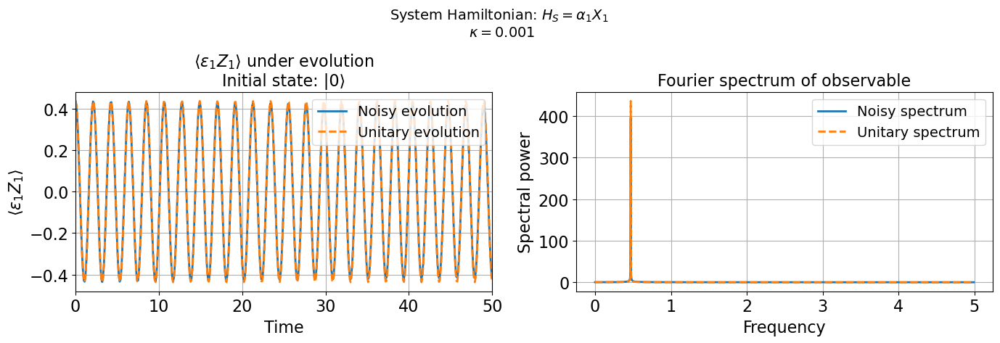

The dominant frequency from the Fourier transform is: 0.4698 (units of 1/time)


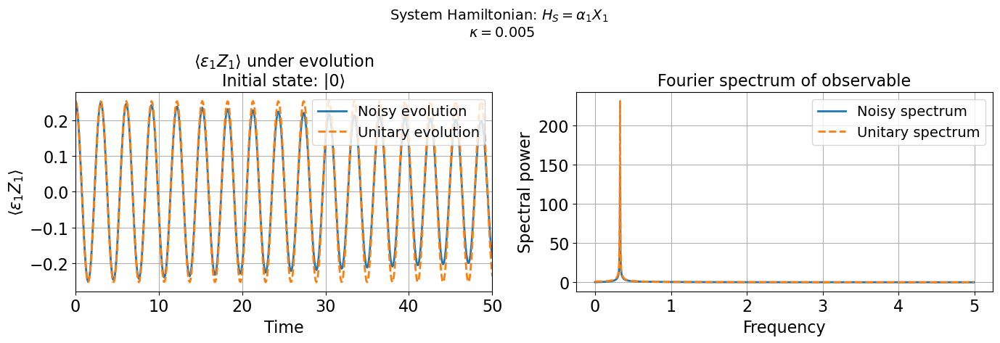

The dominant frequency from the Fourier transform is: 0.3298 (units of 1/time)


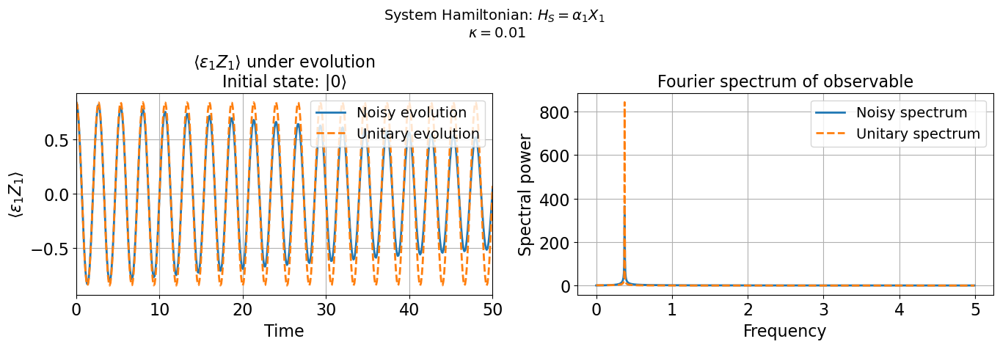

The dominant frequency from the Fourier transform is: 0.3748 (units of 1/time)


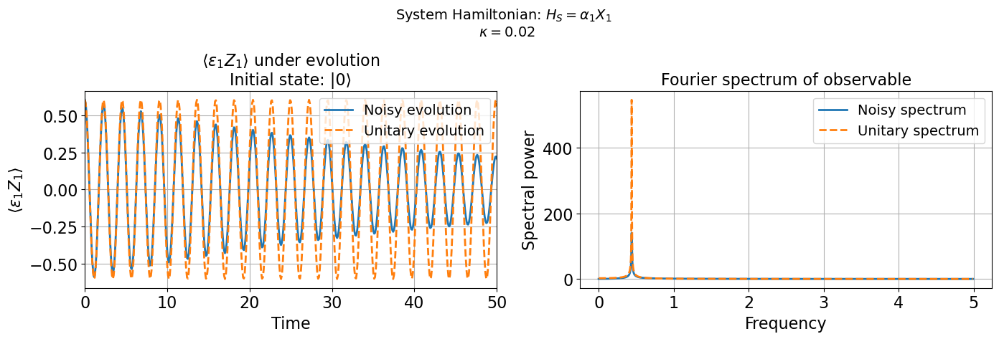

The dominant frequency from the Fourier transform is: 0.4398 (units of 1/time)


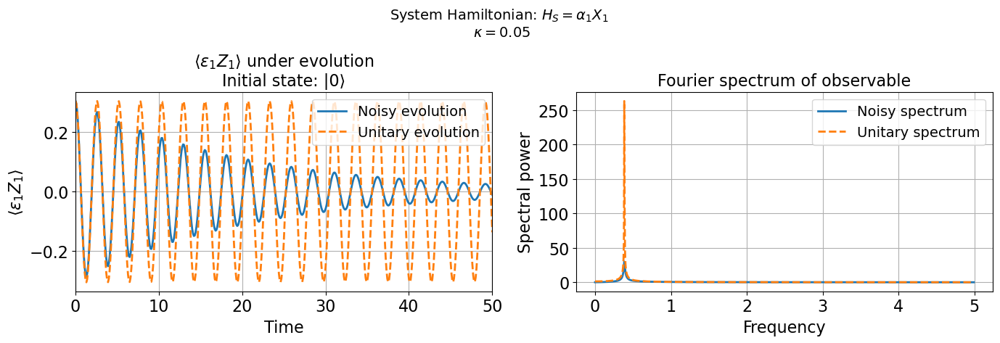

The dominant frequency from the Fourier transform is: 0.3848 (units of 1/time)


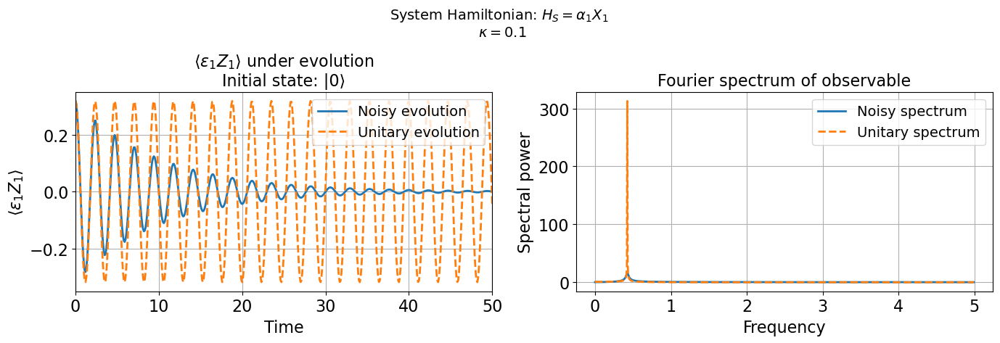

The dominant frequency from the Fourier transform is: 0.4248 (units of 1/time)


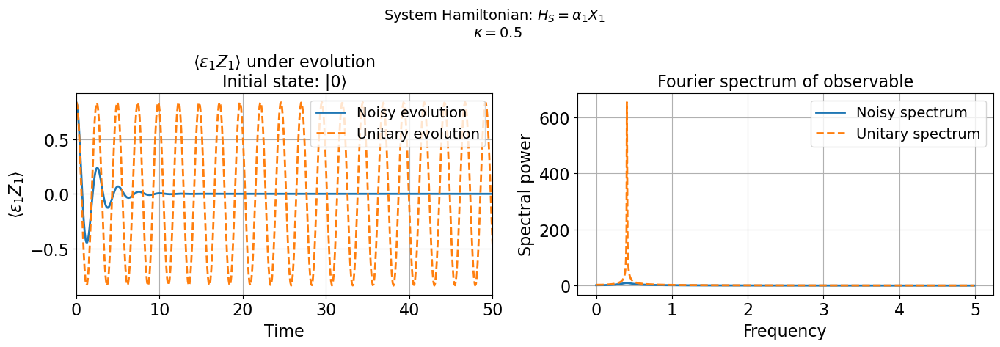

The dominant frequency from the Fourier transform is: 0.4048 (units of 1/time)


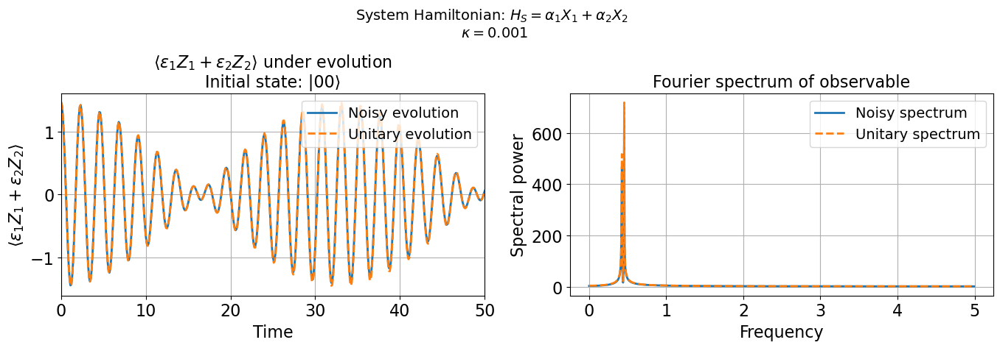

The dominant frequency from the Fourier transform is: 0.4548 (units of 1/time)


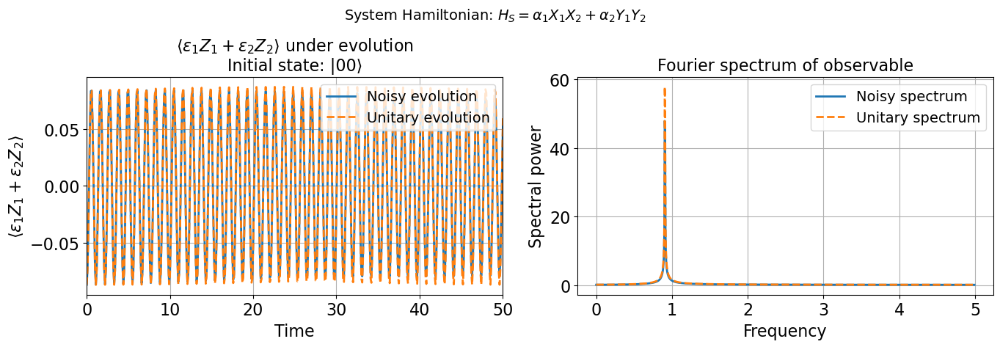

The dominant frequency from the Fourier transform is: 0.9045 (units of 1/time)


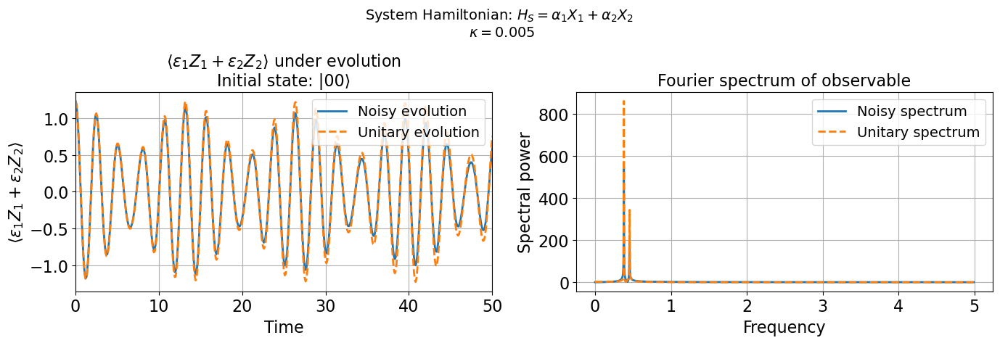

The dominant frequency from the Fourier transform is: 0.3798 (units of 1/time)


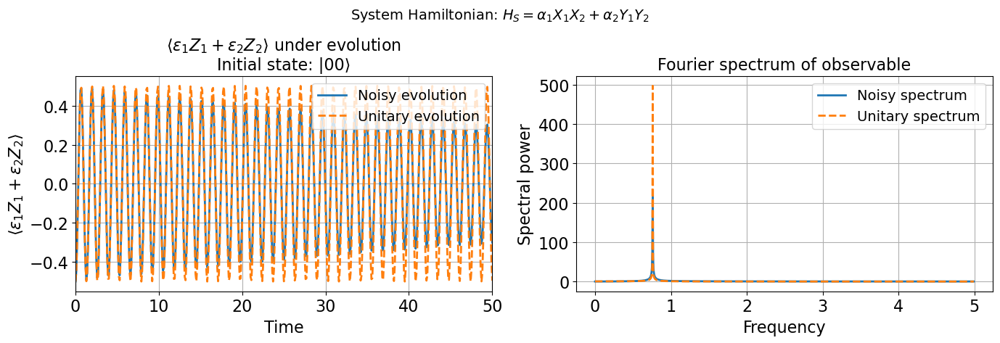

The dominant frequency from the Fourier transform is: 0.7596 (units of 1/time)


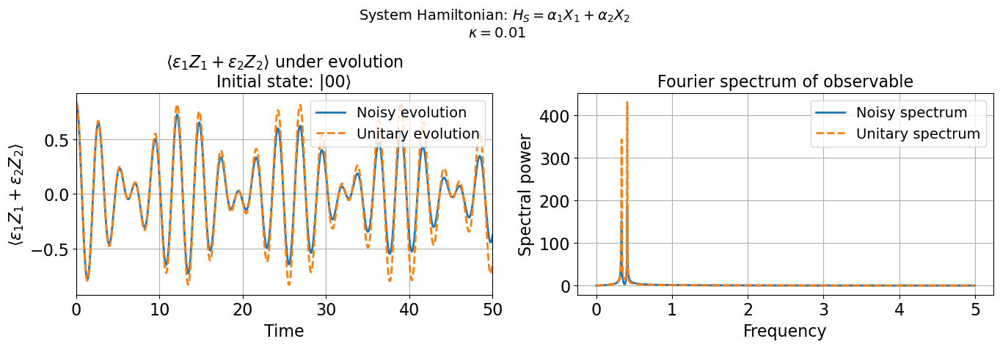

The dominant frequency from the Fourier transform is: 0.4098 (units of 1/time)


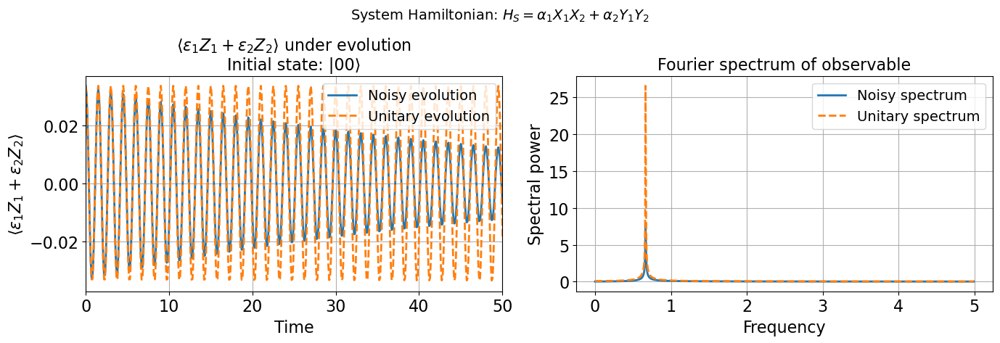

The dominant frequency from the Fourier transform is: 0.6647 (units of 1/time)


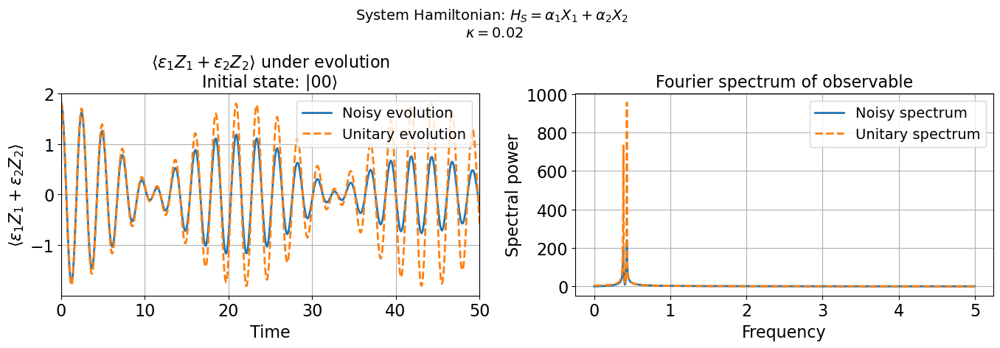

The dominant frequency from the Fourier transform is: 0.4298 (units of 1/time)


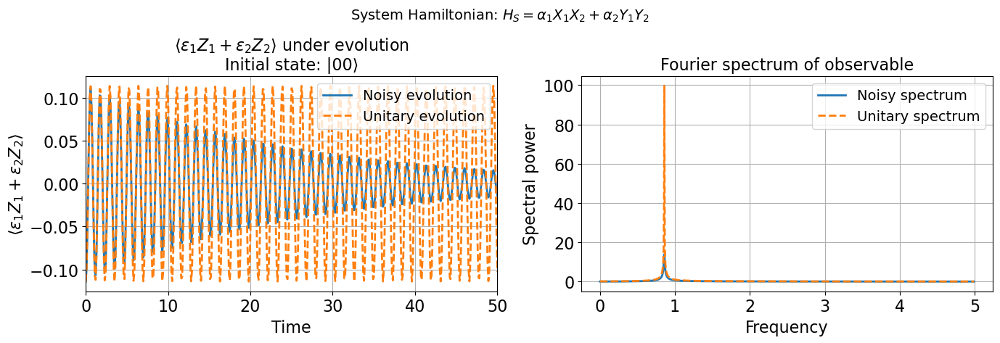

The dominant frequency from the Fourier transform is: 0.8596 (units of 1/time)


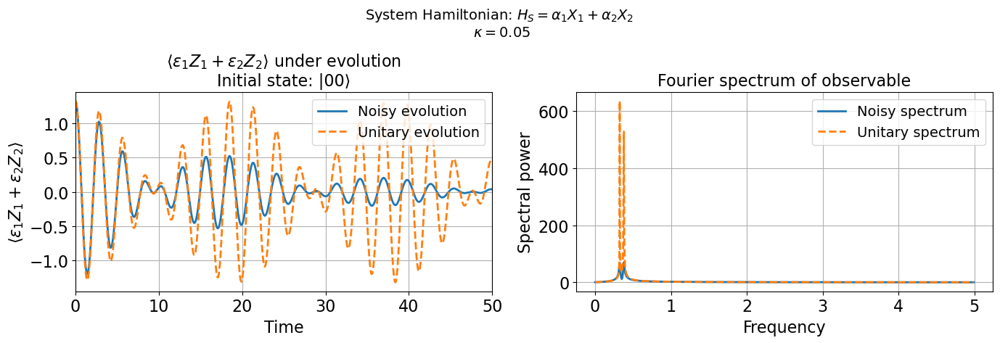

The dominant frequency from the Fourier transform is: 0.3798 (units of 1/time)


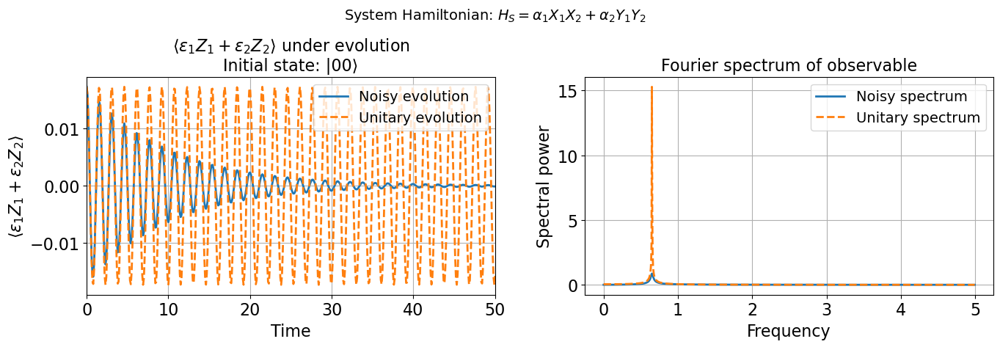

The dominant frequency from the Fourier transform is: 0.6497 (units of 1/time)


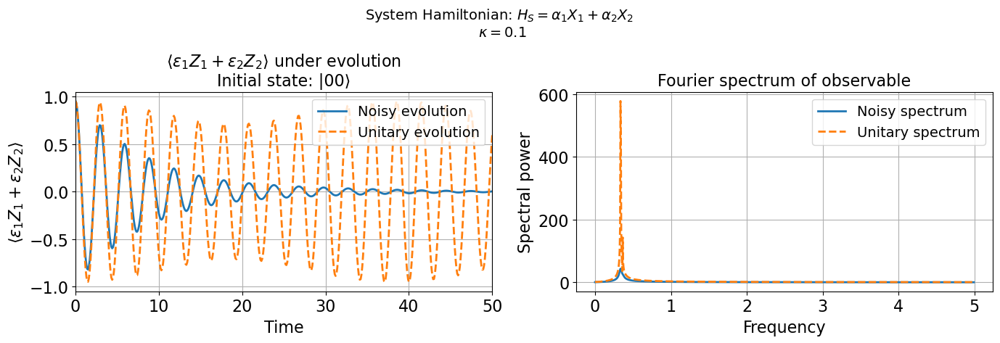

The dominant frequency from the Fourier transform is: 0.3348 (units of 1/time)


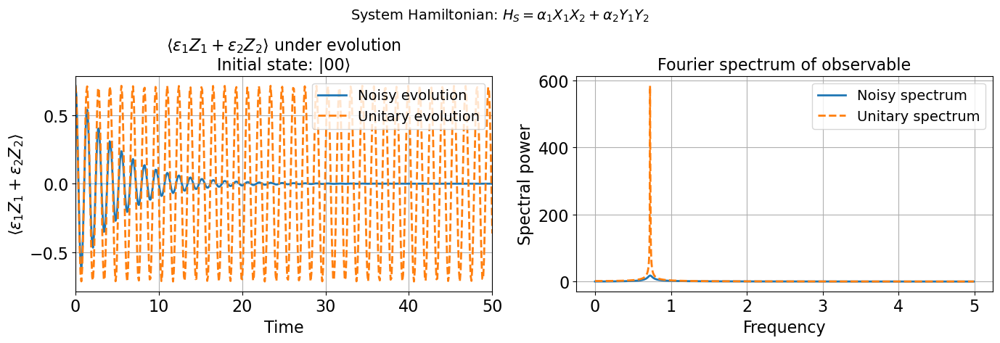

The dominant frequency from the Fourier transform is: 0.7246 (units of 1/time)


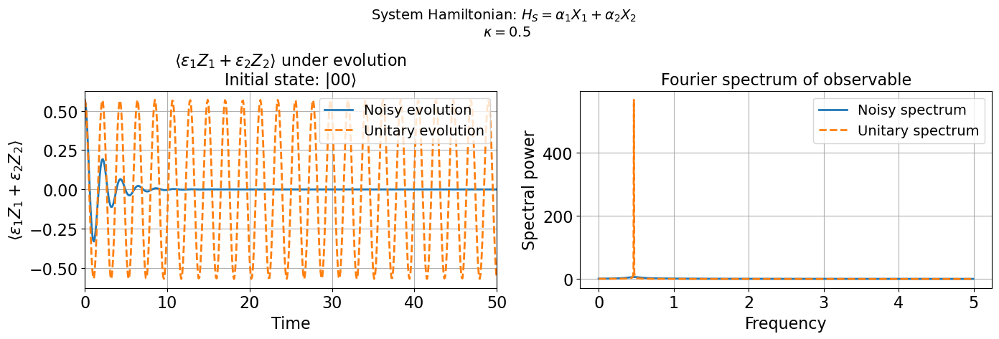

The dominant frequency from the Fourier transform is: 0.4648 (units of 1/time)


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os

np.random.seed(42)

# Parameters
num_qubits = 1
for num_qubits in [1, 2, 3, 4, 5]:  # Different number of qubits
    layout = 'horizontal'  # Change to 'horizontal' for horizontal layout
    y = 0.95  # Adjust the y position of the suptitle

        # Coupling strengths and other parameters
    for kappa in [0.001, 0.005, 0.01,0.02,0.05 , 0.1, 0.5]:  # Different coupling strengths
        tlist = np.linspace(0, 200, 2000)
        epsilon = np.random.uniform(0.1, 1.0, num_qubits)
        alpha_list = np.random.uniform(1, 1.5, 15)
        beta_list = np.random.uniform(1, 1.5, 15)
        alpha = np.array(alpha_list)
        beta = np.array(beta_list)

        # Save path
        save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\c_ops\{num_qubits}QUBITS"
        if not os.path.exists(save_base_path):
            os.makedirs(save_base_path)
        def build_op(op_qubit, pos):
            ops = [qeye(2) for _ in range(num_qubits)]
            ops[pos] = op_qubit
            return tensor(ops)

        # Pauli operators
        X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
        Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
        Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]

        # Observable
        Z_ops_qubits = [tensor([sigmaz() if j == i else qeye(2) for j in range(num_qubits)]) for i in range(num_qubits)]
        observable_op = sum(epsilon[i] * Z_ops_qubits[i] for i in range(num_qubits))

        # System Hamiltonians
        Hs_1 = sum(alpha[i] * X_ops[i] for i in range(num_qubits))
        Hs_2 = sum(alpha[i] *( X_ops[i] * X_ops[i + 1] + Y_ops[i] * Y_ops[i + 1]) for i in range(num_qubits - 1))

        # Initial state
        psi = tensor([basis(2, 0) for _ in range(num_qubits)])

        # Collapse operators (pure dephasing)
        c_ops = [np.sqrt(kappa) * Z_ops[i] for i in range(num_qubits)]

        # Evolution loop
        for i in range(2):
            if i == 0:
                H = Hs_1
                state= psi
            else:
                if num_qubits == 1:
                    continue
                H = Hs_2
                state = tensor([basis(2, 1)] + [basis(2, 0) for _ in range(1, num_qubits)])


            # Noisy evolution with dephasing
            result_noisy = mesolve(H, state, tlist, c_ops)

            # Unitary evolution
            result_unitary = sesolve(H, state, tlist)

            observable_noisy = []
            observable_unitary = []

            for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
                rho_noisy = noisy_state.ptrace(list(range(num_qubits)))
                val_noisy = expect(observable_op, rho_noisy)
                observable_noisy.append(val_noisy)

                rho_unitary = unitary_state.ptrace(list(range(num_qubits)))
                val_unitary = expect(observable_op, rho_unitary)
                observable_unitary.append(val_unitary)

            # Fourier Transform
            energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
            energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
            freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

            # Select only positive frequencies
            pos_mask = freqs >= 0
            freqs = freqs[pos_mask]
            spectrum_noisy = energy_noisy_fft[pos_mask]
            spectrum_unitary = energy_unitary_fft[pos_mask]

            # Plotting
            if layout == 'vertical':
                fig, axs = plt.subplots(2, 1, figsize=(8, 10))

            else:
                fig, axs = plt.subplots(1, 2, figsize=(14, 5))


            # Create Hamiltonian title string
            if i == 0:
                ham_title = r'System Hamiltonian: $H_S = '
                for j in range(num_qubits):
                    ham_title += fr'\alpha_{j+1} X_{j+1}'
                    if j < num_qubits - 1:
                        ham_title += ' + '
                ham_title += "$ \n $\kappa= "+str(kappa)+'$'
                title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
            else:
                # For the second Hamiltonian with nearest-neighbor interactions
                ham_title = r'System Hamiltonian: $H_S = '
                for j in range(num_qubits - 1):
                    ham_title += fr'\alpha_{2*j+1} X_{j+1} X_{j+2} + \alpha_{2*j+2} Y_{j+1} Y_{j+2}'
                    if j < num_qubits - 2:
                        ham_title += ' + '
                    ham_title += '$'
                title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
            
            # Left: Observable
            fig.suptitle(ham_title, fontsize=14, y=y)
            if num_qubits == 1:
                obs_label = r'$\langle ' + fr'\epsilon_1 Z_1 \rangle$'
            else:
                obs_label = r'$\langle ' + ' + '.join([fr'\epsilon_{i+1} Z_{i+1}' for i in range(num_qubits)]) + r'\rangle$'
            axs[0].set_xlim(0,50)
            axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
            axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution', lw=2, color='tab:orange')
            axs[0].set_xlabel('Time')
            axs[0].set_ylabel(obs_label)
            axs[0].set_title(f'{obs_label} under evolution\nInitial state: |{"0"*num_qubits}⟩')
            axs[0].legend(loc='upper right')
            axs[0].grid(True)

            # Right: Fourier spectrum
            axs[1].plot(freqs, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
            axs[1].plot(freqs, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
            axs[1].set_xlabel('Frequency')
            axs[1].set_ylabel('Spectral power')
            axs[1].set_title('Fourier spectrum of observable')
            axs[1].legend(loc='upper right')
            axs[1].grid(True)

            # Save and show
            name = f"{num_qubits}_Hs_{i}_"+str(kappa)+".pdf"
            os.makedirs(save_base_path, exist_ok=True)
            filename = os.path.join(save_base_path, name)
            plt.tight_layout()
            plt.savefig(filename, bbox_inches='tight')
            plt.show()

            # Print dominant frequency
            idx_peak = np.argmax(spectrum_noisy)
            freq_peak = freqs[idx_peak]
            print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")

## N QUBIT CODE FOR C_OPS (X)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os

np.random.seed(42)
kappa = 0.01 # coupling strength for pure dephasing
tlist = np.linspace(0, 200, 1000)
epsilon = np.random.uniform(0.1, 1.0, 15)
alpha = np.random.uniform(0.1, 1.5, 20)
# Parameters
for num_qubits in [1, 2, 3, 4]:  # Change this to the desired number of qubits



    # Save path
    save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\c_ops\{num_qubits}QUBITS"
    if not os.path.exists(save_base_path):
        os.makedirs(save_base_path)
    def build_op(op_qubit, pos):
        ops = [qeye(2) for _ in range(num_qubits)]
        ops[pos] = op_qubit
        return tensor(ops)

    # Pauli operators
    X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
    Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
    Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]


    # Observable operator acting only on the qubits' Hilbert space
    X_ops_qubits = [tensor([sigmax() if j == i else qeye(2) for j in range(num_qubits)]) for i in range(num_qubits)]
    observable_op = sum(epsilon[i] * X_ops_qubits[i] for i in range(num_qubits))

    # System Hamiltonians
    Hs_1 = 0
    for i in range(num_qubits):
        Hs_1 += alpha[i]* Z_ops[i]
    def get_initial_state(num_qubits):
        if num_qubits == 1:
            return (basis(2, 0) + basis(2, 1)).unit()  # |+⟩
        else:
            # Producto de |+⟩ en cada qubit
            plus = (basis(2, 0) + basis(2, 1)).unit()
            return tensor([plus] * num_qubits)
    psi = get_initial_state(num_qubits)
    # Collapse operators (pure dephasing)
    c_ops = [np.sqrt(kappa) * X_ops[i] for i in range(num_qubits)]


    # Noisy evolution with dephasing
    result_noisy = mesolve(Hs_1, psi, tlist, c_ops)

    # Unitary evolution
    result_unitary = sesolve(Hs_1, psi, tlist)

    observable_noisy = []
    observable_unitary = []

    for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
        rho_noisy = noisy_state.ptrace(list(range(num_qubits)))
        val_noisy = expect(observable_op, rho_noisy)
        observable_noisy.append(val_noisy)

        rho_unitary = unitary_state.ptrace(list(range(num_qubits)))
        val_unitary = expect(observable_op, rho_unitary)
        observable_unitary.append(val_unitary)

    # Fourier Transform
    energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
    energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
    freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

    # Select only positive frequencies
    pos_mask = freqs >= 0
    freqs = freqs[pos_mask]
    spectrum_noisy = energy_noisy_fft[pos_mask]
    spectrum_unitary = energy_unitary_fft[pos_mask]

    # Plotting
    if layout == 'vertical':
        fig, axs = plt.subplots(2, 1, figsize=(8, 10))
    else:
        fig, axs = plt.subplots(1, 2, figsize=(14, 5))


    ham_title = r'System Hamiltonian: $H_S = '
    for j in range(num_qubits):
        ham_title += fr'\alpha_{j+1} Z_{j+1}'
        if j < num_qubits - 1:
            ham_title += ' + '
    ham_title += '$'
    title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    # Left: Observable
    fig.suptitle(ham_title, fontsize=14, y=y)
    if num_qubits == 1:
        obs_label = r'$\langle ' + fr'\epsilon_1 X_1 \rangle$'
    else:
        obs_label = r'$\langle ' + ' + '.join([fr'\epsilon_{i+1} X_{i+1}' for i in range(num_qubits)]) + r'\rangle$'

    axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
    axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution', lw=2, color='tab:orange')
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel(obs_label)
    axs[0].set_title(f'{obs_label} under evolution\nInitial state: 1/|{"0"*num_qubits}⟩ +|1{"0"*(num_qubits-1)}⟩')
    axs[0].legend(loc='upper right')
    axs[0].grid(True)

    # Right: Fourier spectrum
    axs[1].plot(freqs, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
    axs[1].plot(freqs, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
    axs[1].set_xlabel('Frequency')
    axs[1].set_ylabel('Spectral power')
    axs[1].set_title('Fourier spectrum of observable')
    axs[1].legend(loc='upper right')
    axs[1].grid(True)

    # Save and show
    name = f"{num_qubits}_{3}_c_ops_code.png"
    os.makedirs(save_base_path, exist_ok=True)
    filename = os.path.join(save_base_path, name)
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

    # Find the dominant frequency in the noisy spectrum
    idx_peak = np.argmax(spectrum_noisy)

    # Find the dominant frequency in the noisy spectrum
    idx_peak = np.argmax(spectrum_noisy)

    # Use the frequency corresponding to the peak in the noisy spectrum
    freq_peak = freqs[idx_peak]
    # Find the dominant frequency in the unitary spectrum
    idx_peak_unitary = np.argmax(spectrum_unitary)

    # Use the frequency corresponding to the unitary in the noisy spectrum
    freq_peak_unitary =freqs[idx_peak_unitary]
    print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
    print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
    relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
    print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

# Observable with multiqubit terms

We define a **random symmetric coupling matrix** \( J_{ij} \) with entries sampled uniformly in \([0.7, 1.0]\), and then construct a **2-local observable** of the form:

$$
O = \sum_{i<j} J_{ij} Z_i Z_j
$$

where \( Z_i \) denotes the Pauli-Z operator acting on qubit \( i \).

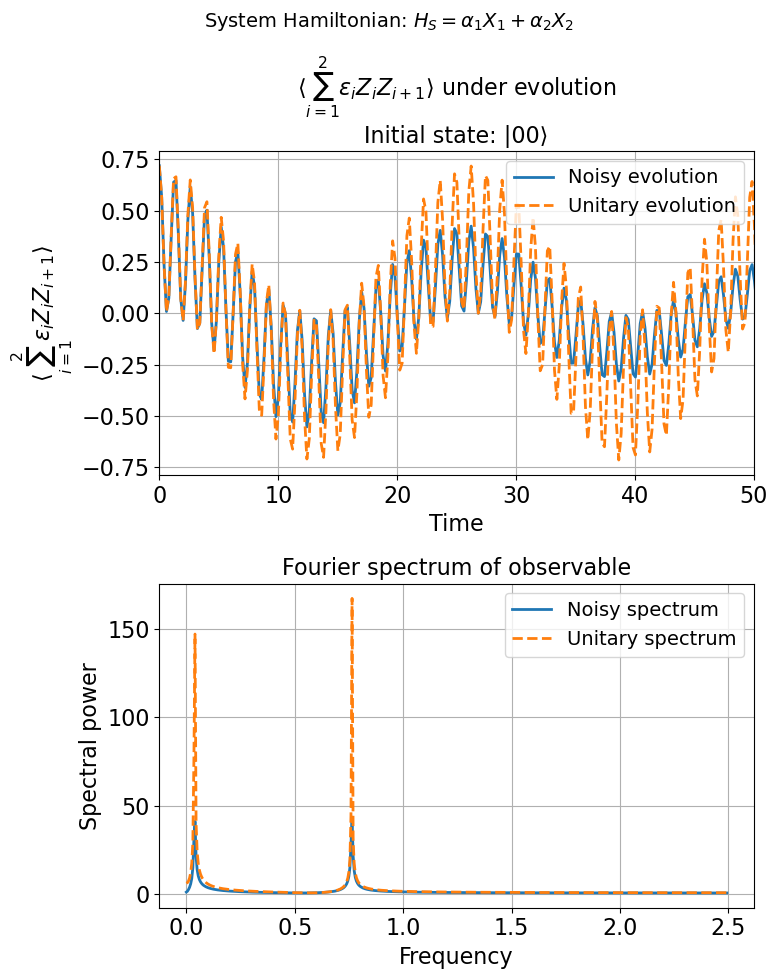

The dominant frequency from the Fourier transform is: 0.7642 (units of 1/time)
For 1 qubit, only the first Hamiltonian is applicable.


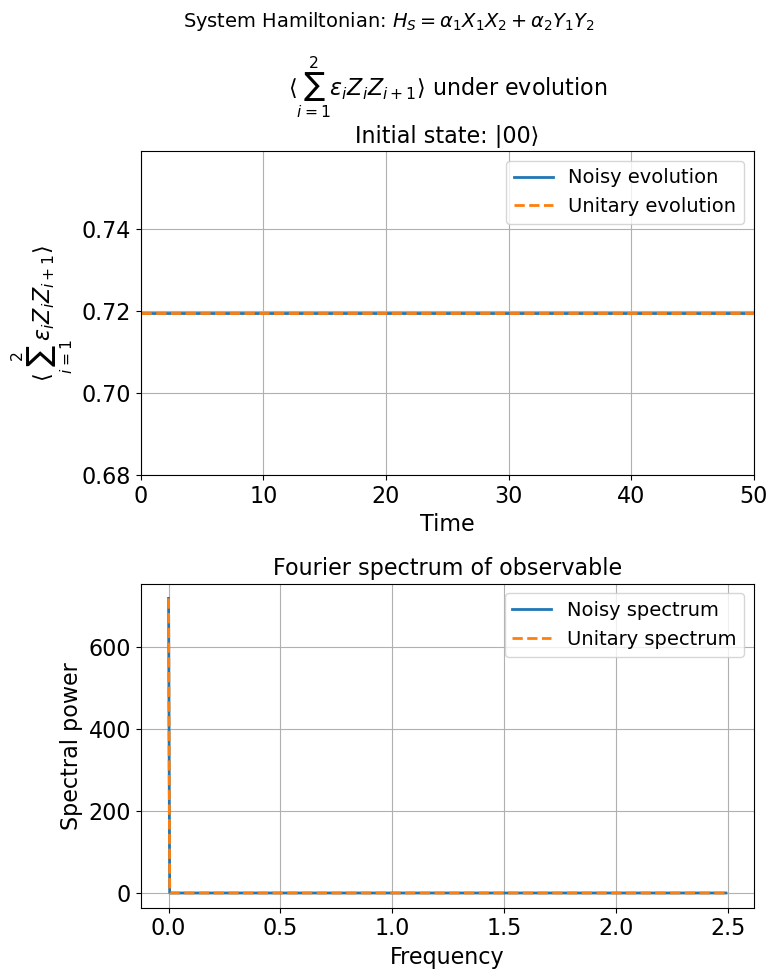

The dominant frequency from the Fourier transform is: 0.0000 (units of 1/time)


In [10]:
import numpy as np
import matplotlib.pyplot as plt
from qutip import *
import os

np.random.seed(42)

# Parameters
num_qubits = 2

kappa = 0.01 # coupling strength for pure dephasing
tlist = np.linspace(0, 200, 1000)
epsilon = np.random.uniform(0.1, 1.0, num_qubits)
alpha_list = np.random.uniform(0.6, 1.5, 15)
beta_list = np.random.uniform(0.6, 1.5, 15)
alpha = np.array(alpha_list)
beta = np.array(beta_list)

# Save path
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\c_ops\{num_qubits}QUBITS"
if not os.path.exists(save_base_path):
    os.makedirs(save_base_path)
def build_op(op_qubit, pos):
    ops = [qeye(2) for _ in range(num_qubits)]
    ops[pos] = op_qubit
    return tensor(ops)

# Pauli operators
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]

# Observable
Z_ops_qubits = [tensor([sigmaz() if j == i else qeye(2) for j in range(num_qubits)]) for i in range(num_qubits)]
J = np.zeros((num_qubits, num_qubits))
for i in range(num_qubits):
    for j in range(i+1, num_qubits):
        J[i][j] = np.random.uniform(0.7, 1.0)
        J[j][i] = J[i][j]  # ensure symmetry

# Build the 2-local observable: sum_{i<j} J_ij * Z_i Z_j
observable_op = sum(J[i][j] * Z_ops[i] * Z_ops[j]
                    for i in range(num_qubits)
                    for j in range(i+1, num_qubits))

# System Hamiltonians
Hs_1 = sum(alpha[i] * X_ops[i] for i in range(num_qubits))
Hs_2 = sum(alpha[i] *( X_ops[i] * X_ops[i + 1] + Y_ops[i] * Y_ops[i + 1]) for i in range(num_qubits - 1))

# Initial state
psi = tensor([basis(2, 0) for _ in range(num_qubits)])

# Collapse operators (pure dephasing)
c_ops = [np.sqrt(kappa) * Z_ops[i] for i in range(num_qubits)]

# Evolution loop
for i in range(2):
    if i == 0:
        H = Hs_1
        state= psi
    else:
        state = tensor([basis(2, 1)] + [basis(2, 0) for _ in range(1, num_qubits)])
        if num_qubits == 1:
            continue
        H = Hs_2
        if num_qubits == 2:
            state = tensor(basis(2, 0), basis(2, 0))
            print("For 1 qubit, only the first Hamiltonian is applicable.")
            #continue
       


    # Noisy evolution with dephasing
    result_noisy = mesolve(H, state, tlist, c_ops)

    # Unitary evolution
    result_unitary = sesolve(H, state, tlist)

    observable_noisy = []
    observable_unitary = []

    for noisy_state, unitary_state in zip(result_noisy.states, result_unitary.states):
        rho_noisy = noisy_state.ptrace(list(range(num_qubits)))
        val_noisy = expect(observable_op, rho_noisy)
        observable_noisy.append(val_noisy)

        rho_unitary = unitary_state.ptrace(list(range(num_qubits)))
        val_unitary = expect(observable_op, rho_unitary)
        observable_unitary.append(val_unitary)

    # Fourier Transform
    energy_noisy_fft = np.abs(np.fft.fft(observable_noisy))
    energy_unitary_fft = np.abs(np.fft.fft(observable_unitary))
    freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

    # Select only positive frequencies
    pos_mask = freqs >= 0
    freqs = freqs[pos_mask]
    spectrum_noisy = energy_noisy_fft[pos_mask]
    spectrum_unitary = energy_unitary_fft[pos_mask]

    # Plotting
    if layout == 'vertical':
        fig, axs = plt.subplots(2, 1, figsize=(8, 10))

    else:
        fig, axs = plt.subplots(1, 2, figsize=(14, 5))


    # Create Hamiltonian title string
    if i == 0:
        ham_title = r'System Hamiltonian: $H_S = '
        for j in range(num_qubits):
            ham_title += fr'\alpha_{j+1} X_{j+1}'
            if j < num_qubits - 1:
                ham_title += ' + '
        ham_title += '$'
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    else:
        # For the second Hamiltonian with nearest-neighbor interactions
        ham_title = r'System Hamiltonian: $H_S = '
        for j in range(num_qubits - 1):
            ham_title += fr'\alpha_{2*j+1} X_{j+1} X_{j+2} + \alpha_{2*j+2} Y_{j+1} Y_{j+2}'
            if j < num_qubits - 2:
                ham_title += ' + '
            ham_title += '$'
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    
    # Left: Observable
    fig.suptitle(ham_title, fontsize=14, y=y)
    if num_qubits == 1:
        obs_label = r'$\langle ' + fr'\epsilon_1 Z_1 \rangle$'
    else:
        obs_label = r'$\langle \sum_{i=1}^{%d} \epsilon_i Z_iZ_{i+1} \rangle$' % num_qubits
    axs[0].set_xlim(0,50)
    axs[0].plot(tlist, observable_noisy, label='Noisy evolution', lw=2, color='tab:blue')
    axs[0].plot(tlist, observable_unitary, '--', label='Unitary evolution', lw=2, color='tab:orange')
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel(obs_label)
    axs[0].set_title(f'{obs_label} under evolution\nInitial state: |{"0"*num_qubits}⟩')
    axs[0].legend(loc='upper right')
    axs[0].grid(True)

    # Right: Fourier spectrum
    axs[1].plot(freqs, spectrum_noisy, label='Noisy spectrum', lw=2, color='tab:blue')
    axs[1].plot(freqs, spectrum_unitary, '--', label='Unitary spectrum', lw=2, color='tab:orange')
    axs[1].set_xlabel('Frequency')
    axs[1].set_ylabel('Spectral power')
    axs[1].set_title('Fourier spectrum of observable')
    axs[1].legend(loc='upper right')
    axs[1].grid(True)

    # Save and show
    name = f"{num_qubits}_{i}_c_ops_code.png"
    os.makedirs(save_base_path, exist_ok=True)
    filename = os.path.join(save_base_path, name)
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()

    # Print dominant frequency
    idx_peak = np.argmax(spectrum_noisy)
    freq_peak = freqs[idx_peak]
    print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")

# Ohmic Bath

## N QUBIT CODE WITH OHMIC BATH (Hsb Z)

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import qutip as qt
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
from qutip import *
import os
import re
np.random.seed(43)

# Parameters - USER CAN CHANGE THESE
num_qubits = 2 # Change this to the desired number of qubits
tlist = np.linspace(0, 20, 100)
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz\{num_qubits}QUBITS"
# Generate random coefficients for the Hamiltonian and observable

epsilon = np.random.uniform(0.7, 1.2, num_qubits)  # Coefficients for observable
alpha_list = np.random.uniform(0.6, 1.1, 2 * num_qubits + 1) 
alpha = np.array(alpha_list)

max_depth = 4




def build_op(op_qubit, pos):
    """Build an operator acting on position 'pos' in the full Hilbert space"""
    ops = [qeye(2) for _ in range(num_qubits)]
    ops[pos] = op_qubit
    return tensor(ops)

# Create Pauli operators for all qubits
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]


# Observable operator acting only on the qubits' Hilbert space
observable_op = sum(epsilon[i] * Z_ops[i] for i in range(num_qubits))

# Create list of baths
# Define a single Ohmic environment to reuse for all qubits
env = qt.OhmicEnvironment(T=0.1, alpha=0.01, wc=3, s=0.7)
approx_env, info = env.approx_by_cf_fit(tlist, target_rsme=None, Nr_max=3, Ni_max=3, maxfev=1e8)
baths = [(approx_env, Z_ops[i]) for i in range(num_qubits)]
# System Hamiltonian: Nearest-neighbor XX and YY interactions
Hs_1 = 0
for i in range(num_qubits):
    Hs_1 += alpha[i]* X_ops[i]
Hs_2 = 0
for i in range(num_qubits-1):
    Hs_2+= alpha[i] * X_ops[i] * X_ops[i+1]  # XX coupling
    Hs_2 += alpha[2*i+1] * Y_ops[i] * Y_ops[i+1]  # YY coupling


# Initial state: all qubits in |0⟩ and all bath modes in vacuum
zero_state = tensor([basis(2, 0) for _ in range(num_qubits)])
one_state = tensor([basis(2, 1)]+[basis(2, 0) for _ in range(1,num_qubits)])
psi_1 = zero_state.unit()
psi_2 = one_state.unit()

for i in range(2):
    if i == 0:
        Hs = Hs_1
        psi = psi_1
    else:
        if num_qubits == 1:
            print("For 1 qubit, only the first Hamiltonian is applicable.")
            continue
        else:
            Hs = Hs_2
            psi = psi_2

    # HEOM evolution
    solver = HEOMSolver(Hs, baths, max_depth=max_depth, options=Options(nsteps=10000))
    rho0 = ket2dm(psi)
    print(f"Initial state trace: {rho0.tr()}")  # Should be 1.
    result = solver.run(rho0, tlist)
    observable_vals = []


    for state in  result.states:
        rho = state.ptrace(list(range(num_qubits)))  # Full state for all qubits
        rho = rho / rho.tr()  # Normalize the state
        val = expect(observable_op, rho)  # Expectation value of the observable
        # Append the expectation value to the list
        observable_vals.append(val)

    # Fourier Transform
    energy_fft = np.abs(np.fft.fft(observable_vals))
    freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

    # Select only positive frequencies
    pos_mask = freqs > 0
    freqs = freqs[pos_mask]
    energy_fft = energy_fft[pos_mask]
    result_unitary = sesolve(Hs, psi, tlist)
    observable_vals_unitary = []
    for state_unitary in result_unitary.states:
            rho_unitary = state_unitary.ptrace(list(range(num_qubits)))
            rho_unitary = rho_unitary / rho_unitary.tr()
            val_unitary = expect(observable_op, rho_unitary)
            observable_vals_unitary.append(val_unitary)

    # FFT for unitary evolution
    fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
    freqs_unitary = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
    pos_mask_unitary = freqs_unitary > 0

    # Aplica el filtro correcto
    fft_unitary = fft_unitary[pos_mask_unitary]
    freqs_unitary = freqs_unitary[pos_mask_unitary]

    # Plotting
    if layout == 'vertical': #Layout was defined at the beginning of the jupyter notebook
        fig, axs = plt.subplots(2, 1, figsize=(8, 10))
    else:
        fig, axs = plt.subplots(1, 2, figsize=(14, 5))


    # Create Hamiltonian title string
    if i == 0:
        ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_i X_i$' % num_qubits
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    else:
        # For the second Hamiltonian with nearest-neighbor interactions
        ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_{i} X_i X_{i+1} + \beta_{i} Y_i Y_{i+1}$' % num_qubits
        title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')
    obs_label=r'$\langle \sum_{i=1}^{%d} \epsilon_i Z_i \rangle$' % num_qubits

    # Left: Observable
    fig.suptitle(ham_title, fontsize=14, y=y)
    axs[0].plot(tlist, observable_vals, label='Noisy Evolution', lw=2)
    axs[0].set_xlabel('Time')
    axs[0].set_ylabel(obs_label)
    axs[0].set_title(f'Initial state: |{"0"*num_qubits}⟩')
    axs[0].plot(tlist, observable_vals_unitary, label="Unitary evolution", linestyle="--", lw=2)
    axs[0].legend( loc='upper right')
    axs[0].grid(True)

    # Right: Fourier spectrum
    axs[1].plot(freqs, energy_fft, label='Spectrum', lw=2)
    axs[1].set_xlabel('Frequency')
    axs[1].set_ylabel('Spectral power')
    axs[1].set_title('Fourier spectrum of observable')
    axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
    axs[1].legend( loc='upper right')
    axs[1].grid(True)

    # Save and show
    name = f"{num_qubits}_{i}_general_code_1.png"
    os.makedirs(save_base_path, exist_ok=True)
    filename = os.path.join(save_base_path,"general")
    plt.tight_layout()
    plt.savefig(filename, bbox_inches='tight')
    plt.show()



    # Find the dominant frequency in the noisy spectrum
    idx_peak = np.argmax(energy_fft)

    # Use the frequency corresponding to the peak in the noisy spectrum
    freq_peak = freqs[idx_peak]
    # Find the dominant frequency in the unitary spectrum
    idx_peak_unitary =  np.argmax(fft_unitary)

    # Use the frequency corresponding to the unitary in the noisy spectrum
    freq_peak_unitary =freqs[idx_peak_unitary]
    print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
    print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
    relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
    print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")

## N QUBIT CODE WITH OHMIC BATH MODEL (Hsb X)

In [ ]:

import numpy as np
import matplotlib.pyplot as plt
import qutip as qt
from qutip.solver.heom import DrudeLorentzBath, HEOMSolver
from qutip import *
import os
import re
np.random.seed(43)

# Parameters - USER CAN CHANGE THESE
num_qubits = 2 # Change this to the desired number of qubits
tlist = np.linspace(0, 20, 100)
save_base_path = rf"C:\Users\jalej\OneDrive\Escritorio\Documentos\Master\Segundo Cuatri\TFM\To Lianao\Graphs\systembath\Drude_Lorentz\{num_qubits}QUBITS"
# Generate random coefficients for the Hamiltonian and observable

epsilon = np.random.uniform(0.7, 1.2, num_qubits)  # Coefficients for observable
alpha_list = np.random.uniform(0.6, 1.1, 2 * num_qubits + 1) 
alpha = np.array(alpha_list)


def build_op(op_qubit, pos):
    """Build an operator acting on position 'pos' in the full Hilbert space"""
    ops = [qeye(2) for _ in range(num_qubits)]
    ops[pos] = op_qubit
    return tensor(ops)

# Create Pauli operators for all qubits
X_ops = [build_op(sigmax(), i) for i in range(num_qubits)]
Y_ops = [build_op(sigmay(), i) for i in range(num_qubits)]
Z_ops = [build_op(sigmaz(), i) for i in range(num_qubits)]


# Observable operator acting only on the qubits' Hilbert space
observable_op = sum(epsilon[i] * X_ops[i] for i in range(num_qubits))

# Create list of baths
# Define a single Ohmic environment to reuse for all qubits
env = qt.OhmicEnvironment(T=0.1, alpha=0.01, wc=3, s=0.7)
approx_env, info = env.approx_by_cf_fit(tlist, target_rsme=None, Nr_max=3, Ni_max=3, maxfev=1e8)
baths = [(approx_env, Z_ops[i]) for i in range(num_qubits)]
# System Hamiltonian: Nearest-neighbor XX and YY interactions
Hs_1 = 0
for i in range(num_qubits):
    Hs_1 += alpha[i]* Z_ops[i]



zero_state = tensor([basis(2, 0) for _ in range(num_qubits)])
one_state = tensor([basis(2, 1)]+[basis(2, 0) for _ in range(1,num_qubits)])
psi = zero_state+one_state
psi = psi.unit()


# HEOM evolution
solver = HEOMSolver(Hs, baths, max_depth=max_depth, options=Options(nsteps=10000))
rho0 = ket2dm(psi)
print(f"Initial state trace: {rho0.tr()}")  # Should be 1.
result = solver.run(rho0, tlist)
observable_vals = []


for state in  result.states:
    rho = state.ptrace(list(range(num_qubits)))  # Full state for all qubits
    rho = rho / rho.tr()  # Normalize the state
    val = expect(observable_op, rho)  # Expectation value of the observable
    # Append the expectation value to the list
    observable_vals.append(val)

# Fourier Transform
energy_fft = np.abs(np.fft.fft(observable_vals))
freqs = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])

# Select only positive frequencies
pos_mask = freqs > 0
freqs = freqs[pos_mask]
energy_fft = energy_fft[pos_mask]
result_unitary = sesolve(Hs, psi, tlist)
observable_vals_unitary = []
for state_unitary in result_unitary.states:
        rho_unitary = state_unitary.ptrace(list(range(num_qubits)))
        rho_unitary = rho_unitary / rho_unitary.tr()
        val_unitary = expect(observable_op, rho_unitary)
        observable_vals_unitary.append(val_unitary)

# FFT for unitary evolution
fft_unitary = np.abs(np.fft.fft(observable_vals_unitary))
freqs_unitary = np.fft.fftfreq(len(tlist), d=tlist[1] - tlist[0])
pos_mask_unitary = freqs_unitary > 0

# Aplica el filtro correcto
fft_unitary = fft_unitary[pos_mask_unitary]
freqs_unitary = freqs_unitary[pos_mask_unitary]

# Plotting
if layout == 'vertical': #Layout was defined at the beginning of the jupyter notebook
    fig, axs = plt.subplots(2, 1, figsize=(8, 10))
else:
    fig, axs = plt.subplots(1, 2, figsize=(14, 5))


# Create Hamiltonian title string

ham_title = r'System Hamiltonian: $H_S = \sum_{i}^{%d} \alpha_i Z_i$'% num_qubits

title = ham_title.replace(r'\alpha', 'alpha').replace(r'\ ', '_').replace(' ', '_').replace('$', '').replace('{', '').replace('}', '')

# Left: Observable
fig.suptitle(ham_title, fontsize=14, y=y)
if num_qubits == 1:
    obs_label = r'$\langle ' + fr'\epsilon_1 X_1 \rangle$'
else:
    obs_label=r'$\langle \sum_{i=1}^{%d} \epsilon_i X_i \rangle$' % num_qubits
axs[0].plot(tlist, observable_vals, label='Noisy Evolution', lw=2)
axs[0].set_xlabel('Time')
axs[0].set_ylabel(obs_label)
axs[0].set_title(f'Initial state: |{"0"*num_qubits}⟩')
axs[0].plot(tlist, observable_vals_unitary, label="Unitary evolution", linestyle="--", lw=2)
axs[0].legend( loc='upper right')
axs[0].grid(True)

# Right: Fourier spectrum
axs[1].plot(freqs, energy_fft, label='Spectrum', lw=2)
axs[1].set_xlabel('Frequency')
axs[1].set_ylabel('Spectral power')
axs[1].set_title('Fourier spectrum of observable')
axs[1].plot(freqs, fft_unitary, label="Unitary", linestyle="--", lw=2)
axs[1].legend( loc='upper right')
axs[1].grid(True)

# Save and show
name = f"{num_qubits}_2_ohmic.png"
os.makedirs(save_base_path, exist_ok=True)
filename = os.path.join(save_base_path,name)
plt.tight_layout()
plt.savefig(filename, bbox_inches='tight')
plt.show()



# Find the dominant frequency in the noisy spectrum
idx_peak = np.argmax(energy_fft)

# Use the frequency corresponding to the peak in the noisy spectrum
freq_peak = freqs[idx_peak]
# Find the dominant frequency in the unitary spectrum
idx_peak_unitary =  np.argmax(fft_unitary)

# Use the frequency corresponding to the unitary in the noisy spectrum
freq_peak_unitary =freqs[idx_peak_unitary]
print(f"The dominant frequency from the Fourier transform is: {freq_peak:.4f} (units of 1/time)")
print(f"The dominant frequency from the Fourier transform (unitary) is: {freq_peak_unitary:.4f} (units of 1/time)")
relative_error = abs(freq_peak - freq_peak_unitary) / freq_peak_unitary * 100
print(f"The relative error between the noisy and unitary dominant frequencies is: {relative_error:.2f}%")